# ISFA 2024-205 - Apprentissage Supervisé: Predicting Actual Cost of Insurance Claims using Different Machine Learning Models.

ADJEDJOGO Elavagnon Mathias - M1ES<br>
ASSOUMANA KALME ANZA Abdoul Barik - M1ES<br>
CEREZO DE LA ROCA Manuel - M1ES <br>

#### *Abstract*

This Machine Learning project was developed as part of the *Apprentissage Supervisé* course at the *Institut de Sciences Financières et d'Assurance* in Lyon, France. Its main objective was to infer missing values in the *Coût Ultime* dependent variable within a panel-type database spanning from 1988 to 2006. The project followed a standard data analysis and ML workflow, with particular emphasis on Exploratory Data Analysis and Feature Engineering. Several regression, classification, and boosting algorithms were evaluated using four key metrics—Residual Mean Squared Error, Mean Absolute Error, R-squared, and Inference Time. CatBoost regression emerged as the top performer across all error metrics, but last in inference time; we believe that given the problem at hand, were latency is not a big priority, the difference in inference time does not changed our decision to use the CatBoost model for out-of-sample data prediction. In addition, six features proved most influential: the logarithmic *Coût Initial*, Topic Scores, Effective Hourly Wage, Time Regime, Time-to-Communication, and Claim-to-Salary. To refine the model further, an Optuna hyperparameter optimization was performed with a Huber loss function, aiming to better capture the impact of outliers. This was particularly relevant given the importance of outliers in the distribution of *Coût Ultime*, especially in relation to the log-transformed *Coût Initial*. Lastly, the trained CatBoost model was applied to estimate the missing *Coût Ultime* data points; the resulting distribution of the logarithmic change in *Coût Ultime* was statistically similar to that of *Coût Initial* once size effects were taken into account.

## **1. Introduction**
Accurately predicting the cost of insurance claims is a critical challenge in risk assessment and financial planning for insurers. Understanding the factors that drive claim costs not only improves pricing strategies but also enhances fraud detection and reserve allocation. However, claims data often suffer from missing values and high variance, making cost prediction a complex task that requires advanced statistical and machine learning techniques.

In this project, we leverage supervised machine learning to estimate missing values in the Coût Ultime variable—representing the final cost of an insurance claim—within a structured panel dataset covering claims from 1988 to 2006. This dataset consists of 45,672 observations and includes 16 variables, capturing policyholder demographics (age, gender, marital status, number of children), employment details (weekly salary, job type, working hours), and claim-specific information (accident date, initial claim cost, description, and final claim cost). A key challenge arises from the fact that Coût Ultime is missing in a substantial portion of the dataset, requiring a robust approach to imputation.

To tackle this, we implemented a data-driven modeling approach following a standard machine learning workflow:

- Exploratory Data Analysis (EDA): Understanding the dataset, detecting missing values, and identifying key predictive features.
- Feature Engineering: Creating informative variables such as topic scores from claim descriptions and transformed financial indicators.
- Model Selection & Evaluation: Testing multiple regression techniques—including boosting models like CatBoost—using performance metrics such as RMSE, MAE, R², and inference time.
- Hyperparameter Optimization: Fine-tuning the best model (CatBoost) using Optuna with a Huber loss function to better manage outliers.
- Prediction & Analysis: Applying the trained model to estimate missing claim costs and analyzing the resulting distributions.

## **2. Methodology**

### **1. Univariate and Bivariate Data Analysis**
We first conducted **univariate analysis** (summary statistics, histograms, boxplots) to detect missing values and outliers. Additionally, **bivariate analysis** (correlation matrices, scatter plots) was performed to explore relationships between variables.

### **2. Logarithmic Transformations**
Logarithmic transformations were applied to **highly skewed variables** (e.g., *Coût Initial* and *Coût Ultime*) to stabilize variance and improve linearity in models:

$$
X' = \log(X + 1)
$$

where \( X' \) is the transformed variable and \( X \) is the original variable. This transformation also mitigates the impact of extreme values.

### **3. Isolation Forest for Outlier Detection**
Outliers were identified and removed using **Isolation Forest (IForest)**, an unsupervised anomaly detection algorithm based on recursive data partitioning. The anomaly score is given by:

$$
s(X, n) = 2^{-\frac{E(h(X))}{c(n)}}
$$

where:
- \( h(X) \) is the average path length of \( X \) in the isolation trees,
- \( E(h(X)) \) is the expected path length,
- \( c(n) \) is a normalizing factor.

A **low contamination parameter** was used, and the model was applied only to **variables with heavy-tailed distributions**.

### **4. Latent Dirichlet Allocation (LDA) Model**
To transform **textual claim descriptions** into quantitative features, we used **Latent Dirichlet Allocation (LDA)**. LDA models text as a mixture of topics, where each topic is a mixture of words:

$$
p(w_d) = \sum_{k=1}^{K} p(w_d | z_d = k) p(z_d = k)
$$

where:
- \( w_d \) is a word in document \( d \),
- \( z_d \) is the topic assignment,
- \( K \) is the number of topics.

Each claim description was assigned **topic probabilities**, creating new numerical features for regression.

### **5. Machine Learning Models**
We tested multiple **supervised learning models**, including:

- **Multiple Linear Regression (MLR)**:

  $$
  Y = \beta_0 + \sum_{i=1}^{n} \beta_i X_i + \epsilon
  $$

- **Decision Trees**: Rule-based partitioning of data.
- **Random Forest**: Ensemble of decision trees reducing variance.
- **ElasticNet**: Linear model with **L1 + L2 regularization**.
- **XGBoost**: Gradient boosting with tree ensembles.

#### **CatBoost (Final Model)**
CatBoost optimizes the following objective function:

$$
L = \sum_{i=1}^{n} l(y_i, f(x_i)) + \lambda \sum_{j=1}^{p} ||w_j||^2
$$

where:
- \( L \) is the total loss,
- \( l(y_i, f(x_i)) \) is the prediction error,
- \( \lambda \) is the regularization parameter.

### **6. Huber Loss Function**
To improve robustness, we used the **Huber Loss function**, which blends squared loss (for small errors) and absolute loss (for large errors):

$$
L_{\delta}(a) =
\begin{cases}
\frac{1}{2} a^2 & \text{for } |a| \leq \delta, \\
\delta (|a| - \frac{1}{2} \delta) & \text{for } |a| > \delta.
\end{cases}
$$

This **reduces sensitivity to outliers**, crucial for our **heavy-tailed cost distributions**.

### **7. Model Performance Metrics**
To evaluate our models, we used the following metrics:

- **Root Mean Squared Error (RMSE):**

  $$
  RMSE = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}
  $$

- **Mean Absolute Error (MAE):**

  $$
  MAE = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|
  $$

- **R-squared (\(R^2\)):**

  $$
  R^2 = 1 - \frac{\sum_{i} (y_i - \hat{y}_i)^2}{\sum_{i} (y_i - \bar{y})^2}
  $$

- **Inference Time**: Measures the time required for model predictions.

### **8. Optuna Hyperparameter Optimization**
We optimized **CatBoost hyperparameters** using **Optuna**, an automated hyperparameter tuning framework:

$$
\theta^* = \arg \min_{\theta \in \Theta} f(\theta)
$$

where \( \theta \) are the hyperparameters and \( f(\theta) \) is the objective function. We used **Tree-structured Parzen Estimator (TPE)** to optimize learning rate, depth, and regularization parameters.

### **9. Out-of-Sample Prediction Assessment**
To validate our model's **out-of-sample predictions**, we compared the **log difference** of claim costs:

$$
\text{Coût Delta} = \log(\text{Coût Ultime}) - \log(\text{Coût Initial})
$$

Instead of comparing absolute costs, this approach captures **relative cost variations**, which are more stable. We applied:

- **T-Test for mean differences:**

  $$
  t = \frac{\bar{X}_1 - \bar{X}_2}{\sqrt{\frac{s_1^2}{n_1} + \frac{s_2^2}{n_2}}}
  $$

- **Cohen’s D for effect size:**

  $$
  d = \frac{|\bar{X}_1 - \bar{X}_2|}{s_p}
  $$

  where \( s_p \) is the pooled standard deviation.

- **Cumulative Distribution Function (CDF) Plot**: A visual method to compare empirical distributions.

These tests confirmed that our **predicted cost differences align well with observed patterns**, ensuring **model robustness**.


## **3. Results**

The following figures and tables summarize the results of our project. This table summarizes key data quality issues identified during Exploratory Data Analysis (EDA), including missing values and correlations between variables. It also outlines the actions taken to handle these issues, such as removing highly missing variables (e.g., patrimoine), imputing minor missing values (status_marital), and addressing potential multicollinearity.<br><br>


| Issue            | Variable(s)             | Key Findings                                              | Action Taken/Next Steps                                         |
|-----------------|------------------------|----------------------------------------------------------|----------------------------------------------------------------|
| Missing Values  | patrimoine             | 81.77% missing, significant data loss.                  | Removed from the dataset. Investigate reasons for missingness. |
| Missing Values  | status_marital         | 0.05% missing.                                           | Imputed with most frequent category. Evaluate imputation impact. |
| Correlations    | age, salaire_semaine, cost variables | Positive correlations with cost-related variables (e.g., cout_init, cout_ultime). | Further investigate nature/strength of relationships. Address multicollinearity. |
| Correlations    | heure_par_semaine, jour_par_semaine | Strong positive correlation, suggesting redundancy.      | Analyze further for variable selection.                         |

*Table 1. Data Quality Assessment Overview* <br><br>

This table provides an overview of the variables used in the Machine Learning model. It categorizes them based on their type, such as claim-related, temporal, claimant demographics, and text-derived features (from LDA topic modeling). It also describes how each variable was derived, including log transformations, categorical encoding, and computed time differences.<br><br>

| #  | Variable                         | Category              | Obtained From                                                   |
|----|----------------------------------|----------------------|----------------------------------------------------------------|
| 0  | log_cout_init                    | Claim Related        | Log transformation of the original "cout_init" (initial cost) column |
| 1  | claim_salary_category            | Claim Related        | Categorization based on claim salary ranges                    |
| 2  | time_to_com                      | Temporal             | Difference in days between "date_communication" and "date_accident" columns |
| 3  | time_regime                      | Temporal             | Duration of the claim regime                                    |
| 4  | accident_during_working_hours     | Accident Context     | Binary flag indicating if the accident occurred during working hours (8 AM - 6 PM) based on "date_accident" column |
| 5  | sexe                              | Claimant Demographics | Original dataset column                                         |
| 6  | type_emploi                      | Claimant Demographics | Original dataset column                                         |
| 7  | enfants                          | Claimant Demographics | Original dataset column                                         |
| 8  | effective_hourly_wage             | Claimant Demographics | Calculated as "log_salaire" divided by "heure_par_semaine"     |
| 9  | topic_0                           | Text-Derived (Topics) | Topic modeling applied to text descriptions                     |
| 10 | topic_1                           | Text-Derived (Topics) | Topic modeling applied to text descriptions                     |
| 11 | topic_2                           | Text-Derived (Topics) | Topic modeling applied to text descriptions                     |
| 12 | topic_3                           | Text-Derived (Topics) | Topic modeling applied to text descriptions                     |
| 13 | topic_4                           | Text-Derived (Topics) | Topic modeling applied to text descriptions                     |

*Table 2. Feature Engineering Overview*<br><br>

This table presents the performance evaluation of different Machine Learning models tested in the project, including Linear Regression, Decision Trees, Random Forest, Gradient Boosting, ElasticNet, XGBoost, and CatBoost. It compares them based on four key metrics. As we can see the CatBoost model achieved the best balance between accuracy and inference time, making it the final chosen model.


| #  | Model              | RMSE  | MAE   | R²    | Inference Time (seconds) |
|----|-------------------|------|------|------|------------------------|
| 0  | Linear Regression | 0.700 | 0.480 | 0.790 | 0.0435                 |
| 1  | Decision Tree     | 0.890 | 0.590 | 0.670 | 0.0291                 |
| 2  | Random Forest     | 0.670 | 0.450 | 0.810 | 0.0660                 |
| 3  | Gradient Boosting | 0.860 | 0.630 | 0.690 | 0.0422                 |
| 4  | ElasticNet        | 0.900 | 0.670 | 0.660 | 0.0948                 |
| 5  | XGBoost           | 0.630 | 0.410 | 0.830 | 0.0101                 |
| 6  | CatBoost          | 0.610 | 0.390 | 0.840 | 0.0982                 |

*Table 3. Model Key Performance Metrics Overview*<br><br>

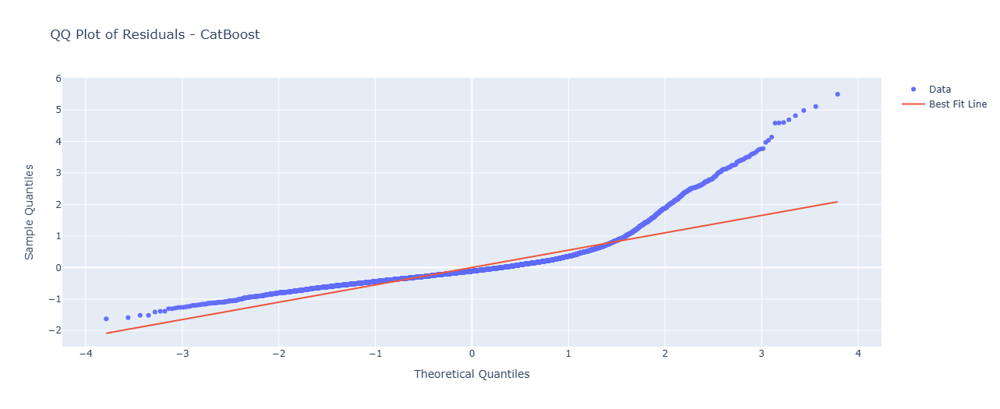
*Figure 1. QQ Plot of Model Final CatBoost Model Residuals*<br><br>

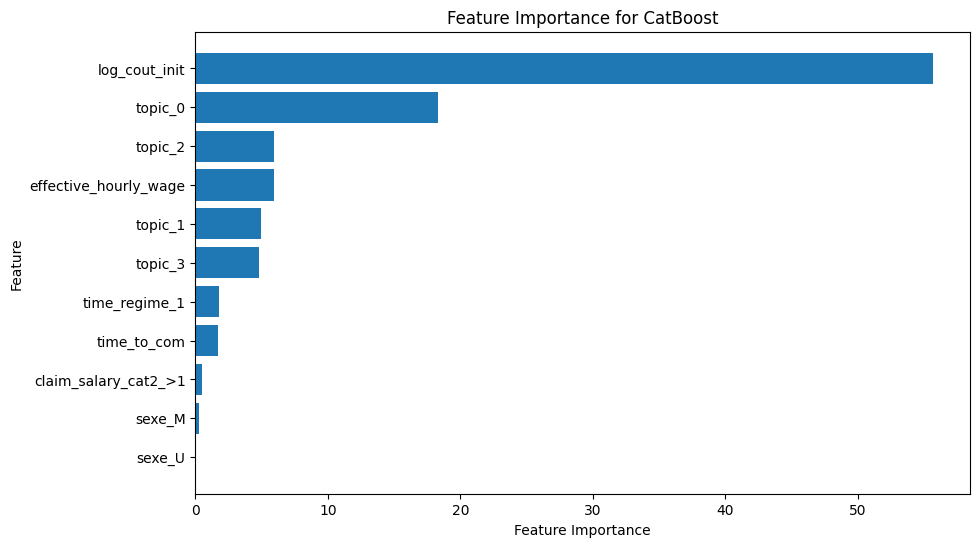
*Figure 2. Feature Importance Graph of Final CatBoost Model*<br><br>

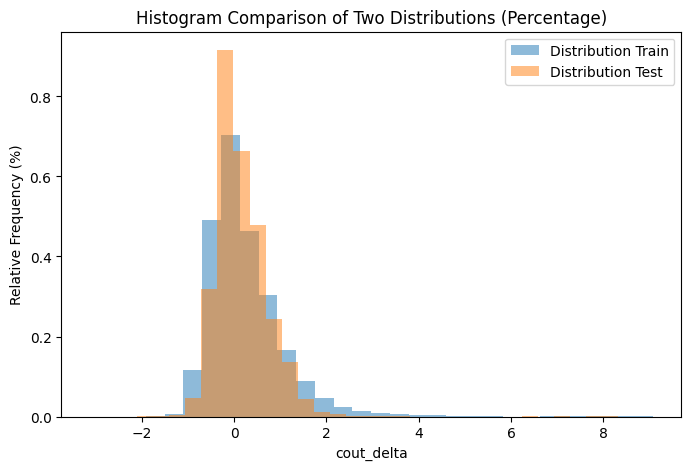
*Figure 3. Empirical PDF of Train Coût Delta and Test Coût Delta*<br><br>

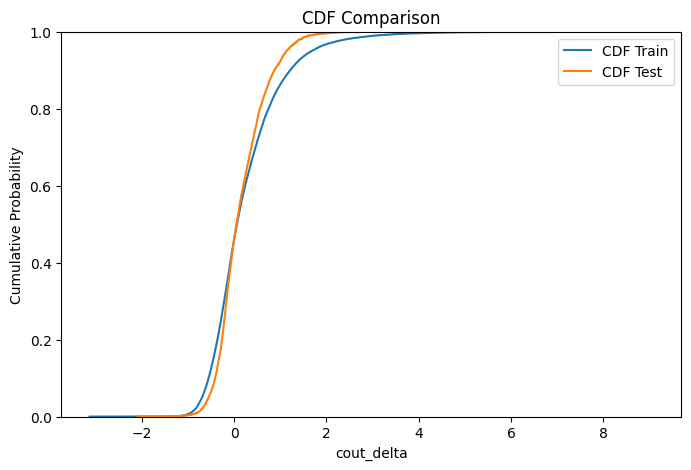
*Figure 4. Empirical CDF Train Coût Delta and Test Coût Delta*<br><br>

| Metric          | Value                     |
|------------------|---------------------------|
| T-Test Statistic | 11.7873                  |
| p-value          | \(6.1687 \times 10^{-32}\) |
| Cohen's d        | 0.1210                   |

*Table 4. T-Test and Cohen's D Results*<br><br>

In [ ]:
from IPython.display import display, HTML

Issue,Variable(s),Key Findings,Action Taken/Next Steps
Missing Values,patrimoine,"81.77% missing, significant data loss.",Removed from the dataset. Investigate reasons for missingness.
Missing Values,status_marital,0.05% missing.,Imputed with most frequent category. Evaluate imputation impact.
Correlations,"age, salaire_semaine, cost variables","Positive correlations with cost-related variables (e.g., cout_init, cout_ultime).",Further investigate nature/strength of relationships. Address multicollinearity.
Correlations,"heure_par_semaine, jour_par_semaine","Strong positive correlation, suggesting redundancy.",Analyze further for variable selection.
,Variable,Category,Obtained From
0,log_cout_init,Claim Related,"Log transformation of the original ""cout_init"" (initial cost) column"
1,claim_salary_category,Claim Related,Categorization based on claim salary ranges
2,time_to_com,Temporal,"Difference in days between ""date_communication"" and ""date_accident"" columns"
3,time_regime,Temporal,Duration of the claim regime
4,accident_during_working_hours,Accident Context,"Binary flag indicating if the accident occurred during working hours (8 AM - 6 PM) based on ""date_accident"" column"


<ipython-input-2-793833b8ba2a>:79: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y=metric, data=sorted_data, palette=palette, order=sorted_data['Model'])


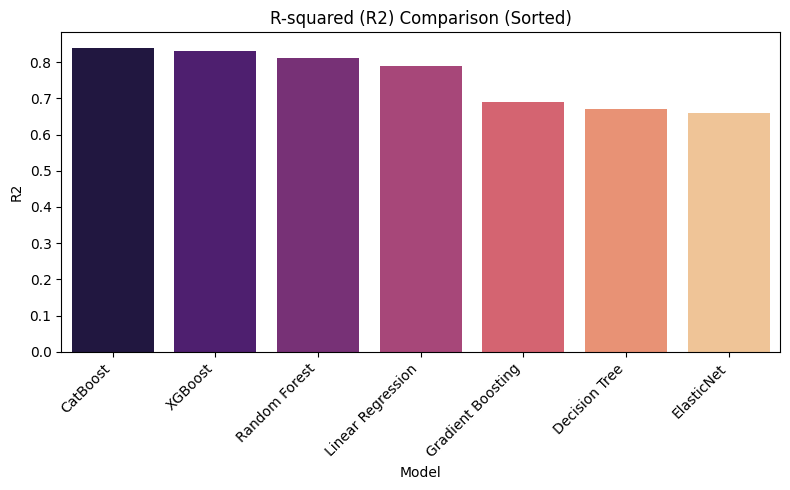

<ipython-input-2-793833b8ba2a>:79: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y=metric, data=sorted_data, palette=palette, order=sorted_data['Model'])


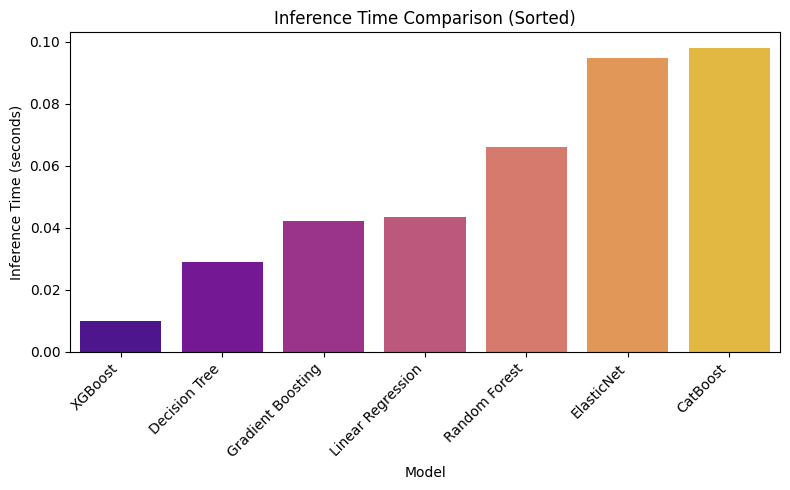

<ipython-input-2-793833b8ba2a>:79: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y=metric, data=sorted_data, palette=palette, order=sorted_data['Model'])


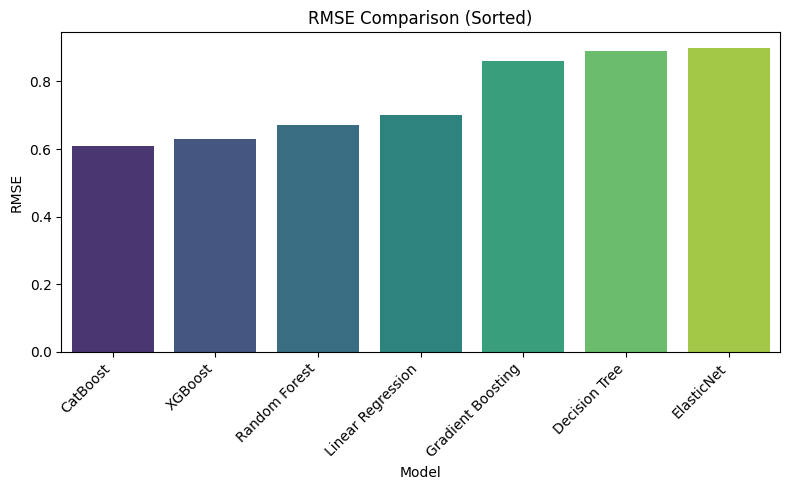

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Data for the first table (Data Quality Assessment)
table_data0 = [
    {'Issue': 'Missing Values', 'Variable(s)': 'patrimoine', 'Key Findings': '81.77% missing, significant data loss.', 'Action Taken/Next Steps': 'Removed from the dataset. Investigate reasons for missingness.'},
    {'Issue': 'Missing Values', 'Variable(s)': 'status_marital', 'Key Findings': '0.05% missing.', 'Action Taken/Next Steps': 'Imputed with most frequent category. Evaluate imputation impact.'},
    {'Issue': 'Correlations', 'Variable(s)': 'age, salaire_semaine, cost variables', 'Key Findings': 'Positive correlations with cost-related variables (e.g., cout_init, cout_ultime).', 'Action Taken/Next Steps': 'Further investigate nature/strength of relationships. Address multicollinearity.'},
    {'Issue': 'Correlations', 'Variable(s)': 'heure_par_semaine, jour_par_semaine', 'Key Findings': 'Strong positive correlation, suggesting redundancy.', 'Action Taken/Next Steps': 'Analyze further for variable selection.'}
]
summary_table0 = pd.DataFrame(table_data0)
styled_table0 = summary_table0.style.set_properties(**{
    'background-color': 'white',
    'color': 'black',
    'border-color': 'lightgray',
    'border-width': '1px',
    'text-align': 'left'
}).set_table_styles([
    {
        'selector': 'th',
        'props': [
            ('background-color', '#f2f2f2'),
            ('font-weight', 'bold'),
            ('text-align', 'center')
        ]
    }
]).hide(axis="index")

# Data for the second table (Features and Their Derivation)
variable_data = [
    {'Variable': 'log_cout_init', 'Category': 'Claim Related', 'Obtained From': 'Log transformation of the original "cout_init" (initial cost) column'},
    {'Variable': 'claim_salary_category', 'Category': 'Claim Related', 'Obtained From': 'Categorization based on claim salary ranges'},
    {'Variable': 'time_to_com', 'Category': 'Temporal', 'Obtained From': 'Difference in days between "date_communication" and "date_accident" columns'},
    {'Variable': 'time_regime', 'Category': 'Temporal', 'Obtained From': 'Duration of the claim regime'},
    {'Variable': 'accident_during_working_hours', 'Category': 'Accident Context', 'Obtained From': 'Binary flag indicating if the accident occurred during working hours (8 AM - 6 PM) based on "date_accident" column'},
    {'Variable': 'sexe', 'Category': 'Claimant Demographics', 'Obtained From': 'Original dataset column'},
    {'Variable': 'type_emploi', 'Category': 'Claimant Demographics', 'Obtained From': 'Original dataset column'},
    {'Variable': 'enfants', 'Category': 'Claimant Demographics', 'Obtained From': 'Original dataset column'},
    {'Variable': 'effective_hourly_wage', 'Category': 'Claimant Demographics', 'Obtained From': 'Calculated as "log_salaire" divided by "heure_par_semaine"'},
    {'Variable': 'topic_0', 'Category': 'Text-Derived (Topics)', 'Obtained From': 'Topic modeling applied to text descriptions'},
    {'Variable': 'topic_1', 'Category': 'Text-Derived (Topics)', 'Obtained From': 'Topic modeling applied to text descriptions'},
    {'Variable': 'topic_2', 'Category': 'Text-Derived (Topics)', 'Obtained From': 'Topic modeling applied to text descriptions'},
    {'Variable': 'topic_3', 'Category': 'Text-Derived (Topics)', 'Obtained From': 'Topic modeling applied to text descriptions'},
    {'Variable': 'topic_4', 'Category': 'Text-Derived (Topics)', 'Obtained From': 'Topic modeling applied to text descriptions'}
]
variable_summary_df = pd.DataFrame(variable_data)
styled_table1 = variable_summary_df.style.set_properties(**{
    'background-color': 'white',
    'color': 'black',
    'border-color': 'lightgray',
    'border-width': '1px',
    'text-align': 'left'
}).set_table_styles([
    {
        'selector': 'th',
        'props': [
            ('background-color', '#f2f2f2'),
            ('font-weight', 'bold'),
            ('text-align', 'center')
        ]
    }
])

# Data for the third table (Model Performance Comparison)
Models_data = {
    'Model': ['Linear Regression', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'ElasticNet', 'XGBoost', 'CatBoost'],
    'RMSE': [0.70, 0.89, 0.67, 0.86, 0.90, 0.63, 0.61],
    'MAE': [0.48, 0.59, 0.45, 0.63, 0.67, 0.41, 0.39],
    'R2': [0.79, 0.67, 0.81, 0.69, 0.66, 0.83, 0.84],
    'Inference Time (seconds)': [0.0435, 0.0291, 0.0660, 0.0422, 0.0948, 0.0101, 0.0982]
}
results = pd.DataFrame(Models_data)

# Function for bar charts
def create_sorted_bar_chart(data, metric, title, palette='viridis'):
    sorted_data = data.sort_values(by=[metric], ascending=(metric != 'R2'))
    plt.figure(figsize=(8, 5))
    sns.barplot(x='Model', y=metric, data=sorted_data, palette=palette, order=sorted_data['Model'])
    plt.title(title + " (Sorted)")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Create HTML for vertical layout
html_str = "<h3>Data Quality Assessment</h3>"
html_str += f"<div>{styled_table0.to_html()}</div><br>"
html_str += "<h3>Features and Their Derivation</h3>"
html_str += f"<div>{styled_table1.to_html()}</div><br>"
html_str += "<h3>Model Performance Comparison</h3>"
# The change is in this line below
html_str += f"<div>{results.style.set_properties(**{'text-align': 'center'}).set_caption('Model Performance Comparison').set_table_styles([{'selector': 'th', 'props': [('background-color', '#f2f2f2'), ('font-weight', 'bold')]}]).to_html()}</div>"
# Removed an extra set of curly braces: {{'selector': 'th', ...}}  to  {'selector': 'th', ...}

# Display the HTML and charts
display(HTML(html_str))
create_sorted_bar_chart(results, 'R2', 'R-squared (R2) Comparison', palette='magma')
create_sorted_bar_chart(results, 'Inference Time (seconds)', 'Inference Time Comparison', palette='plasma')
create_sorted_bar_chart(results, 'RMSE', 'RMSE Comparison', palette='viridis')

# 1. Environment Setup

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# =====================================
# 1.1. LIBRARIES SETUP WITH PIP
# =====================================

!pip install missingno       # For missing data visualization
!pip install pyod            # For outlier detection
!pip install bitermplus      # For text analysis
!pip install gensim          # For topic modeling
!pip install pyLDAvis        # For topic visualization
!pip install pingouin        # For advanced statistical tests
!pip install pingouin        # For cross-var. analysis
!pip install catboost        # For regression
!pip install --upgrade xgboost # For Regression
!pip install optuna          # For hyperparam optimization
!pip install nltk            # For word tokenizations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.6/169.6 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyod: filename=pyod-2.0.3-py3-none-any.whl size=200466 sha256=95675818c068875122d5a0dde81fe55c15859a53645660b6d6ce1df80003a084
  Stored in directory: /root/.cache/pip/wheels/2d/60/5b/f74eccd2c9c892a2c298202ca510f10995f9940647fcc2d97f
Successfully built pyod
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.4/264.4 kB 4.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for bitermplus: filename=bitermplus-0.7.0-cp311-cp311-linux_x86_64.whl size=1040533 sha256=4ad6983b7cef5fb0464d7f6cc8ed12912cad8b65653b72fa0a4c96220bca74c3
  Stored in directory: /root/.cache/pip/wheels/43/4f/7c/1154da317c03d3b86b8c843f3c3908aff955df8a771e4e5e52
Successfully built bitermplus
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 25.0 MB/s eta 0:00

In [ ]:
# =====================================
# 1.2. DEPENDENCIES SETUP
# =====================================

import pandas as pd
import numpy as np
import math
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pingouin as pg

# Outlier detection
from pyod.models.iforest import IForest

# Gensim for Topic Modeling
from gensim.models import LdaModel
from gensim.corpora import Dictionary

# Sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# CatBoost Regressor
from catboost import CatBoostRegressor

# Hyperparameter Bayesian Optimization
import optuna

# Scipy & Statsmodels
from scipy.stats import chi2_contingency
from statsmodels.graphics.mosaicplot import mosaic
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

# NLTK
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, RegexpTokenizer

# pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models
import pickle

# pingouin for correlations
import pingouin as pg

# Ensure necessary NLTK data is downloaded
nltk.download('punkt')
nltk.download('stopwords')

# Time library
import time
import datetime as dt

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# Ensure necessary NLTK data is downloaded
# Download the missing 'punkt_tab' data using NLTK Downloader:
import nltk
nltk.download('punkt_tab')
nltk.download('punkt')
nltk.download('stopwords')

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# =====================================
# 1.3. Functions List
# =====================================

# Missing Values
def review_missing_values(df):
    """
    Reviews and prints the count and percentage of missing values in a DataFrame.
    """
    missing_data = df.isnull().sum()
    missing_percentage = (missing_data / len(df)) * 100

    missing_summary = pd.DataFrame({
        'Missing Count': missing_data,
        'Missing Percentage': missing_percentage
    }).sort_values(by='Missing Count', ascending=False)

    print("Missing Values Overview:")
    print(missing_summary[missing_summary['Missing Count'] > 0])
    return missing_summary

# Optiomal Bins
def sturges_rule(data):
    return int(np.ceil(np.log2(len(data)) + 1))

def rice_rule(data):
    return int(np.ceil(2 * len(data) ** (1 / 3)))

def freedman_diaconis_rule(data):
    q25, q75 = np.percentile(data, [25, 75])
    iqr = q75 - q25
    bin_width = 2 * iqr / len(data) ** (1 / 3)
    bins = int(np.ceil((data.max() - data.min()) / bin_width))
    return max(1, bins)  # At least 1 bin

def sqrt_rule(data):
    return int(np.ceil(np.sqrt(len(data))))

def optimal_bins(data, method='freedman_diaconis'):
    if method == 'sturges':
        return sturges_rule(data)
    elif method == 'rice':
        return rice_rule(data)
    elif method == 'freedman_diaconis':
        return freedman_diaconis_rule(data)
    elif method == 'sqrt':
        return sqrt_rule(data)
    else:
        raise ValueError("Unknown method. Choose from 'sturges', 'rice', 'freedman_diaconis', 'sqrt'.")

# Text Preprocessing
def preprocess_text(text):
    stop_words = set(stopwords.words("english"))
    words = word_tokenize(text)
    words = [word for word in words if word.isalpha() and word not in stop_words]
    return ' '.join(words)

# Assign Topic Distributions to Each Description
def get_topic_distribution(text):
    bow = dictionary.doc2bow(text)
    topic_dist = lda_model.get_document_topics(bow, minimum_probability=0.0)
    return [prob for _, prob in topic_dist]

# Fonction pour calculer la somme des carrés entre groupes (SCEB)
def SCEB(x, gpe):
    moyennes = x.groupby(gpe).mean()  # Moyennes par groupe
    effectifs = x.groupby(gpe).size()  # Effectifs par groupe
    moyenne_totale = x.mean()  # Moyenne totale
    sceb = sum(effectifs * (moyennes - moyenne_totale) ** 2)  # Somme des carrés entre groupes
    return sceb

# Fonction pour calculer eta² (proportion de variance expliquée)
def eta2(x, gpe):
    sceb = SCEB(x, gpe)  # Somme des carrés entre groupes
    scet = sum((x - x.mean()) ** 2)  # Somme des carrés totales
    return sceb / scet

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# 2. Data Import & Preliminary Exploration

- Gain insights into the dataset structure (dimensions, data types, and missing values).
- Understand the distribution of variables through descriptive statistics and visualizations.
- Identify and handle missing values, outliers, or inconsistencies.

In [ ]:
# =====================================
# 2.1. Data Import
# =====================================

# Data Importing: read a csv file with pandas

try:
    df = pd.read_csv("train_etu.csv", encoding="latin1")  # Adjust encoding if needed
except UnicodeDecodeError:
    print("Failed to decode. Trying with a different encoding...")
    import chardet
    with open("train_etu.csv", "rb") as f:
        result = chardet.detect(f.read())
    detected_encoding = result['encoding']
    print(f"Detected encoding: {detected_encoding}")
    df = pd.read_csv("train_etu.csv", encoding=detected_encoding)

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# =====================================
# 2.2.  Dimesions & Type
# =====================================
print(df.info())
print("The dimensions of the dataframe are:", df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45672 entries, 0 to 45671
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Identifiant         45672 non-null  object 
 1   date_accident       45672 non-null  object 
 2   date_communication  45672 non-null  object 
 3   age                 45672 non-null  int64  
 4   sexe                45672 non-null  object 
 5   status_marital      45648 non-null  object 
 6   enfants             45672 non-null  int64  
 7   autre_dep           45672 non-null  int64  
 8   salaire_semaine     45672 non-null  float64
 9   patrimoine          8326 non-null   float64
 10  type_emploi         45672 non-null  object 
 11  heure_par_semaine   45672 non-null  float64
 12  jour_par_semaine    45672 non-null  int64  
 13  description         45672 non-null  object 
 14  cout_init           45672 non-null  int64  
 15  cout_ultime         45672 non-null  float64
dtypes: f

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# =====================================
# 2.3.  Missing Values: Identification
# =====================================
missing_summary = review_missing_values(df)

Missing Values Overview:
                Missing Count  Missing Percentage
patrimoine              37346           81.770012
status_marital             24            0.052549


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


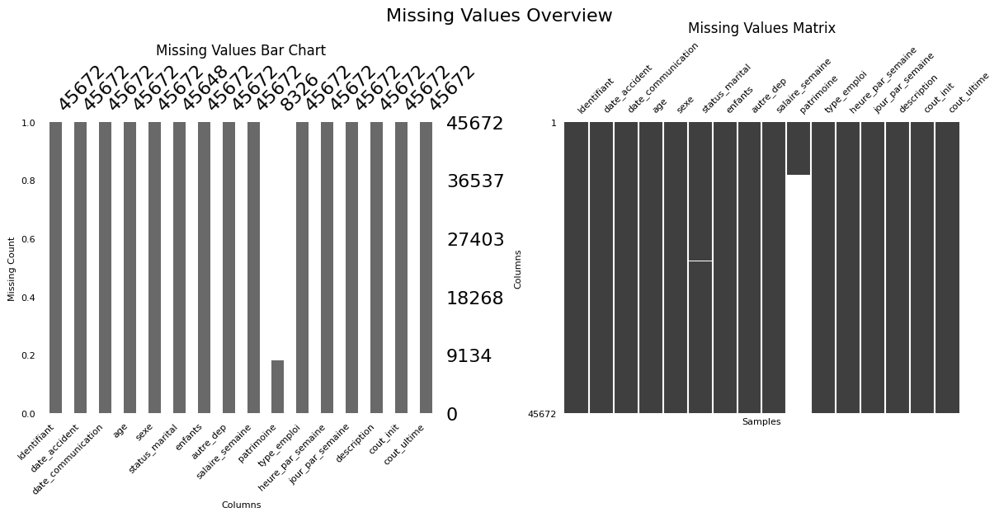

In [ ]:
# Create a 1x2 subplot
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)  # Increase figsize for better spacing

# Bar chart for missing values
msno.bar(df, ax=axes[0])
axes[0].set_title("Missing Values Bar Chart", fontsize=12)
axes[0].set_xlabel("Columns", fontsize=8)
axes[0].set_ylabel("Missing Count", fontsize=8)
axes[0].tick_params(axis='x', rotation=45, labelsize=8)  # Rotate x-axis labels and set font size
axes[0].tick_params(axis='y', labelsize=8)  # Set font size for y-axis labels

# Matrix for missing values
msno.matrix(df, ax=axes[1])
axes[1].set_title("Missing Values Matrix", fontsize=12)
axes[1].set_xlabel("Samples", fontsize=8)
axes[1].set_ylabel("Columns", fontsize=8)
axes[1].tick_params(axis='x', rotation=45, labelsize=8)  # Rotate x-axis labels and set font size
axes[1].tick_params(axis='y', labelsize=8)  # Set font size for y-axis labels

# Add an overall title
plt.suptitle("Missing Values Overview", fontsize=16, y=1.02)
plt.show()


### Attention:
On choisit d'eliminer la variable patrimoine dans un premier essai. On a conduit d'études de l'importance de cette variable pour savoir si des effort pour inferer les valeures manquantes sont necessaires ou pas. Voir l'annexe pour les résultats.

Par rapport a la variable marital_status on remplace par le mode de la variable categorielle.

In [ ]:
# =====================================
# 2.3.  Missing Values: Handling
# =====================================

# MARITAL STATUS: On choisit de remplacer les quelques valeures manquantes par la modalité la plus commune
# Find the most frequent value in 'status_marital'
most_frequent_marital_status = df['status_marital'].mode()[0]

# Replace NaN values with the most frequent value
df['status_marital'] = df['status_marital'].fillna(most_frequent_marital_status)

# PATRIMOINE: Vue que c'est plus de 80% de NA on choisit d'eliminer la variable (dans un premier temps)
df = df.drop(columns=["patrimoine"])

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# =====================================
# 2.4.  Data Types Formatting
# =====================================

df["date_accident"] = pd.to_datetime(df["date_accident"])
df["date_communication"] = pd.to_datetime(df["date_communication"])
df["sexe"] = df["sexe"].astype("category")
df["status_marital"] = df["status_marital"].astype("category")
df["type_emploi"] = df["type_emploi"].astype("category")
df["enfants"] = df["enfants"].astype("category")
df["autre_dep"] = df["autre_dep"].astype("category")
df["jour_par_semaine"] = df["jour_par_semaine"].astype("int")

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45672 entries, 0 to 45671
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   Identifiant         45672 non-null  object             
 1   date_accident       45672 non-null  datetime64[ns, UTC]
 2   date_communication  45672 non-null  datetime64[ns, UTC]
 3   age                 45672 non-null  int64              
 4   sexe                45672 non-null  category           
 5   status_marital      45672 non-null  category           
 6   enfants             45672 non-null  category           
 7   autre_dep           45672 non-null  category           
 8   salaire_semaine     45672 non-null  float64            
 9   type_emploi         45672 non-null  category           
 10  heure_par_semaine   45672 non-null  float64            
 11  jour_par_semaine    45672 non-null  int64              
 12  description         45672 non-nu

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# ==================================================
# 2.5.  Feature 0: Transform to Log Monetary Values
# ==================================================

# Transform all quantitative monetary variables
df['log_salaire'] = np.log(df['salaire_semaine'])
df['log_cout_init'] = np.log(df['cout_init'])
df['log_cout_ultime'] = np.log(df['cout_ultime'])

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# 3. Exploratory Data Analysis and Pre-Processing

This section focuses on understanding the dataset's characteristics, identifying patterns, and preparing the data for modeling. It is divided into the following subsections:

*   Univariate Analysis: Analyze individual variables to understand their distributions, summary statistics, and potential anomalies.
*   Crossed Bivariate Analysis: Explore relationships between pairs of variables to identify potential correlations and interactions.
*   Data as Time Series Analysis: Investigate temporal patterns and trends if the dataset contains time-dependent data.
*   Data Pre-Processing: Prepare the data for modeling by handling missing values, outliers, scaling, encoding categorical variables, and more.
*   Final Data Assessment: Ensure the dataset is clean and ready for modeling by validating the pre-processed data, checking distributions, and confirming that transformations have been applied correctly.



In [ ]:
# =====================================
# 3.1.  Descriptive Statistics, Inconsistencies & Oulier Detection
# =====================================

# Display unique values for each column
print("# Unique Values per Column:")
print(df.nunique())

# Display basic descriptive statistics
print("\n# Descriptive Statistics:")
print(df.describe())

# Count observations where 'heure_par_semaine' is greater than 168 (physically impossible)
count = df[df['heure_par_semaine'] > 168]['heure_par_semaine'].count()
print(f"Number of observations where heure_par_semaine is greater than 168: {count} or {round(count/df.shape[0],4)}%")

# Count observations where 'heure_par_semaine' is greater than 7*12 (physically impossible)
count = df[df['heure_par_semaine'] > 7*12]['heure_par_semaine'].count()
print(f"Number of observations where heure_par_semaine is greater than 7*12: {count} or {round(count/df.shape[0],4)}%")

# Count observations where 'salaire_semaine' is over 2,000 per week
count = df[df['salaire_semaine'] >= 2000]['salaire_semaine'].count()
print(f"Number of observations where salaire_semaine is greater than 2000: {count} or {round(count/df.shape[0],4)}%")

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Unique Values per Column:
Identifiant           45672
date_accident         32754
date_communication     6631
age                      67
sexe                      3
status_marital            3
enfants                   9
autre_dep                 4
salaire_semaine       12056
type_emploi               2
heure_par_semaine       395
jour_par_semaine          7
description           24725
cout_init              1832
cout_ultime           45671
log_salaire           12056
log_cout_init          1832
log_cout_ultime       45671
dtype: int64

# Descriptive Statistics:
                age  salaire_semaine  heure_par_semaine  jour_par_semaine  \
count  45672.000000     45672.000000       45672.000000      45672.000000   
mean      33.859279       416.642684          37.713080          4.901887   
std       12.134652       248.440889          12.676762          0.559353   
min       13.000000         1.000000           0.000000          1.000000   
25%       23.000000       200.000000       

In [ ]:
# Compare the variance of the salaire_semaine variable with and without the observations with values of 5000
var_without_5000 = df[df['salaire_semaine'] < 2000]['salaire_semaine'].var()
var_with_5000 = df['salaire_semaine'].var()
ratio = var_with_5000 / var_without_5000 - 1

print(f"The ratio of with and without outliers is: {round(ratio*100,2)}%")

The ratio of with and without outliers is: 17.91%


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# ================================================================================
# 3.1.  Remove Outlier Related to Possible Measurement error in Heure par Semaine
# ================================================================================

# Remove observations where heure_par_semaine is greater than 7*12
df = df[df['heure_par_semaine'] <= 7*12]

# Remove observations where salaire_par_semaine is greater than 2000
df =  df[df['salaire_semaine'] <= 2000]

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


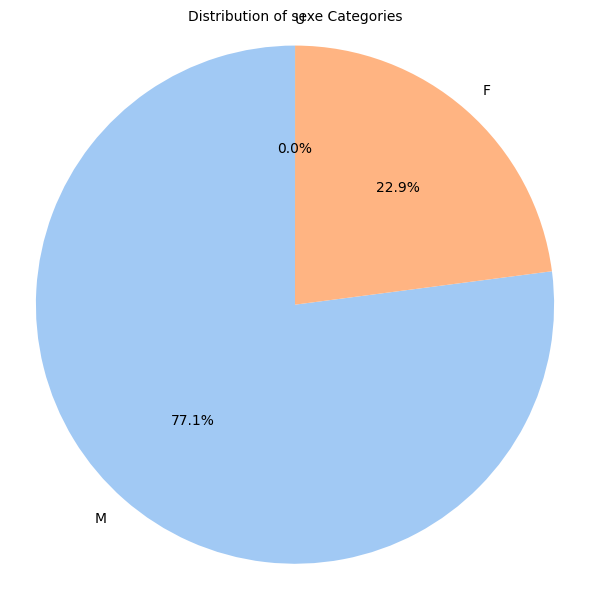

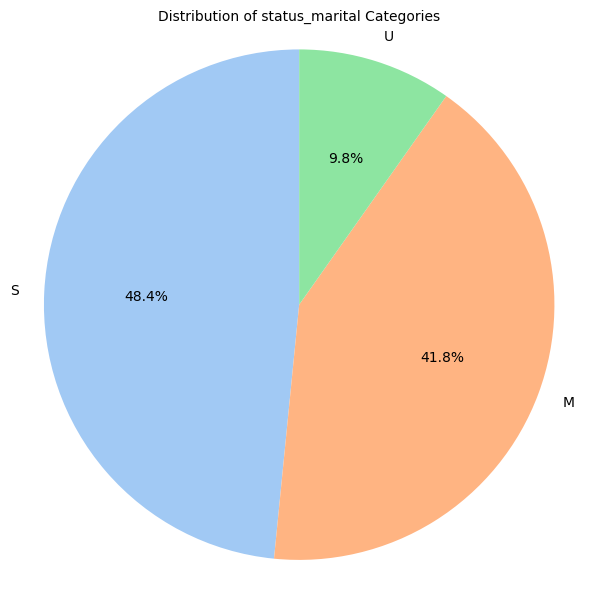

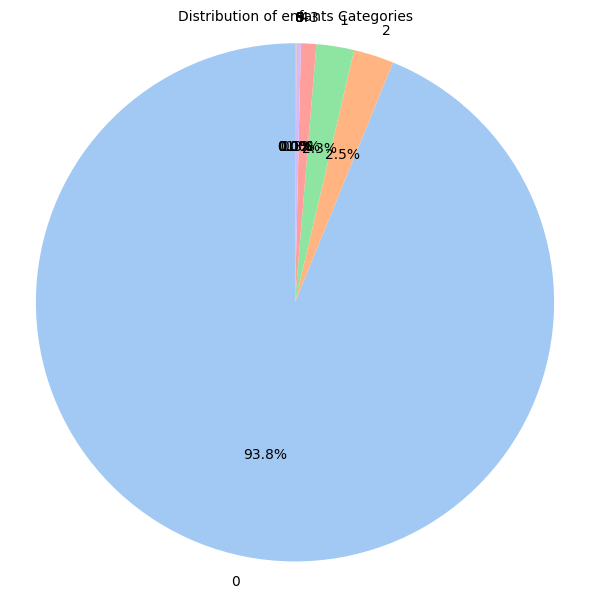

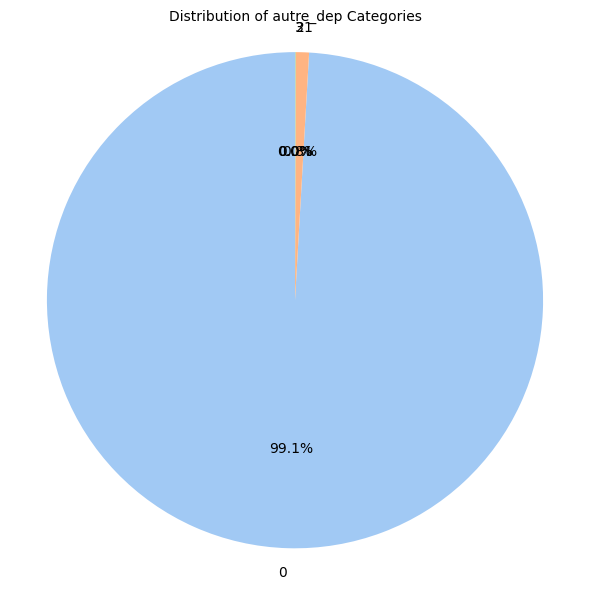

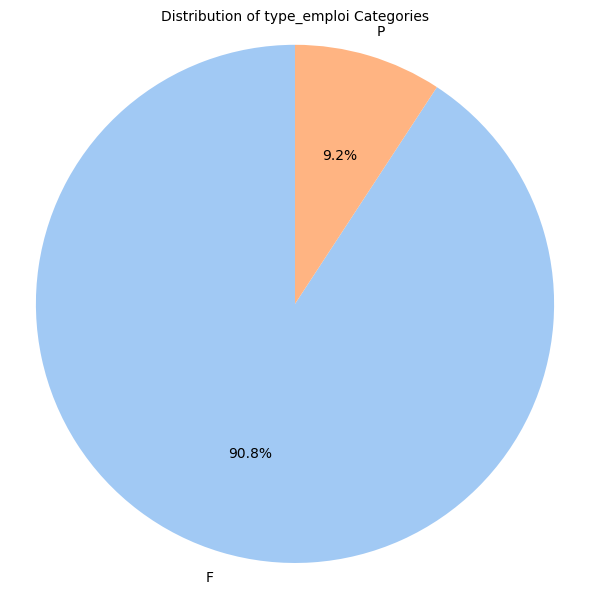

In [ ]:
# =====================================
# 3.2.  Univariate Analysis: Categorical Variables
# =====================================

# List of qualitative Category like variables
qual_var = df.select_dtypes(include=['category']).columns

# Pie charts
for i in qual_var:
  # Count the occurrences of each category
  category_counts = df[i].value_counts()

  # Create a pie chart
  fig, ax = plt.subplots(figsize=(6, 6))
  colors = sns.color_palette('pastel')

  ax.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90, colors=colors)
  ax.set_title(f'Distribution of {i} Categories', fontsize=10)

  # Equal aspect ratio ensures the pie is circular
  ax.axis('equal')

  plt.tight_layout()
  plt.show()

### Observations:

On constate qu'il n'y a pas des grandes distribution estables. Difficile d'en tirer des conclusions.

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


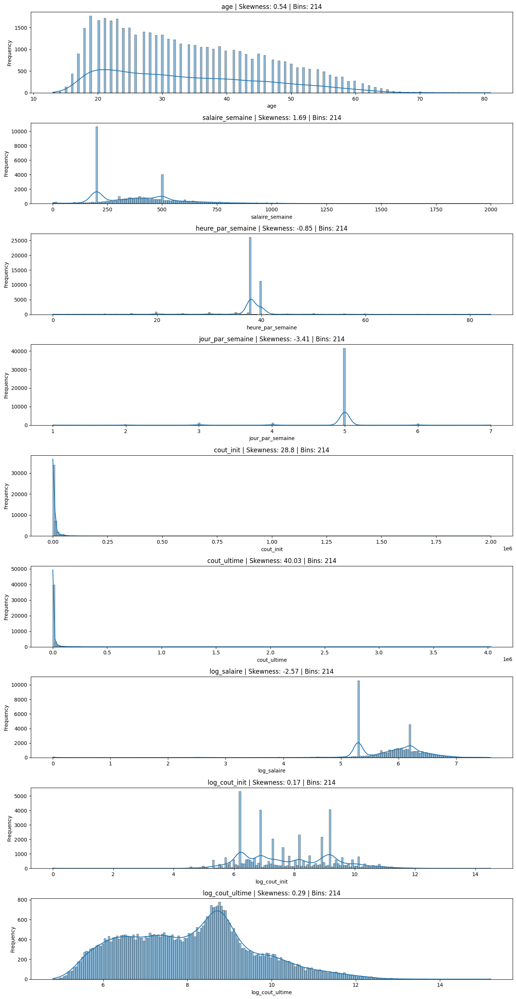

In [ ]:
# =====================================
# 3.2.  Univariate Analysis: Quantitative Variables
# =====================================

# Here the parameters are "contamination" and "random_state"

num_cols = quant_var = df.select_dtypes(include=['int64', 'float64']).columns

# Visualize outliers in a 2D scatter plot (choose two numeric features)
# Calculate the number of subplots needed
n_plots = len(num_cols) * (len(num_cols) - 1) // 2  # Number of unique scatter plots
n_cols = 3  # Number of columns in the subplot grid
n_rows = math.ceil(n_plots / n_cols)  # Number of rows needed

# Plot histograms with optimal bins
plt.figure(figsize=(14, len(num_cols) * 3))
for idx, feature in enumerate(num_cols, 1):
    bins = optimal_bins(df[feature].dropna(), method='sqrt')  # Example method
    plt.subplot(len(num_cols), 1, idx)
    sns.histplot(df[feature], bins=bins, kde=True)
    plt.title(f"{feature} | Skewness: {round(df[feature].skew(), 2)} | Bins: {bins}")
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


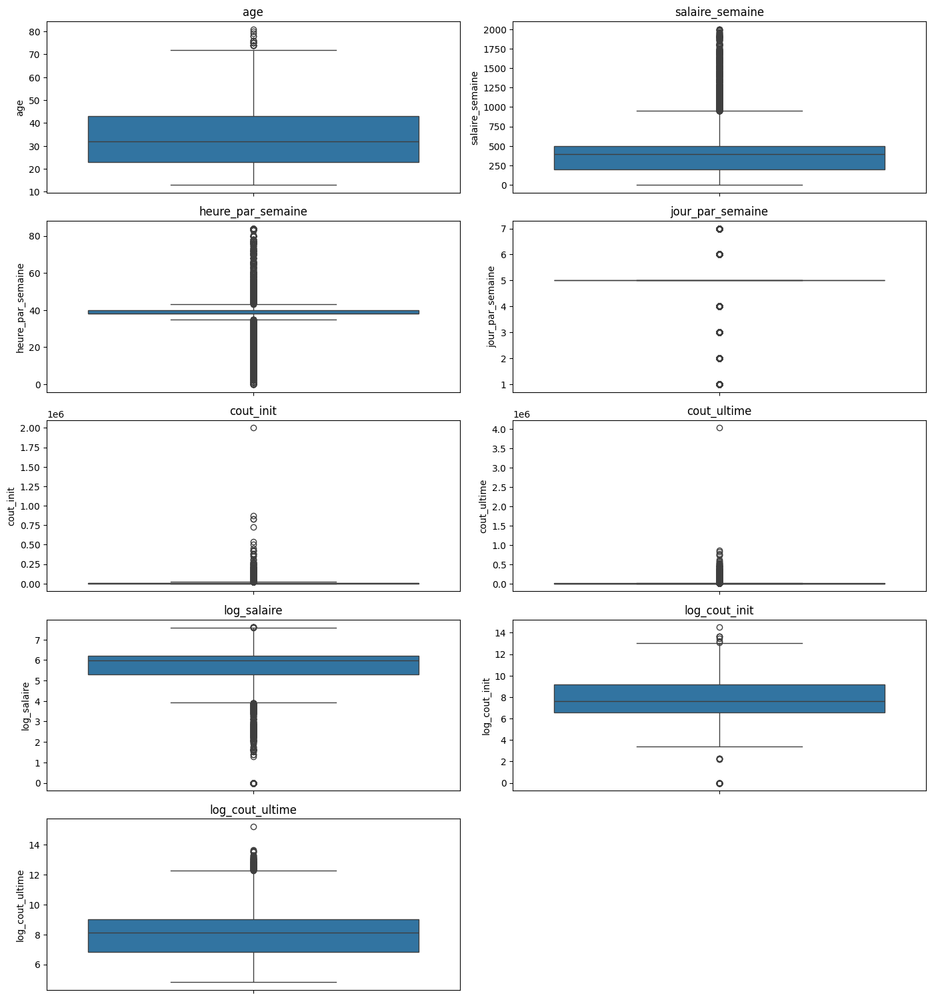

In [ ]:
# Plot boxplot of each numerical feature
plt.figure(figsize=(14, len(num_cols) * 3))
for idx, feature in enumerate(num_cols, 1):
    plt.subplot(len(num_cols), 2, idx)
    sns.boxplot(df[feature])
    plt.title(f"{feature}")

# Adjust layout and show plots
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


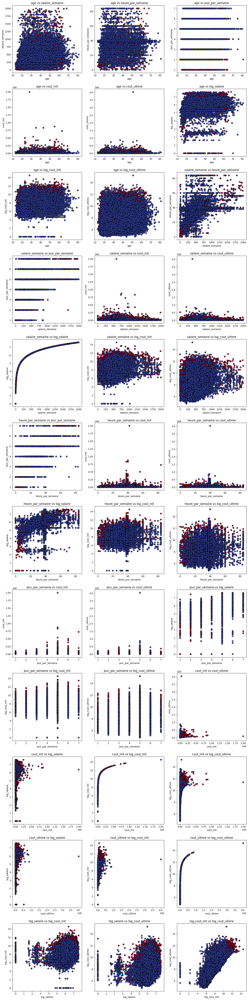

In [ ]:
# =====================================
# 3.3.  Bivariate Analysis: Cross Quantitative Variables
# =====================================
# Here the parameters are "contamination" and "random_state"

num_cols = quant_var = df.select_dtypes(include=['int64', 'float64']).columns
X_numeric = df[num_cols]
clf = IForest(contamination=0.01, random_state=42) # Here the same proportion of outliers is supposed to affect all variables which cannot be true!
clf.fit(X_numeric)
outlier_labels = clf.labels_  # 1 for outliers, 0 for inliers

# Visualize outliers in a 2D scatter plot (choose two numeric features)
# Calculate the number of subplots needed
n_plots = len(num_cols) * (len(num_cols) - 1) // 2  # Number of unique scatter plots
n_cols = 3  # Number of columns in the subplot grid
n_rows = math.ceil(n_plots / n_cols)  # Number of rows needed

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
axes = axes.flatten()  # Flatten to easily index axes

plot_index = 0
for i in range(len(num_cols)):
    for j in range(i + 1, len(num_cols)):  # Avoid duplicate plots and self-comparison
        ax = axes[plot_index]  # Select the correct subplot
        ax.scatter(X_numeric[num_cols[i]], X_numeric[num_cols[j]], c=outlier_labels, cmap='coolwarm', edgecolor='k')
        ax.set_xlabel(num_cols[i])
        ax.set_ylabel(num_cols[j])
        ax.set_title(f"{num_cols[i]} vs {num_cols[j]}")
        plot_index += 1

# Hide any unused subplots
for k in range(plot_index, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.show()

### Observations:
On obsereve un certaine relation de correlation entre le log de cout init et cout ultime!

In [ ]:
# Count outliers
outliers_present = (outlier_labels == 1)
print("\nNumber of Outliers Detected by PYOD IForest:", outliers_present.sum())


Number of Outliers Detected by PYOD IForest: 456


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
num_cols

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['age', 'salaire_semaine', 'heure_par_semaine', 'jour_par_semaine',
       'cout_init', 'cout_ultime', 'log_salaire', 'log_cout_init',
       'log_cout_ultime'],
      dtype='object')

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


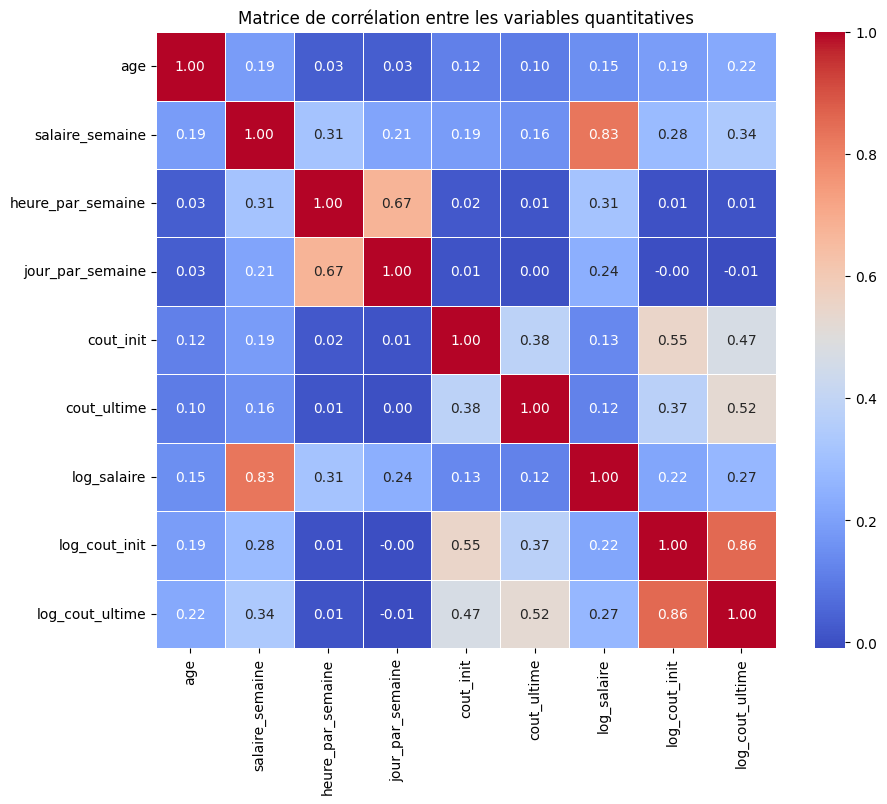

In [ ]:
# Sélection des colonnes quantitatives
quantitative_cols = df.select_dtypes(include=[np.number])

# Calcul de la matrice de corrélation
correlation_matrix = quantitative_cols.corr()

# Affichage de la matrice de corrélation avec Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Matrice de corrélation entre les variables quantitatives")
plt.show()

### Observations:
On constate certaines correlations entre les variables disponibles et le cout ultime ce qui nous indique qu'elles peuvent etre utiles pour la regression et l'estimation de notre variable d'interet.

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Cross variable correlation
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
correlations = pg.pairwise_corr(df[numerical_features], method='pearson')
print(correlations[['X', 'Y', 'r', 'p-unc']]) # Affiche les colonnes pertinentes

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


                    X                  Y         r          p-unc
0                 age    salaire_semaine  0.185912   0.000000e+00
1                 age  heure_par_semaine  0.033119   1.526039e-12
2                 age   jour_par_semaine  0.033599   7.253601e-13
3                 age          cout_init  0.116630  9.317606e-138
4                 age        cout_ultime  0.104690  3.103586e-111
5                 age        log_salaire  0.148669  1.659912e-223
6                 age      log_cout_init  0.189951   0.000000e+00
7                 age    log_cout_ultime  0.223925   0.000000e+00
8     salaire_semaine  heure_par_semaine  0.311879   0.000000e+00
9     salaire_semaine   jour_par_semaine  0.207909   0.000000e+00
10    salaire_semaine          cout_init  0.187486   0.000000e+00
11    salaire_semaine        cout_ultime  0.155899  7.765511e-246
12    salaire_semaine        log_salaire  0.828549   0.000000e+00
13    salaire_semaine      log_cout_init  0.281911   0.000000e+00
14    sala

Analysis: log_cout_init by status_marital
Correlation Ratio (status_marital vs log_cout_init): 0.0160


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


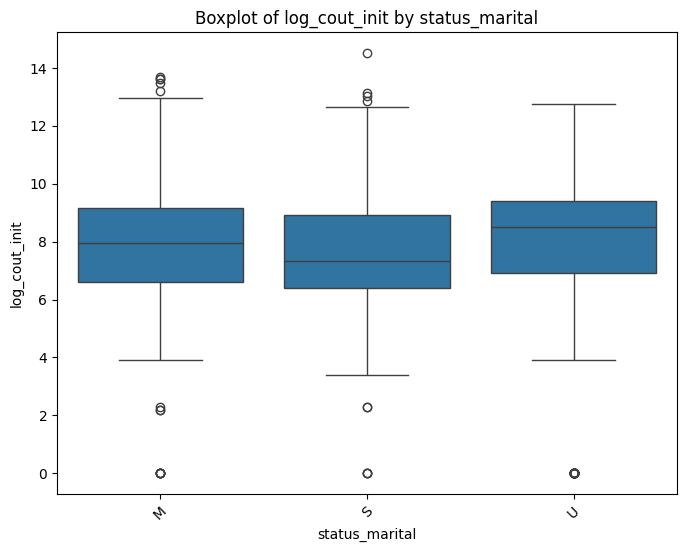

Analysis: log_cout_ultime by status_marital
Correlation Ratio (status_marital vs log_cout_ultime): 0.0265


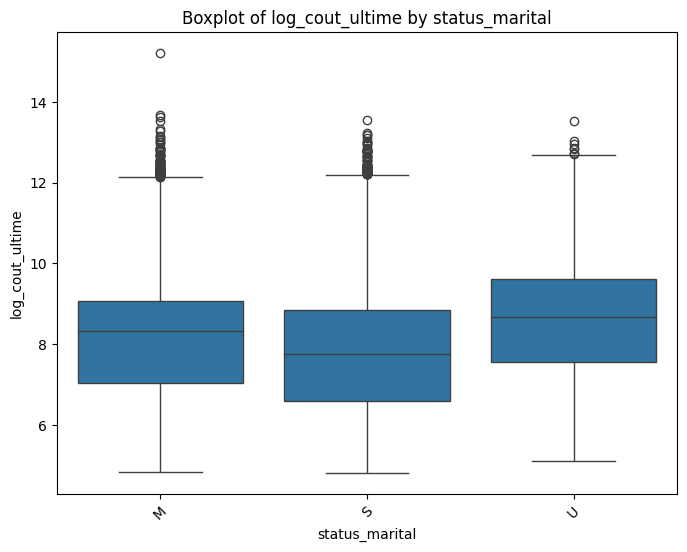

Analysis: log_cout_init by type_emploi
Correlation Ratio (type_emploi vs log_cout_init): 0.0025


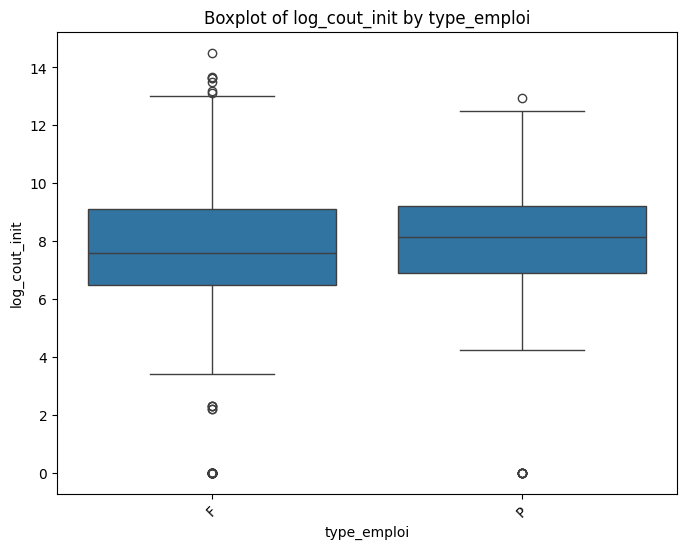

Analysis: log_cout_ultime by type_emploi
Correlation Ratio (type_emploi vs log_cout_ultime): 0.0028


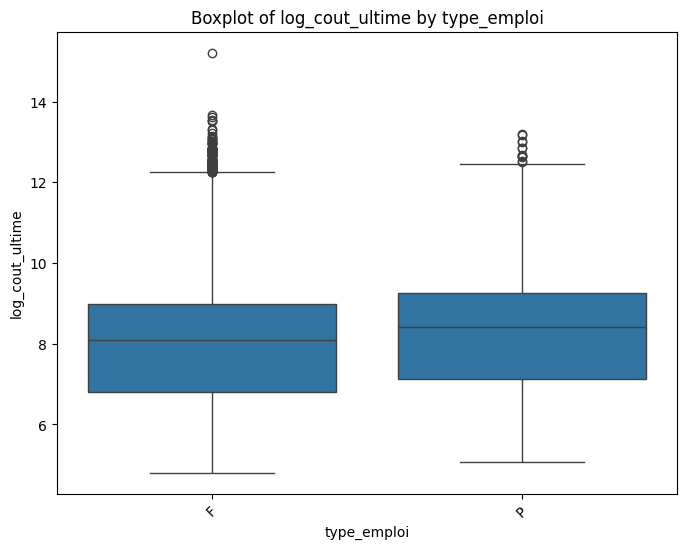

Analysis: log_cout_init by enfants
Correlation Ratio (enfants vs log_cout_init): 0.0019


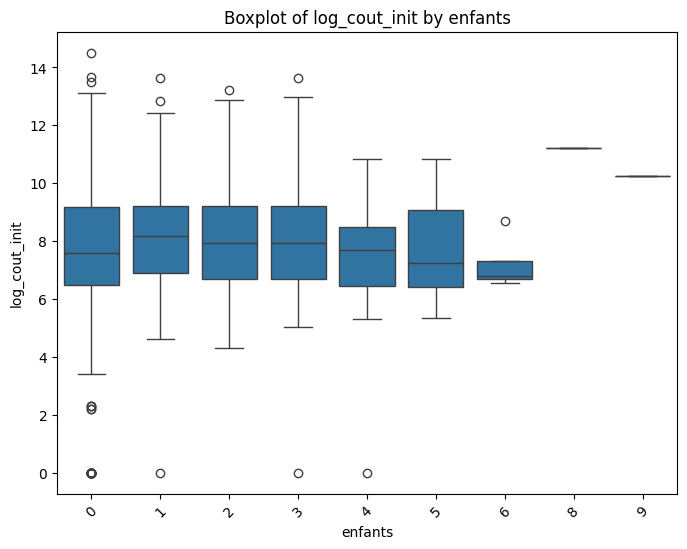

Analysis: log_cout_ultime by enfants
Correlation Ratio (enfants vs log_cout_ultime): 0.0038


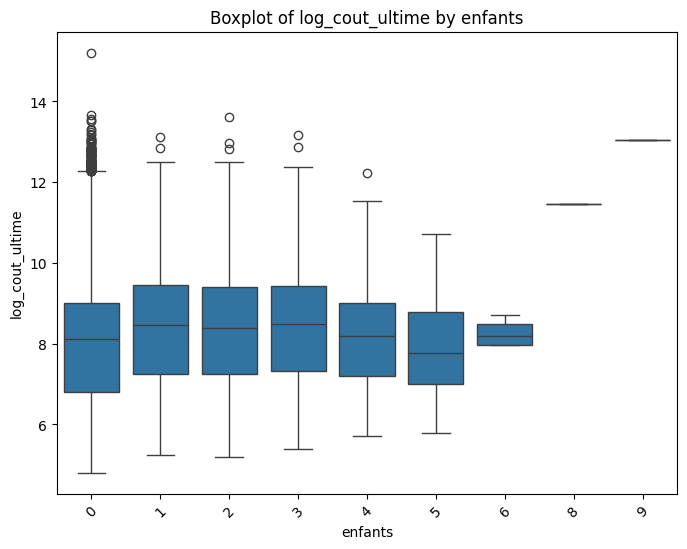

In [ ]:
# =====================================
# 3.4. Bivariate Analysis: Cross Variables Quantitative-Qualitative
# =====================================


quant_cols = df.select_dtypes(include=['int64', 'float64']).columns
qual_cols = df.select_dtypes(include=['object', 'category']).columns

# Define the pairs for analysis
pairs = [
    ('log_cout_init', 'status_marital'),
    ('log_cout_ultime', 'status_marital'),
    ('log_cout_init', 'type_emploi'),
    ('log_cout_ultime', 'type_emploi'),
    ('log_cout_init', 'enfants'),
    ('log_cout_ultime', 'enfants')
]

# Correlation ratio function
def correlation_ratio(categories, values):
    categories = pd.Categorical(categories)
    category_means = values.groupby(categories).mean()
    overall_mean = values.mean()
    numerator = ((category_means - overall_mean) ** 2 * categories.value_counts()).sum()
    denominator = ((values - overall_mean) ** 2).sum()
    return numerator / denominator if denominator > 0 else 0

# Analyze each pair
for quant_var, qual_var in pairs:
    print(f"Analysis: {quant_var} by {qual_var}")

    # Correlation Ratio
    corr_ratio = correlation_ratio(df[qual_var], df[quant_var])
    print(f"Correlation Ratio ({qual_var} vs {quant_var}): {corr_ratio:.4f}")

    # Boxplot
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[qual_var], y=df[quant_var])
    plt.title(f"Boxplot of {quant_var} by {qual_var}")
    plt.xticks(rotation=45)
    plt.show()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Tableau du rapport de corrélation (eta²) entre variables quantitatives et qualitatives:
                log_salaire  log_cout_init  log_cout_ultime
sexe               0.009078       0.005302         0.008130
status_marital     0.003873       0.015979         0.026542
type_emploi        0.034918       0.002545         0.002846


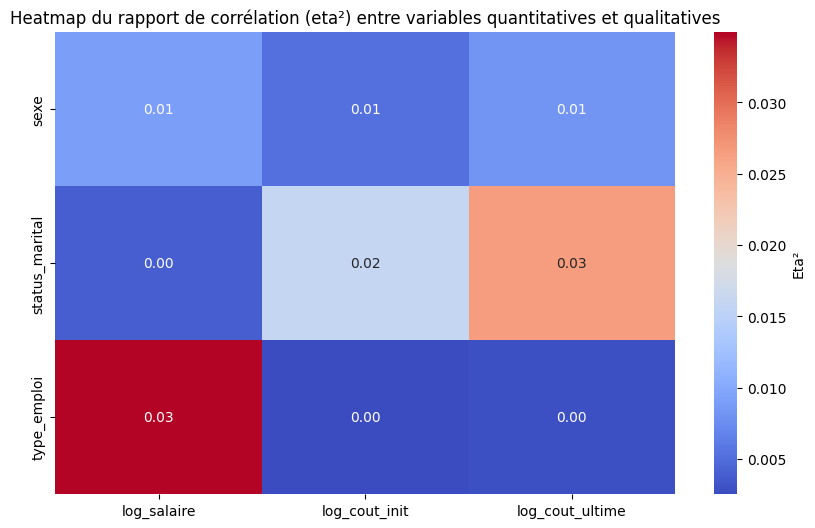

In [ ]:
# Assurez-vous que le DataFrame df1 existe et contient les bonnes colonnes
df2 = df

# Sélection des colonnes quantitatives et qualitatives
quantitative_cols = df2[['log_salaire', 'log_cout_init', 'log_cout_ultime']]
qualitative_cols = df2[['sexe', 'status_marital', 'type_emploi']]

# Initialiser un dictionnaire pour stocker les résultats de eta²
eta2_results = {}

# Calcul de eta² pour chaque paire de variables quantitatives et qualitatives
for quantitative_col in quantitative_cols.columns:
    eta2_results[quantitative_col] = {}
    for qualitative_col in qualitative_cols.columns:
        eta2_results[quantitative_col][qualitative_col] = eta2(df2[quantitative_col], df2[qualitative_col])

# Convertir le dictionnaire en DataFrame pour obtenir un tableau lisible
eta2_df = pd.DataFrame(eta2_results)

# Afficher le tableau des résultats
print("Tableau du rapport de corrélation (eta²) entre variables quantitatives et qualitatives:")
print(eta2_df)

# Générer la heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(eta2_df, annot=True, cmap='coolwarm', cbar_kws={'label': 'Eta²'}, fmt=".2f")
plt.title("Heatmap du rapport de corrélation (eta²) entre variables quantitatives et qualitatives")
plt.show()

# Qualitative-Qualitative Analysis: Chi-Squared Test and Mosaic Plots

Analysis: sexe vs status_marital
Chi-Squared Test: Chi2 = 60.7763, p-value = 0.0000, Degrees of Freedom = 4


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Figure size 1000x800 with 0 Axes>

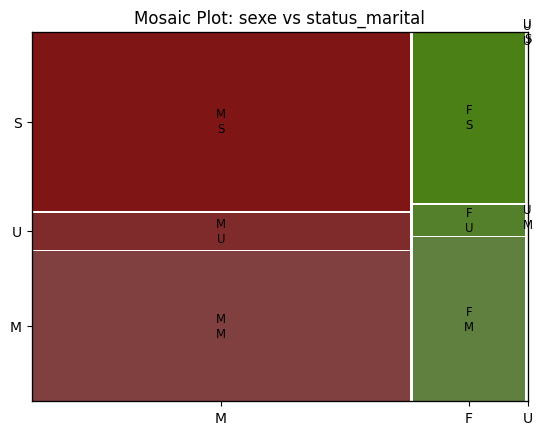


Analysis: sexe vs type_emploi
Chi-Squared Test: Chi2 = 2928.2613, p-value = 0.0000, Degrees of Freedom = 2


<Figure size 1000x800 with 0 Axes>

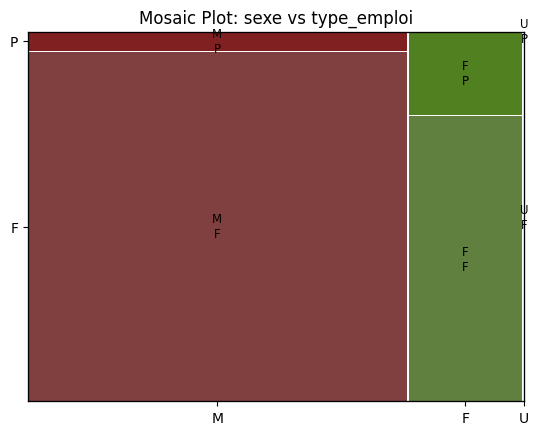


Analysis: status_marital vs enfants
Chi-Squared Test: Chi2 = 2334.5627, p-value = 0.0000, Degrees of Freedom = 16


<Figure size 1000x800 with 0 Axes>

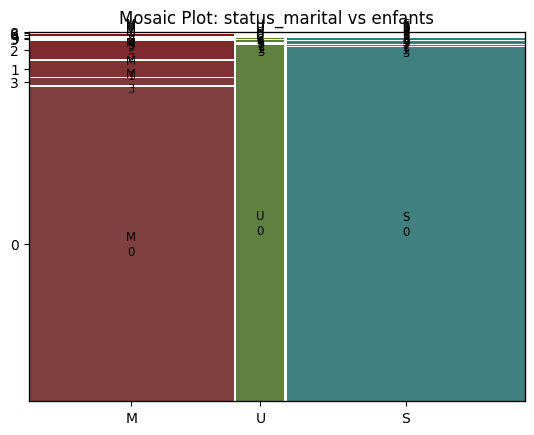


Analysis: type_emploi vs enfants
Chi-Squared Test: Chi2 = 24.0139, p-value = 0.0023, Degrees of Freedom = 8


<Figure size 1000x800 with 0 Axes>

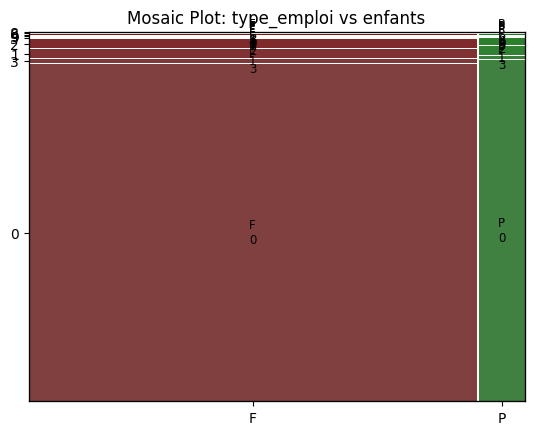

In [ ]:
# =====================================
# 3.5. Qualitative-Qualitative Analysis
# =====================================

# Define the pairs for analysis
qual_pairs = [
    ('sexe', 'status_marital'),
    ('sexe', 'type_emploi'),
    ('status_marital', 'enfants'),
    ('type_emploi', 'enfants')
]

print("# Qualitative-Qualitative Analysis: Chi-Squared Test and Mosaic Plots")

# Analyze each pair
for qual_var1, qual_var2 in qual_pairs:
    print(f"\nAnalysis: {qual_var1} vs {qual_var2}")

    # Chi-Squared Test
    contingency_table = pd.crosstab(df[qual_var1], df[qual_var2])
    chi2, p, dof, _ = chi2_contingency(contingency_table)
    print(f"Chi-Squared Test: Chi2 = {chi2:.4f}, p-value = {p:.4f}, Degrees of Freedom = {dof}")

    # Mosaic Plot
    plt.figure(figsize=(10, 8))
    mosaic(df, [qual_var1, qual_var2])
    plt.title(f"Mosaic Plot: {qual_var1} vs {qual_var2}")
    plt.show()


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


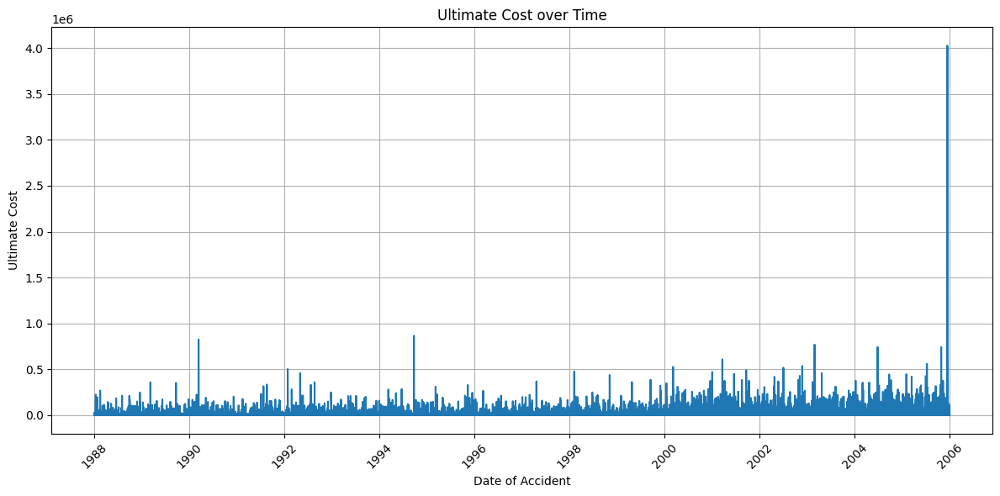

In [ ]:
# =====================================
# 3.5. Time-Series Analysis
# =====================================

# Extract 'cout_ultime' and 'date_accident', sort by date
plot_data = df[['date_accident', 'cout_ultime']].sort_values('date_accident')

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(plot_data['date_accident'], plot_data['cout_ultime'])
plt.xlabel('Date of Accident')
plt.ylabel('Ultimate Cost')
plt.title('Ultimate Cost over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


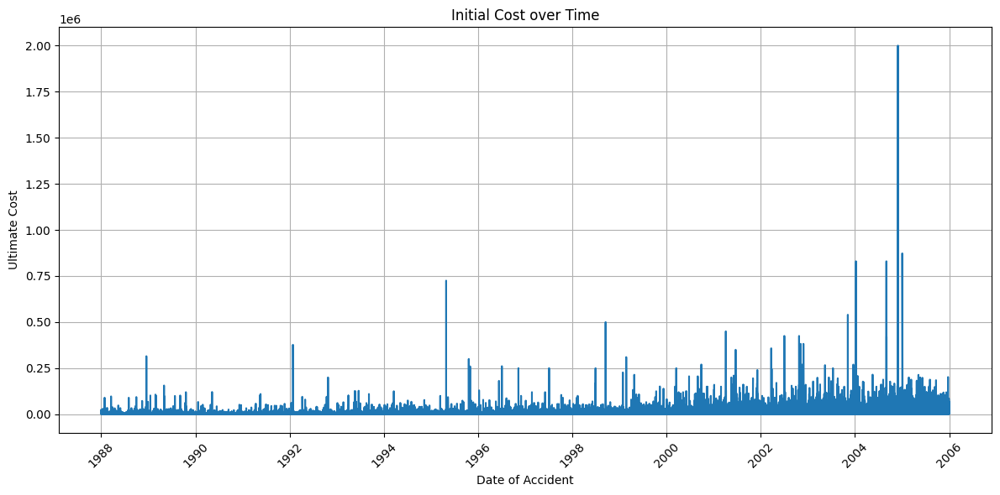

In [ ]:
# Extract 'cout_ultime' and 'date_accident', sort by date
plot_data = df[['date_accident', 'cout_init']].sort_values('date_accident')

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(plot_data['date_accident'], plot_data['cout_init'])
plt.xlabel('Date of Accident')
plt.ylabel('Ultimate Cost')
plt.title('Initial Cost over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


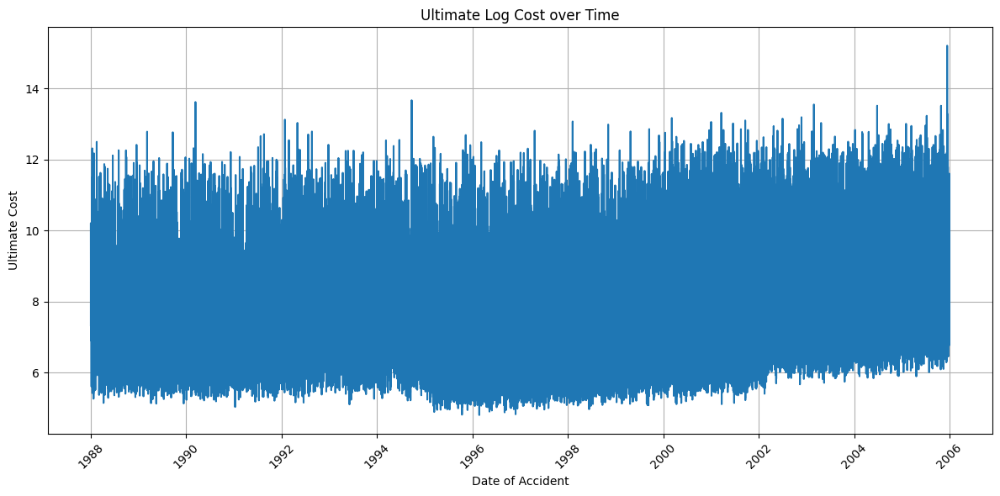

In [ ]:
# Extract 'cout_ultime' and 'date_accident', sort by date
plot_data = df[['date_accident', 'log_cout_ultime']].sort_values('date_accident')

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(plot_data['date_accident'], plot_data['log_cout_ultime'])
plt.xlabel('Date of Accident')
plt.ylabel('Ultimate Cost')
plt.title('Ultimate Log Cost over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


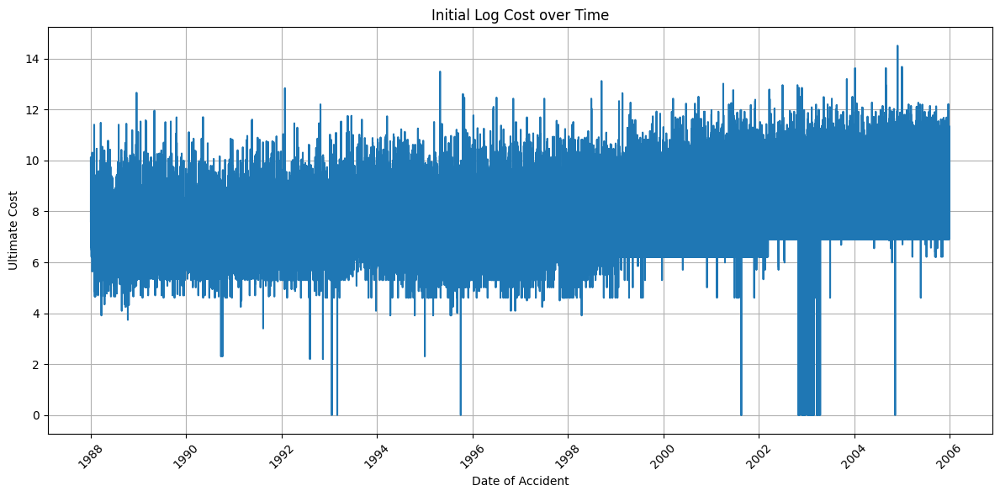

In [ ]:
# Extract 'cout_ultime' and 'date_accident', sort by date
plot_data = df[['date_accident', 'log_cout_init']].sort_values('date_accident')

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(plot_data['date_accident'], plot_data['log_cout_init'])
plt.xlabel('Date of Accident')
plt.ylabel('Ultimate Cost')
plt.title('Initial Log Cost over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
!pip install ruptures

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 14.0 MB/s eta 0:00:00


In [ ]:
df = df.sort_values('date_accident')

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


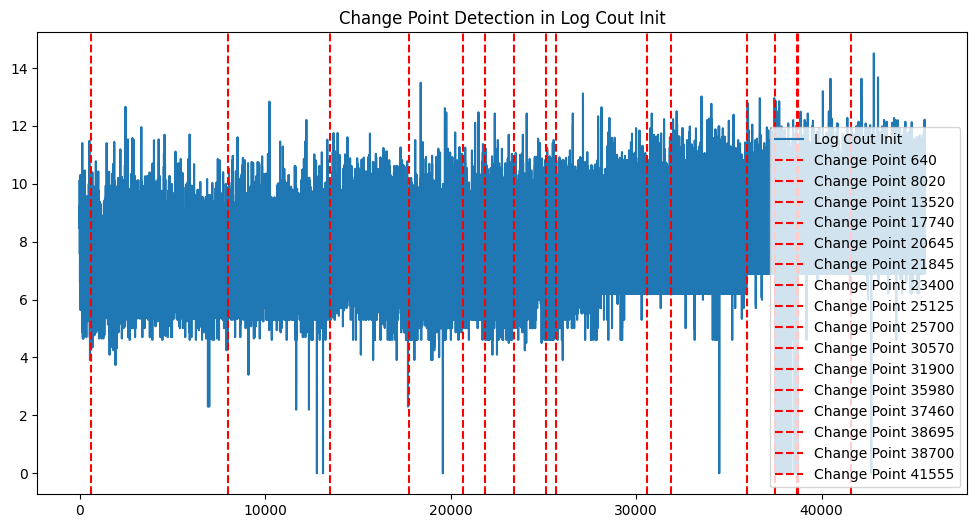

In [ ]:
import ruptures as rpt

# Trier les données par `date_accident` (si ce n'est pas déjà fait)
df['date_accident'] = pd.to_datetime(df['date_accident'])
series = df.sort_values('date_accident')['log_cout_init'].values  # Extraire seulement la colonne numérique

# Appliquer la détection de changements avec l'algorithme PELT
model = "l2"  # Assumes mean-shift changes
algo = rpt.Pelt(model=model).fit(series)
change_points = algo.predict(pen=40)  # Ajustez le paramètre de pénalité selon vos besoins

# Tracer les résultats
plt.figure(figsize=(12, 6))
plt.plot(series, label="Log Cout Init")
for cp in change_points[:-1]:  # Ignorer le dernier point de rupture (fin de la série)
    plt.axvline(x=cp, color="red", linestyle="--", label=f"Change Point {cp}")
plt.title("Change Point Detection in Log Cout Init")
plt.legend()
plt.show()


In [ ]:
change_points

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[640,
 8020,
 13520,
 17740,
 20645,
 21845,
 23400,
 25125,
 25700,
 30570,
 31900,
 35980,
 37460,
 38695,
 38700,
 41555,
 45575]

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


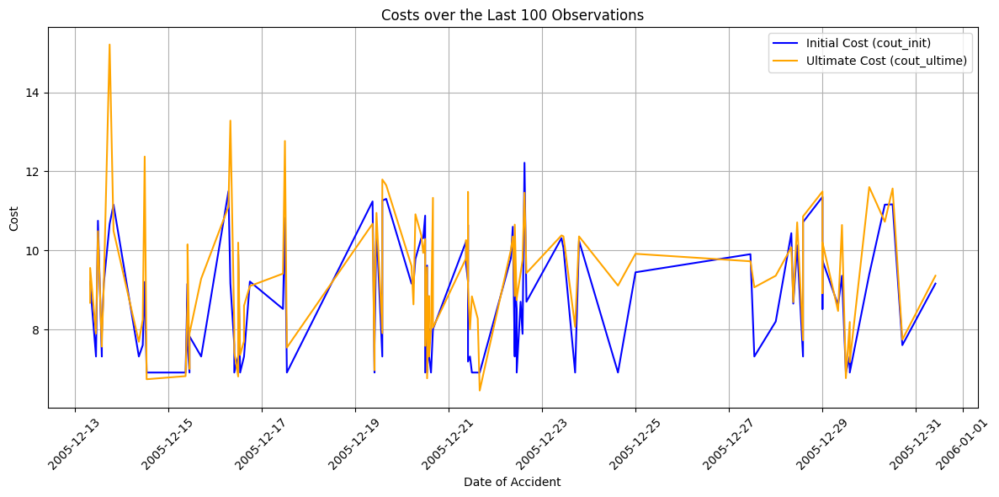

In [ ]:
# Sort the data by 'date_accident' in descending order and take the last N observations
N = 100  # Adjust this number to select the desired number of rows
plot_data = df.sort_values('date_accident').iloc[-N:]

# Extract 'date_accident', 'cout_init', and 'cout_ultime'
plot_data = plot_data[['date_accident', 'log_cout_init', 'log_cout_ultime']]

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(plot_data['date_accident'], plot_data['log_cout_init'], label='Initial Cost (cout_init)', color='blue')
plt.plot(plot_data['date_accident'], plot_data['log_cout_ultime'], label='Ultimate Cost (cout_ultime)', color='orange')
plt.xlabel('Date of Accident')
plt.ylabel('Cost')
plt.title(f'Costs over the Last {N} Observations')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


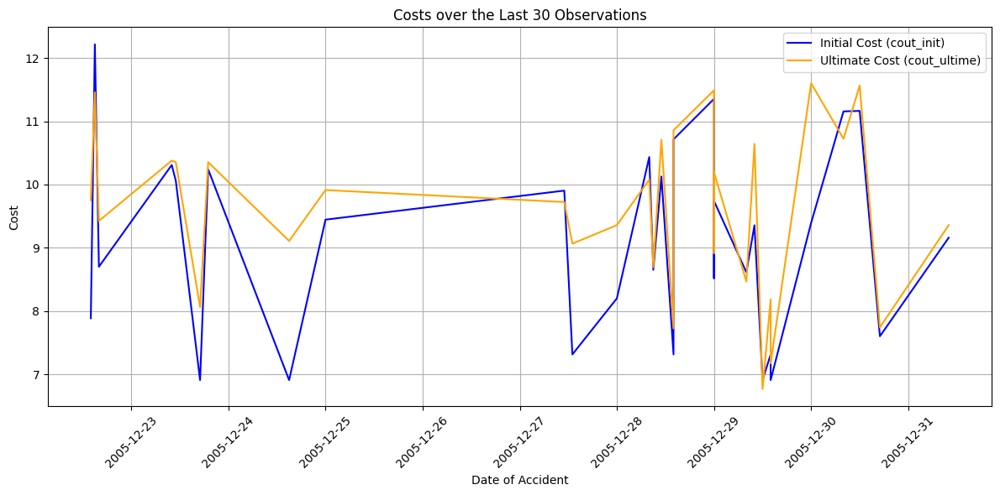

In [ ]:
# Sort the data by 'date_accident' in descending order and take the last N observations
N = 30  # Adjust this number to select the desired number of rows
plot_data = df.sort_values('date_accident').iloc[-N:]

# Extract 'date_accident', 'cout_init', and 'cout_ultime'
plot_data = plot_data[['date_accident', 'log_cout_init', 'log_cout_ultime']]

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(plot_data['date_accident'], plot_data['log_cout_init'], label='Initial Cost (cout_init)', color='blue')
plt.plot(plot_data['date_accident'], plot_data['log_cout_ultime'], label='Ultimate Cost (cout_ultime)', color='orange')
plt.xlabel('Date of Accident')
plt.ylabel('Cost')
plt.title(f'Costs over the Last {N} Observations')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Number of rows after filtering: 12708


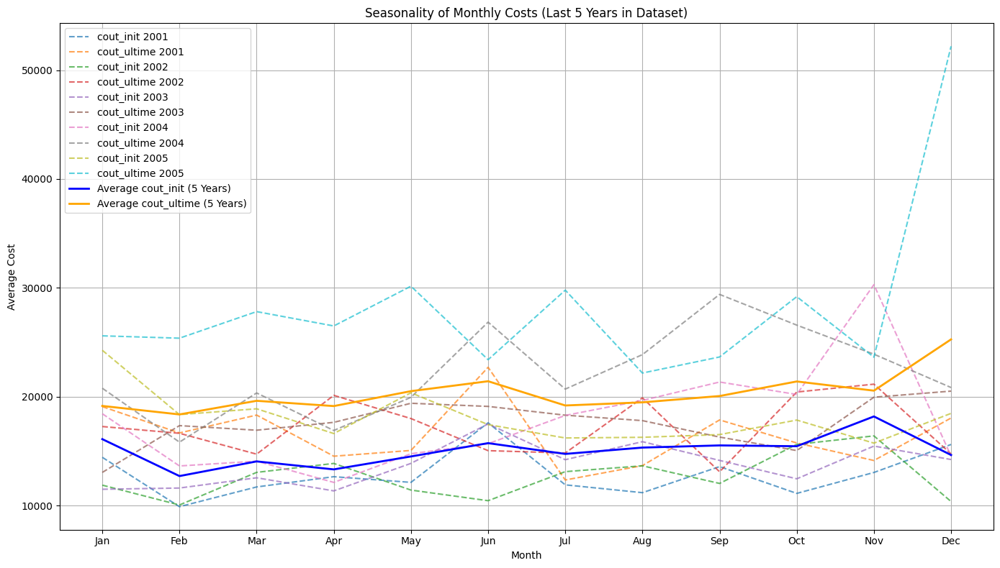

In [ ]:
# Find the latest year in the dataset
latest_year = df['date_accident'].dt.year.max()
five_years_ago = latest_year - 5

# Filter data for the last 5 years of the dataset
df_filtered = df[df['date_accident'].dt.year > five_years_ago]
print("Number of rows after filtering:", len(df_filtered))

if len(df_filtered) == 0:
    print("No data available for the specified time range.")
else:
    # Extract year and month
    df_filtered['year'] = df_filtered['date_accident'].dt.year
    df_filtered['month'] = df_filtered['date_accident'].dt.month

    # Group by year and month, and calculate the monthly averages
    monthly_avg = df_filtered.groupby(['year', 'month'])[['cout_init', 'cout_ultime']].mean().reset_index()

    # Calculate the average of each month across the 5 years
    seasonality_avg = monthly_avg.groupby('month')[['cout_init', 'cout_ultime']].mean()

    # Plotting
    plt.figure(figsize=(14, 8))

    # Plot individual years
    for year in df_filtered['year'].unique():
        yearly_data = monthly_avg[monthly_avg['year'] == year]
        plt.plot(yearly_data['month'], yearly_data['cout_init'], label=f'cout_init {year}', linestyle='--', alpha=0.7)
        plt.plot(yearly_data['month'], yearly_data['cout_ultime'], label=f'cout_ultime {year}', linestyle='--', alpha=0.7)

    # Plot the 5-year average
    plt.plot(seasonality_avg.index, seasonality_avg['cout_init'], label='Average cout_init (5 Years)', color='blue', linewidth=2)
    plt.plot(seasonality_avg.index, seasonality_avg['cout_ultime'], label='Average cout_ultime (5 Years)', color='orange', linewidth=2)

    # Formatting
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.xlabel('Month')
    plt.ylabel('Average Cost')
    plt.title('Seasonality of Monthly Costs (Last 5 Years in Dataset)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Number of rows after filtering: 12708


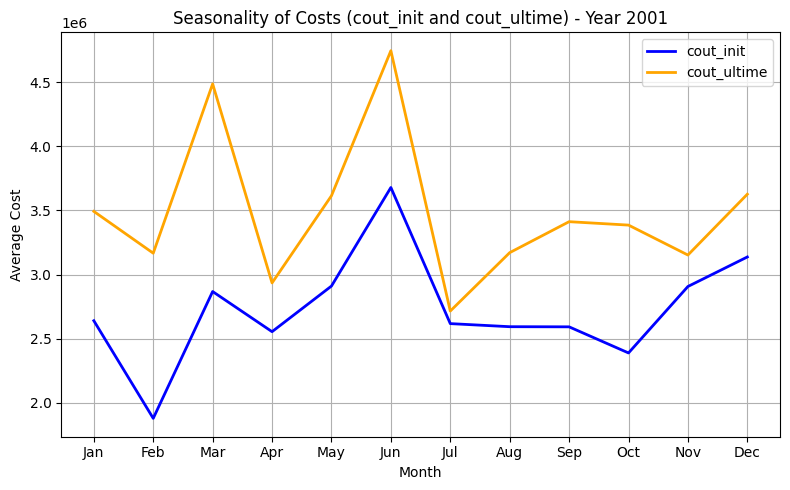

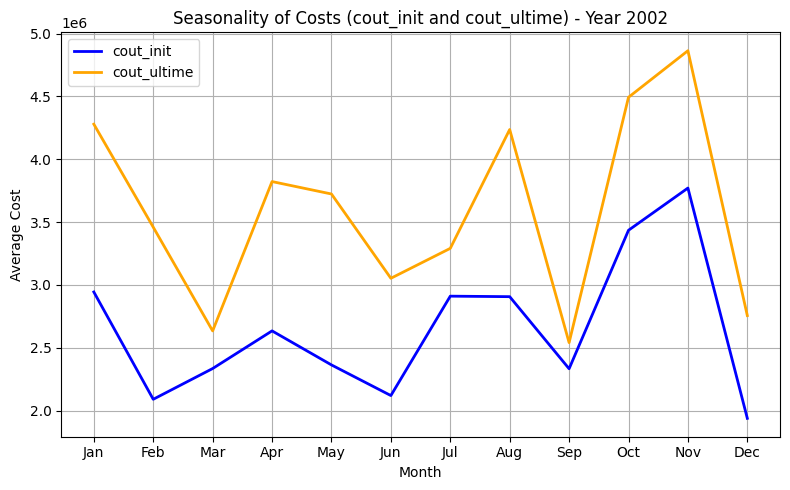

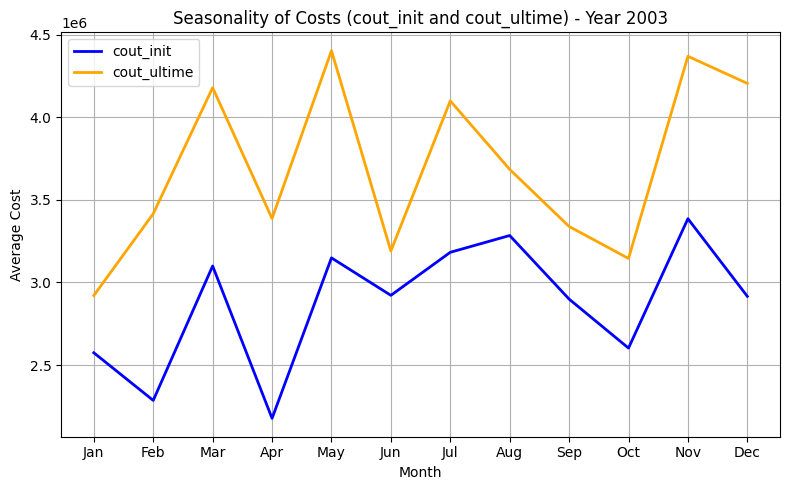

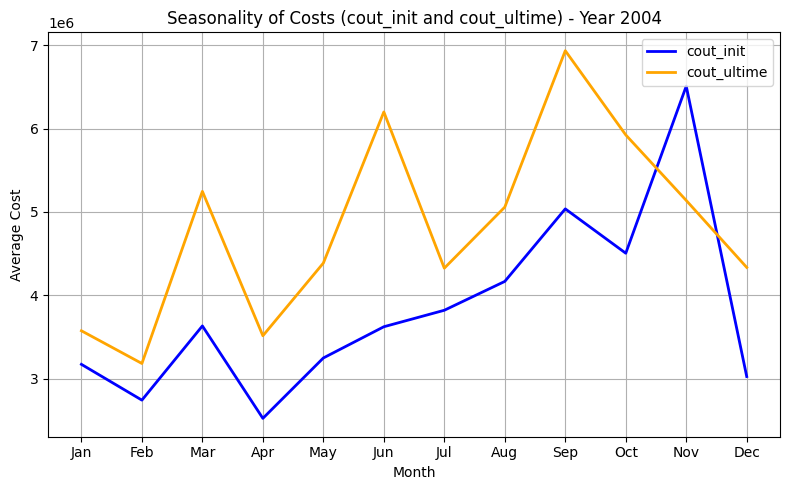

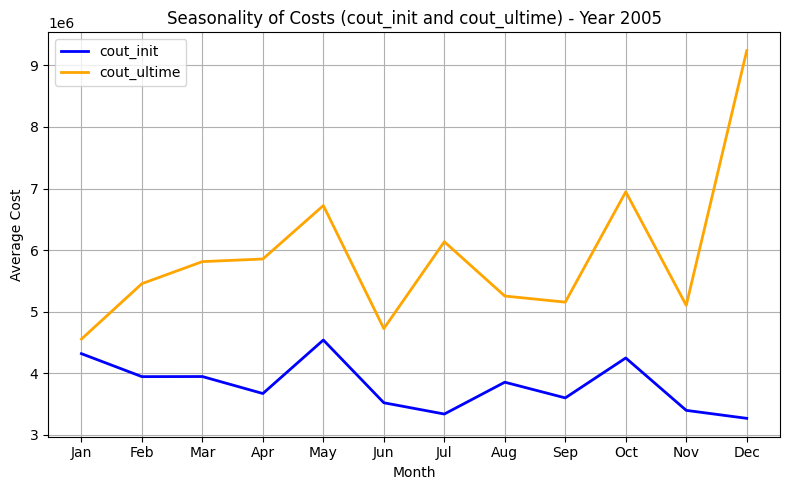

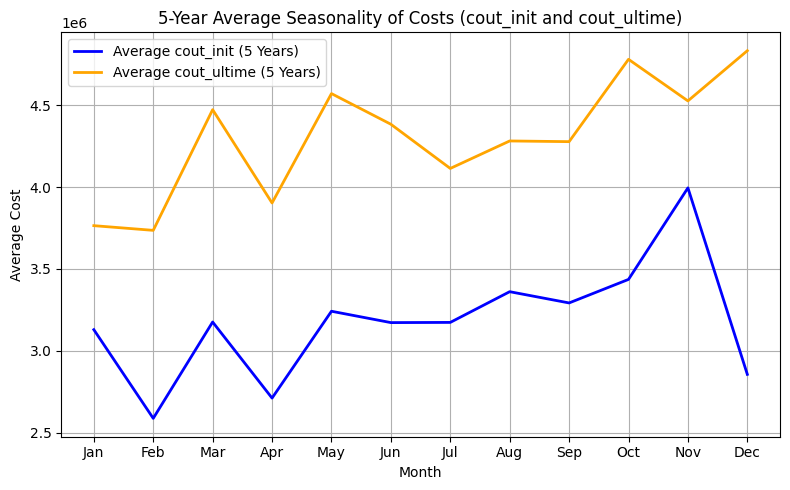

In [ ]:
# Find the latest year in the dataset
latest_year = df['date_accident'].dt.year.max()
five_years_ago = latest_year - 5

# Filter data for the last 5 years of the dataset
df_filtered = df[df['date_accident'].dt.year > five_years_ago]
print("Number of rows after filtering:", len(df_filtered))

if len(df_filtered) == 0:
    print("No data available for the specified time range.")
else:
    # Extract year and month
    df_filtered['year'] = df_filtered['date_accident'].dt.year
    df_filtered['month'] = df_filtered['date_accident'].dt.month

    # Group by year and month, and calculate the monthly averages
    monthly_avg = df_filtered.groupby(['year', 'month'])[['cout_init', 'cout_ultime']].sum().reset_index()

    # Plot cout_init and cout_ultime together for each year
    unique_years = monthly_avg['year'].unique()

    for year in unique_years:
        yearly_data = monthly_avg[monthly_avg['year'] == year]

        plt.figure(figsize=(8, 5))
        plt.plot(yearly_data['month'], yearly_data['cout_init'], label='cout_init', color='blue', linewidth=2)
        plt.plot(yearly_data['month'], yearly_data['cout_ultime'], label='cout_ultime', color='orange', linewidth=2)
        plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        plt.xlabel('Month')
        plt.ylabel('Average Cost')
        plt.title(f'Seasonality of Costs (cout_init and cout_ultime) - Year {year}')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # Calculate the 5-year average for each month
    seasonality_avg = monthly_avg.groupby('month')[['cout_init', 'cout_ultime']].mean()

    # Plot the 5-year average
    plt.figure(figsize=(8, 5))
    plt.plot(seasonality_avg.index, seasonality_avg['cout_init'], label='Average cout_init (5 Years)', color='blue', linewidth=2)
    plt.plot(seasonality_avg.index, seasonality_avg['cout_ultime'], label='Average cout_ultime (5 Years)', color='orange', linewidth=2)
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.xlabel('Month')
    plt.ylabel('Average Cost')
    plt.title('5-Year Average Seasonality of Costs (cout_init and cout_ultime)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Observations:
On voit comme meme que de maniere agregé la variable cout ultime et toujours en dessus de la variable cout initial. Cela peut nous indiquer d'ores et deja que leurs relation peut etre "skewed" dans un sens!

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


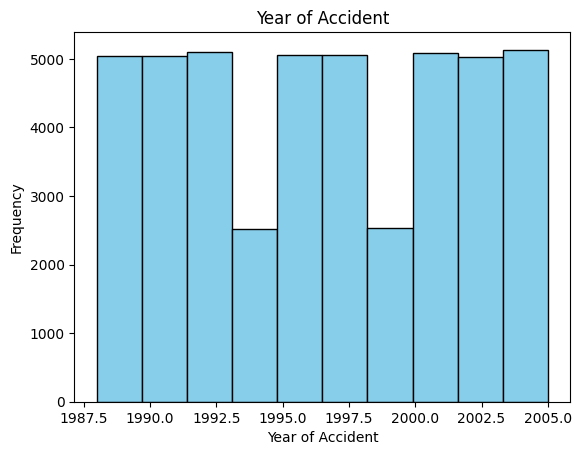

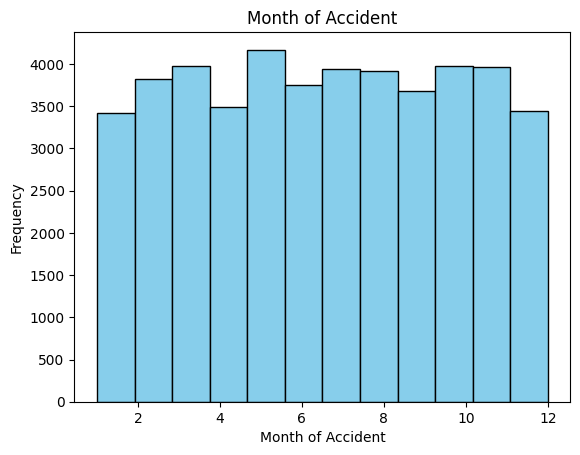

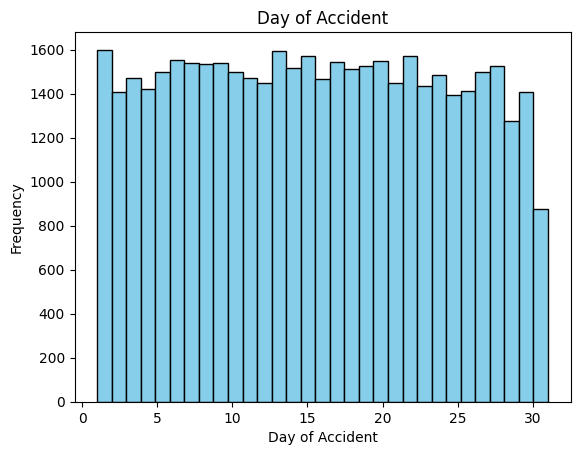

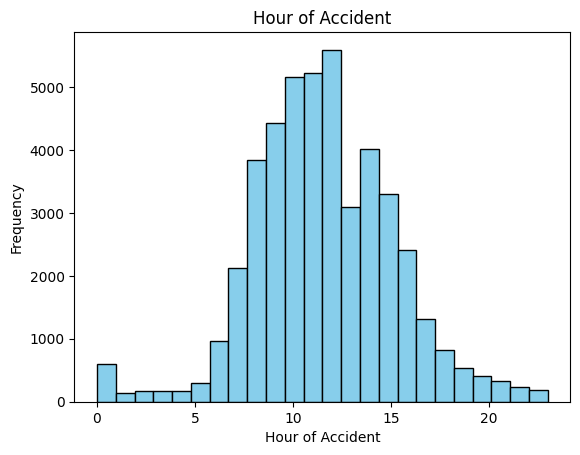

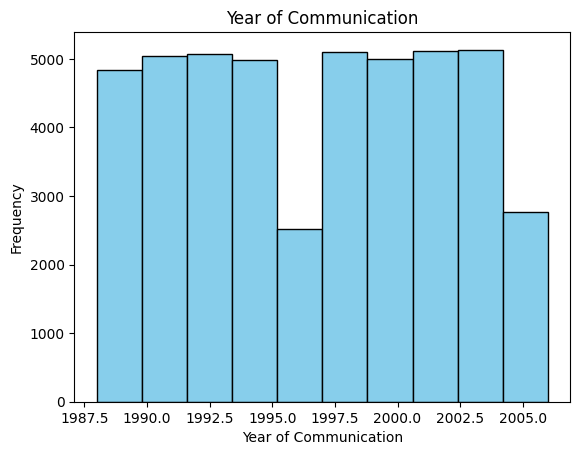

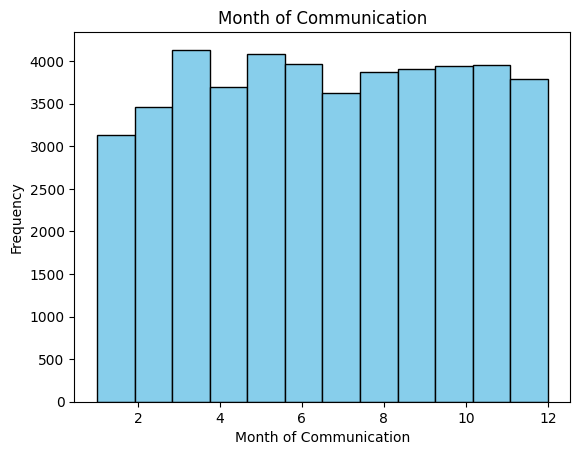

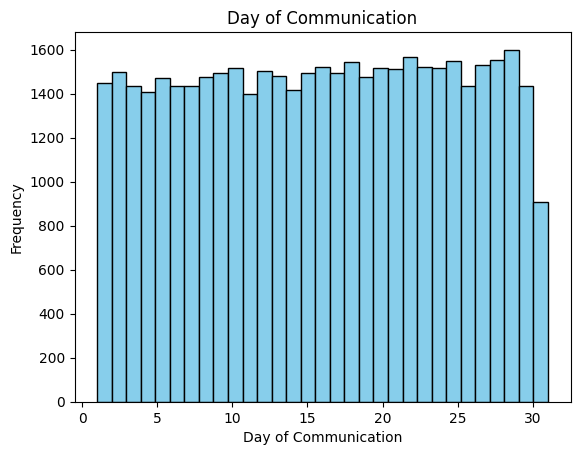

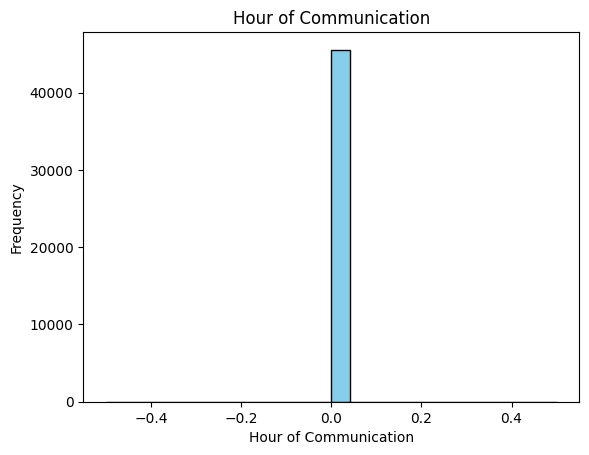

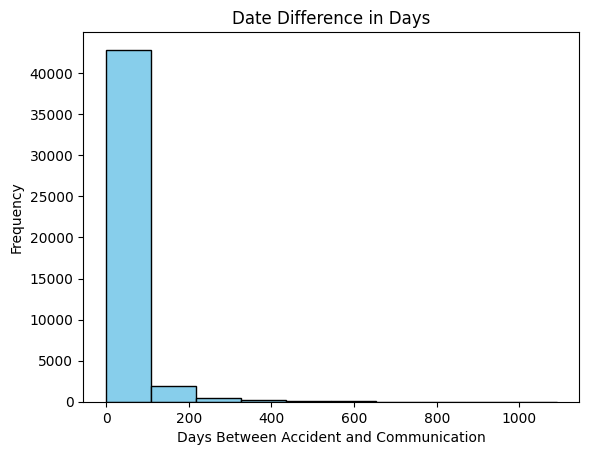

In [ ]:
# df in the correct name for code
data1 = df

# Extract Date Information
# Accident date information
data1['year_accident'] = data1['date_accident'].dt.year
data1['month_accident'] = data1['date_accident'].dt.month
data1['day_accident'] = data1['date_accident'].dt.day
data1['hour_accident'] = data1['date_accident'].dt.hour

# Communication date information
data1['year_communication'] = data1['date_communication'].dt.year
data1['month_communication'] = data1['date_communication'].dt.month
data1['day_communication'] = data1['date_communication'].dt.day
data1['hour_communication'] = data1['date_communication'].dt.hour

# Calculate Date Difference
data1['date_diff'] = data1['date_communication'] - data1['date_accident']
data1['date_diff_days'] = data1['date_diff'].dt.days  # Convert to days

# Define Plotting Function
def plot_histogram(data, column, bins, xlabel, ylabel, title):
    plt.hist(data[column], bins=bins, color='skyblue', edgecolor='black')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.show()

# Plot Histograms
# Accident-related histograms
plot_histogram(data1, 'year_accident', bins=10, xlabel='Year of Accident', ylabel='Frequency', title='Year of Accident')
plot_histogram(data1, 'month_accident', bins=12, xlabel='Month of Accident', ylabel='Frequency', title='Month of Accident')
plot_histogram(data1, 'day_accident', bins=31, xlabel='Day of Accident', ylabel='Frequency', title='Day of Accident')
plot_histogram(data1, 'hour_accident', bins=24, xlabel='Hour of Accident', ylabel='Frequency', title='Hour of Accident')

# Communication-related histograms
plot_histogram(data1, 'year_communication', bins=10, xlabel='Year of Communication', ylabel='Frequency', title='Year of Communication')
plot_histogram(data1, 'month_communication', bins=12, xlabel='Month of Communication', ylabel='Frequency', title='Month of Communication')
plot_histogram(data1, 'day_communication', bins=31, xlabel='Day of Communication', ylabel='Frequency', title='Day of Communication')
plot_histogram(data1, 'hour_communication', bins=24, xlabel='Hour of Communication', ylabel='Frequency', title='Hour of Communication')

# Date difference histogram
plot_histogram(data1, 'date_diff_days', bins=10, xlabel='Days Between Accident and Communication', ylabel='Frequency', title='Date Difference in Days')


In [ ]:
df

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Identifiant,date_accident,date_communication,age,sexe,status_marital,enfants,autre_dep,salaire_semaine,type_emploi,...,year_accident,month_accident,day_accident,hour_accident,year_communication,month_communication,day_communication,hour_communication,date_diff,date_diff_days
2207,W0002208,1988-01-01 09:00:00+00:00,1988-03-07 00:00:00+00:00,59,F,M,0,0,334.90,F,...,1988,1,1,9,1988,3,7,0,65 days 15:00:00,65
22452,W0022453,1988-01-01 13:00:00+00:00,1988-02-15 00:00:00+00:00,50,F,M,0,0,300.00,F,...,1988,1,1,13,1988,2,15,0,44 days 11:00:00,44
40629,W0040630,1988-01-02 01:00:00+00:00,1988-03-11 00:00:00+00:00,65,M,S,0,0,413.06,F,...,1988,1,2,1,1988,3,11,0,68 days 23:00:00,68
25265,W0025266,1988-01-02 08:00:00+00:00,1988-01-20 00:00:00+00:00,19,M,S,0,0,126.45,F,...,1988,1,2,8,1988,1,20,0,17 days 16:00:00,17
40263,W0040264,1988-01-02 11:00:00+00:00,1988-01-27 00:00:00+00:00,22,M,M,2,1,372.80,F,...,1988,1,2,11,1988,1,27,0,24 days 13:00:00,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34256,W0034257,2005-12-30 00:00:00+00:00,2006-02-09 00:00:00+00:00,52,M,S,0,0,848.00,F,...,2005,12,30,0,2006,2,9,0,41 days 00:00:00,41
34488,W0034489,2005-12-30 08:00:00+00:00,2006-01-16 00:00:00+00:00,26,F,S,0,0,200.00,F,...,2005,12,30,8,2006,1,16,0,16 days 16:00:00,16
30643,W0030644,2005-12-30 12:00:00+00:00,2006-01-04 00:00:00+00:00,34,M,U,0,0,581.40,F,...,2005,12,30,12,2006,1,4,0,4 days 12:00:00,4
2831,W0002832,2005-12-30 17:00:00+00:00,2006-01-09 00:00:00+00:00,37,M,S,0,0,500.00,F,...,2005,12,30,17,2006,1,9,0,9 days 07:00:00,9


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


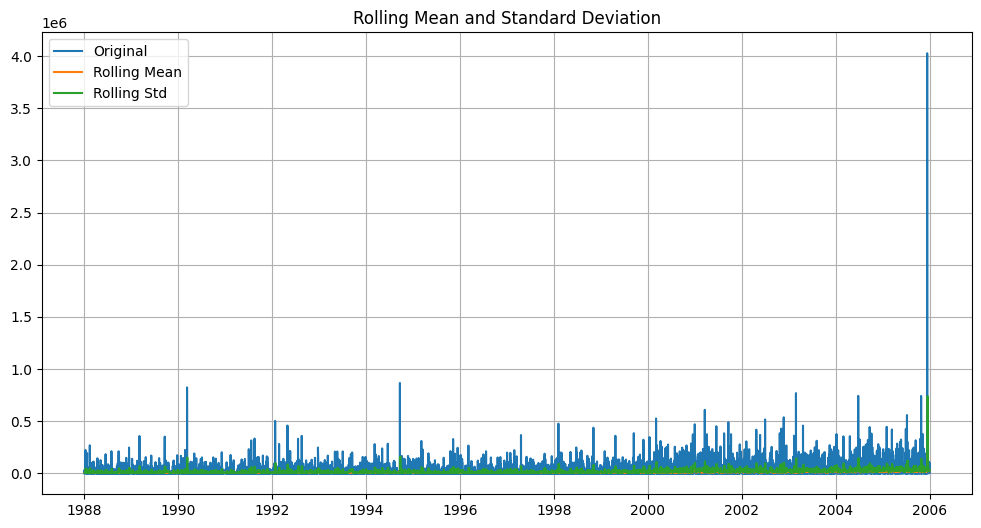

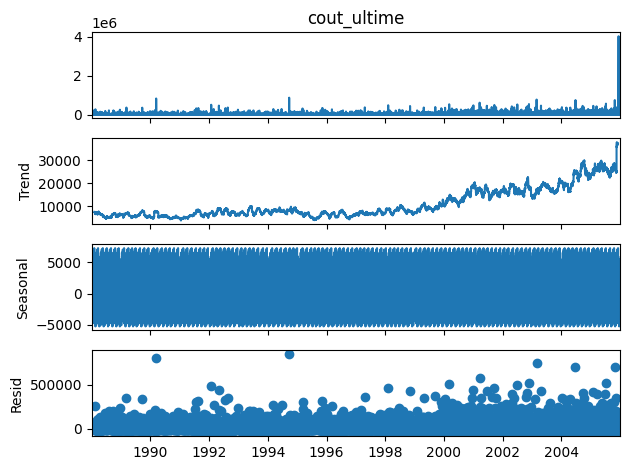

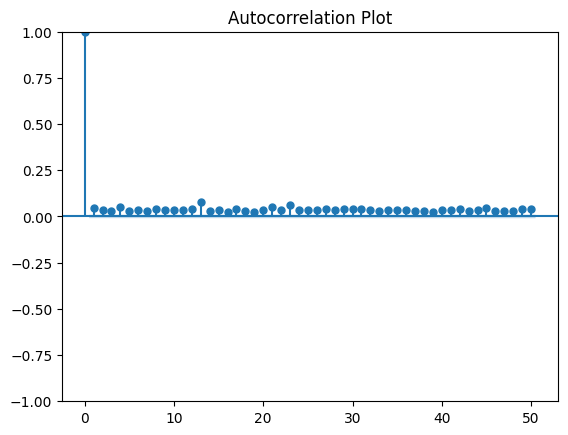

ADF Statistic: -16.900549
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [ ]:
# 3. Trend and Seasonality Analysis

df4 = df[['date_accident', 'cout_ultime']]  # Select relevant columns
df4['date_accident'] = pd.to_datetime(df4['date_accident'])  # Convert to datetime
df4.set_index('date_accident', inplace=True)  # Set date as index
df4.sort_index(inplace=True)


# Rolling Statistics
rolling_mean = df4['cout_ultime'].rolling(window=30).mean()  # Adjust window as needed
rolling_std = df4['cout_ultime'].rolling(window=30).std()

plt.figure(figsize=(12, 6))
plt.plot(df4['cout_ultime'], label='Original')
plt.plot(rolling_mean, label='Rolling Mean')
plt.plot(rolling_std, label='Rolling Std')
plt.title('Rolling Mean and Standard Deviation')
plt.legend(loc='best')
plt.grid(True)
plt.show()

# Decomposition (if you suspect seasonality)
decomposition = seasonal_decompose(df4['cout_ultime'], model='additive', period=365) # Adjust period if needed
decomposition.plot()
plt.show()

# Autocorrelation Plot
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(df4['cout_ultime'], lags=50)  # Adjust lags as needed
plt.title('Autocorrelation Plot')
plt.show()

# 4. Stationarity Checks
# Augmented Dickey-Fuller Test
result = adfuller(df4['cout_ultime'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

### Observations:
On constate et on confirme que la distribution de la variable dependante et d'interet presente une tendance dans le temps, ce qui nous indique qu'il faut faire attention aux hypotheses de independance et distribution identique. Cela nous a indiqué le besoin de rajouter des variables pour representer le temps dans la regression.

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text(0, 0.5, 'Frequency')

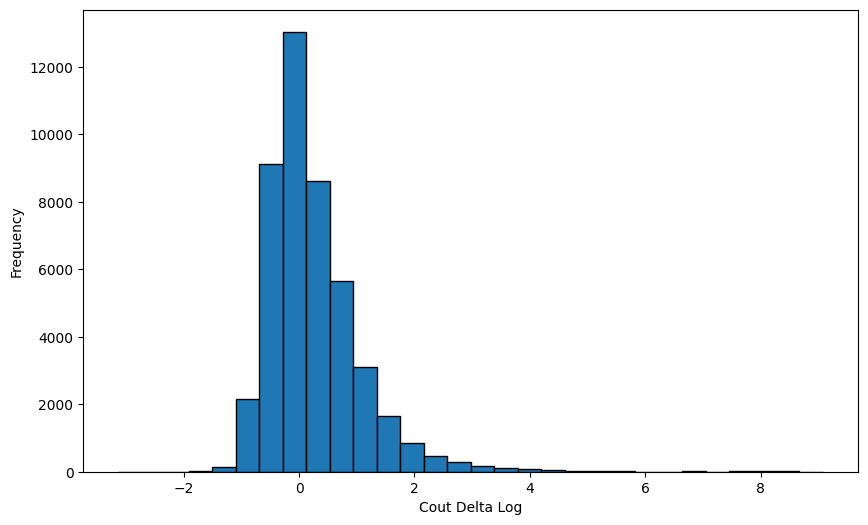

In [ ]:
# ==========================================================================
# 3.6. Exploring Cout Delta: Difference between Cout Initial and Cout Ultime
# ==========================================================================

# Create variable to compute difference between cout_init and cout_ultime
df['cout_delta'] = np.log(df['cout_ultime']/df['cout_init'])

# Histogram of cout_delta
plt.figure(figsize=(10, 6))
plt.hist (df['cout_delta'], bins=30, edgecolor='k')
plt.xlabel('Cout Delta Log')
plt.ylabel('Frequency')

### Observations:
On constate une distribution plus reguliere dans la variable cout delta (difference log. de cout init et cout ultime). C'est une des distributions les plus reguliere qu'on a trouvé dans l'analyse. On l'utilisera par la suite pour evaluer le modele.

In [ ]:
# ==========================================================================
# 3.6. Optional: Cleaning Outliers With the IForest Algo at 0.01 contamination
# ==========================================================================

df = df[~outliers_present]

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Identifiant,date_accident,date_communication,age,sexe,status_marital,enfants,autre_dep,salaire_semaine,type_emploi,...,month_accident,day_accident,hour_accident,year_communication,month_communication,day_communication,hour_communication,date_diff,date_diff_days,cout_delta
2207,W0002208,1988-01-01 09:00:00+00:00,1988-03-07 00:00:00+00:00,59,F,M,0,0,334.90,F,...,1,1,9,1988,3,7,0,65 days 15:00:00,65,-0.269302
22452,W0022453,1988-01-01 13:00:00+00:00,1988-02-15 00:00:00+00:00,50,F,M,0,0,300.00,F,...,1,1,13,1988,2,15,0,44 days 11:00:00,44,0.083186
40629,W0040630,1988-01-02 01:00:00+00:00,1988-03-11 00:00:00+00:00,65,M,S,0,0,413.06,F,...,1,2,1,1988,3,11,0,68 days 23:00:00,68,-0.297745
25265,W0025266,1988-01-02 08:00:00+00:00,1988-01-20 00:00:00+00:00,19,M,S,0,0,126.45,F,...,1,2,8,1988,1,20,0,17 days 16:00:00,17,-0.627907
40263,W0040264,1988-01-02 11:00:00+00:00,1988-01-27 00:00:00+00:00,22,M,M,2,1,372.80,F,...,1,2,11,1988,1,27,0,24 days 13:00:00,24,-0.349067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34256,W0034257,2005-12-30 00:00:00+00:00,2006-02-09 00:00:00+00:00,52,M,S,0,0,848.00,F,...,12,30,0,2006,2,9,0,41 days 00:00:00,41,2.208887
34488,W0034489,2005-12-30 08:00:00+00:00,2006-01-16 00:00:00+00:00,26,F,S,0,0,200.00,F,...,12,30,8,2006,1,16,0,16 days 16:00:00,16,-0.432713
30643,W0030644,2005-12-30 12:00:00+00:00,2006-01-04 00:00:00+00:00,34,M,U,0,0,581.40,F,...,12,30,12,2006,1,4,0,4 days 12:00:00,4,0.400915
2831,W0002832,2005-12-30 17:00:00+00:00,2006-01-09 00:00:00+00:00,37,M,S,0,0,500.00,F,...,12,30,17,2006,1,9,0,9 days 07:00:00,9,0.140105


# 4. Feature Engineering

This section focuses on selecting, manipulating and transforming raw data into features that can be used in our machine learning model. It consists of five processes:

* Feature creation
* Transformations
* Feature extraction
* Exploratory data analysis
* Benchmarking.



/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text(0, 0.5, 'Log Cout Delta')

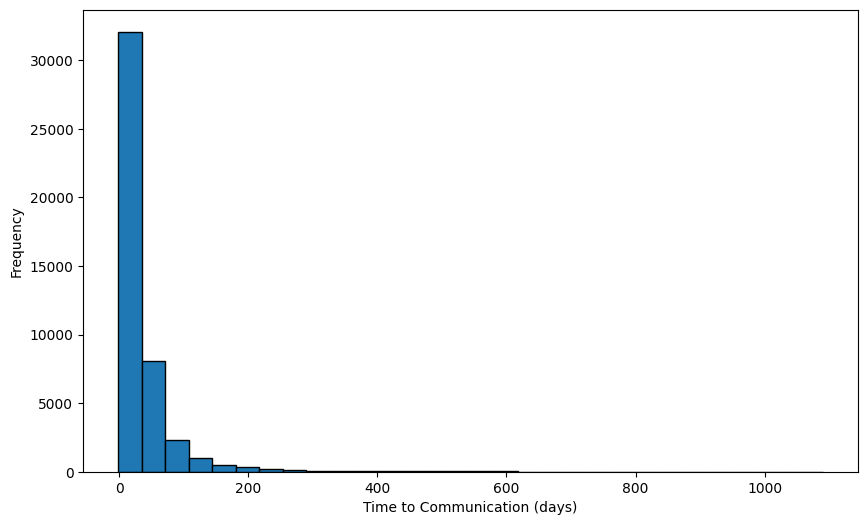

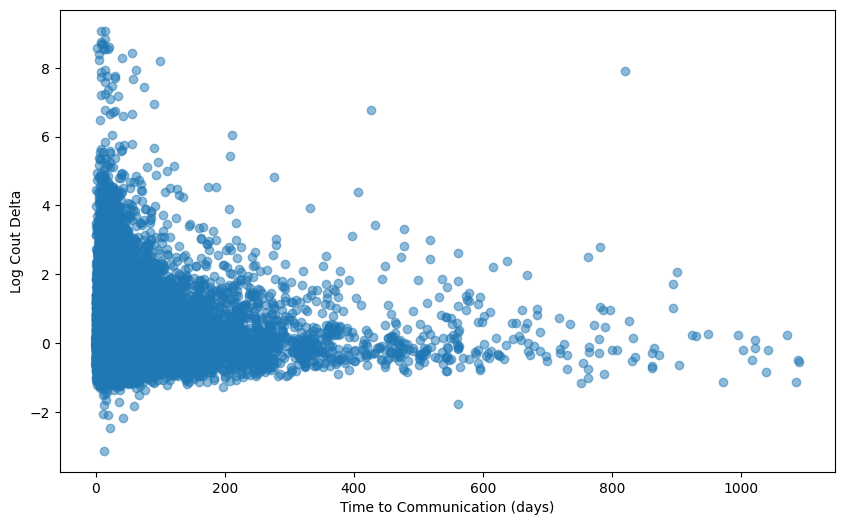

In [ ]:
# =====================================
# 4.1. Feature n°1: Days to Communication
# =====================================

# Create variable time_to_com which is the difference in days between date_communication and date_accident
df['time_to_com'] = (df['date_communication'] - df['date_accident']).dt.days

# Histogram of time_to_com
plt.figure(figsize=(10, 6))
plt.hist(df['time_to_com'], bins=30, edgecolor='k')
plt.xlabel('Time to Communication (days)')
plt.ylabel('Frequency')

# scatter of time_to_com with cout_ultime
plt.figure(figsize=(10, 6))
plt.scatter(df['time_to_com'], df['cout_delta'], alpha=0.5)
plt.xlabel('Time to Communication (days)')
plt.ylabel('Log Cout Delta')

In [ ]:
# =====================================
# 4.1. Feature n°3: Accidents during Working Hours
# =====================================

# Define working hours (adjust these values if needed)
start_hour = 8  # 8 AM
end_hour = 18   # 6 PM

# Iterate through the DataFrame and check the accident hour
for index, row in df.iterrows():
    accident_hour = row['date_accident'].hour
    if start_hour <= accident_hour < end_hour:
        df.loc[index, 'accident_during_working_hours'] = 1  # Set to 1 if within working hours
    else :
        df.loc[index, 'accident_during_working_hours'] = 0

df["accident_during_working_hours"] = df["accident_during_working_hours"].astype("category")


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


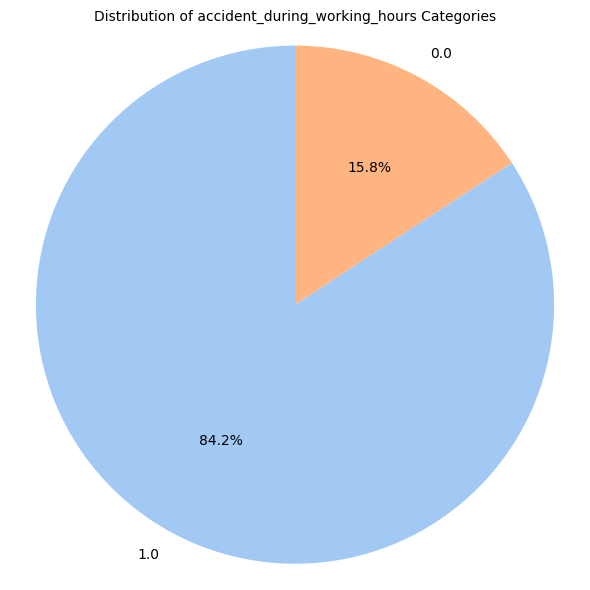

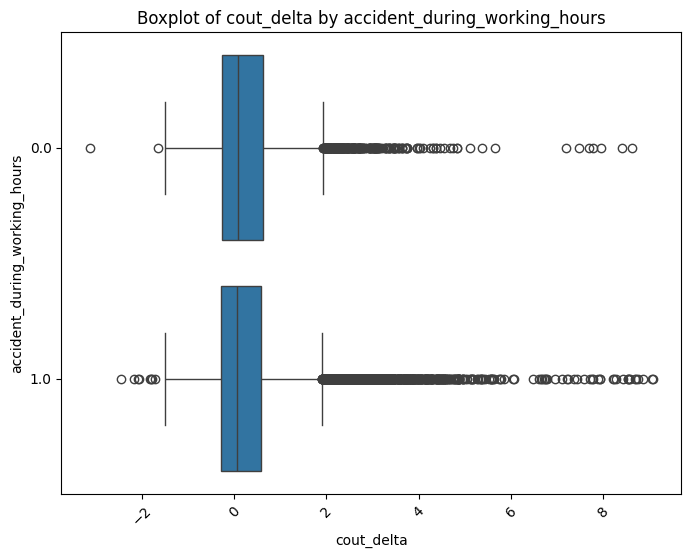

In [ ]:
# Plot pie chart of accident_during_working_hours
category_counts = df['accident_during_working_hours'].value_counts()

# Create a pie chart
fig, ax = plt.subplots(figsize=(6, 6))
colors = sns.color_palette('pastel')

ax.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90, colors=colors)
ax.set_title(f'Distribution of accident_during_working_hours Categories', fontsize=10)

# Equal aspect ratio ensures the pie is circular
ax.axis('equal')

plt.tight_layout()
plt.show()

# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=df["cout_delta"], y=df["accident_during_working_hours"])
plt.title(f"Boxplot of cout_delta by accident_during_working_hours")
plt.xticks(rotation=45)
plt.show()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    45095.000000
mean         0.168107
std          0.115160
min          0.000000
25%          0.139429
50%          0.155365
75%          0.164646
max          6.252289
Name: effective_hourly_wage, dtype: float64


Text(0, 0.5, 'Frequency')

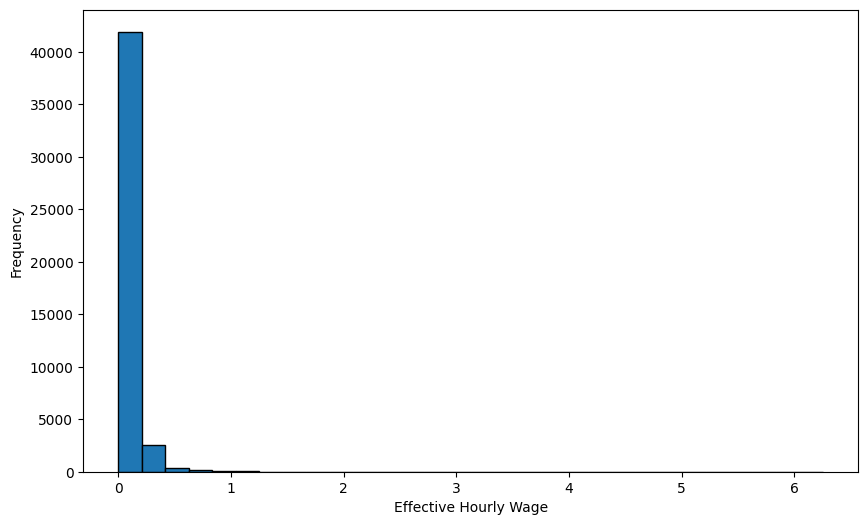

In [ ]:
# =====================================
# 4.1. Feature n°4: Effective Hourly Wage
# =====================================

# Check for any zero or missing values in 'heure_par_semaine' to avoid division errors
if (df['heure_par_semaine'] == 0).any():
    print("Warning: Found zero values in 'heure_par_semaine'. Replacing them with NaN.")
    df.loc[df['heure_par_semaine'] == 0, 'heure_par_semaine'] = np.nan

# Create the 'effective_hourly_wage' feature
df['effective_hourly_wage'] = df['log_salaire'] / df['heure_par_semaine']

# Optional: Handle missing or infinite values in the new feature
df['effective_hourly_wage'] = df['effective_hourly_wage'].replace([np.inf, -np.inf], np.nan)

# Display basic statistics of the new feature
print(df['effective_hourly_wage'].describe())

# Histogram
plt.figure(figsize=(10, 6))
plt.hist(df['effective_hourly_wage'], bins=30, edgecolor='k')
plt.xlabel('Effective Hourly Wage')
plt.ylabel('Frequency')

In [ ]:
# Conver hourly wage to a categorical variable based on if the hourly salary is bigger than 15/h
df['hourly_wage_category'] = np.where(df['effective_hourly_wage'] > 0.16, "High", "Low")


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


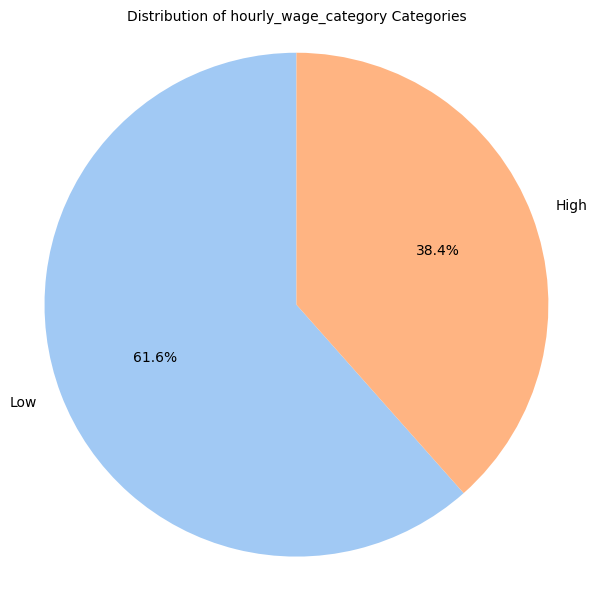

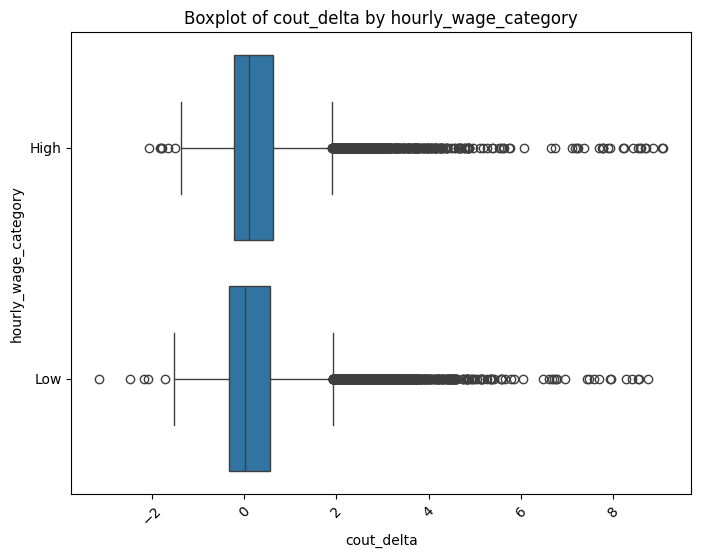

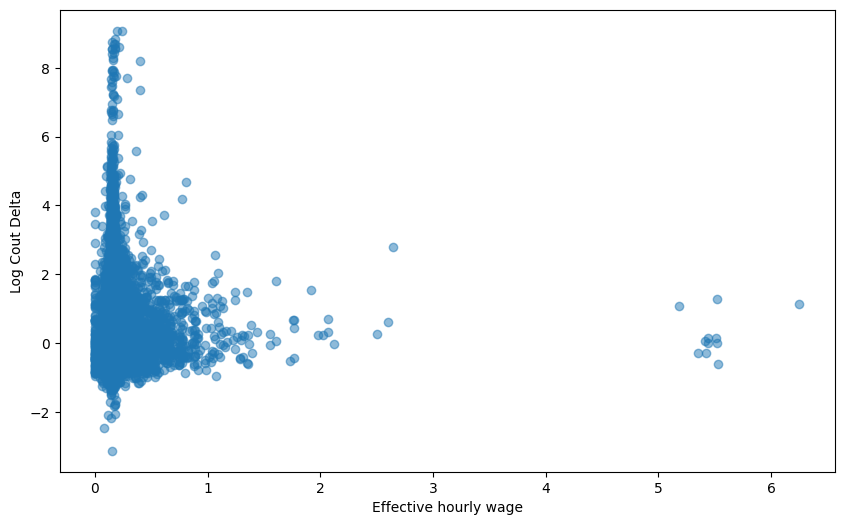

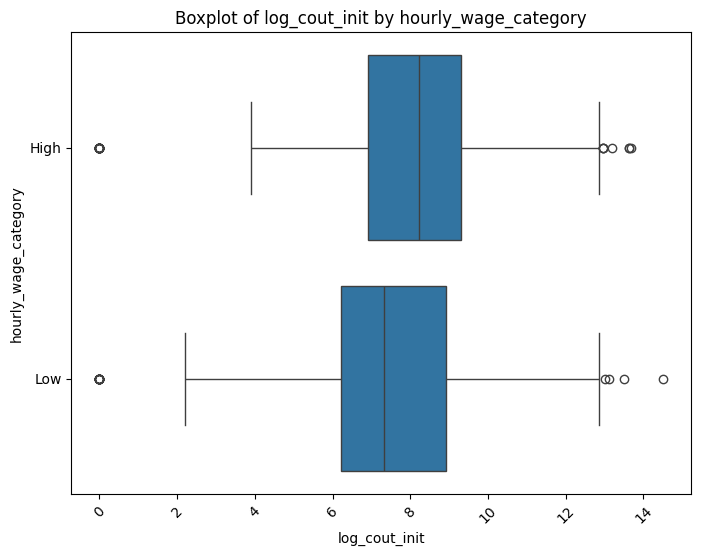

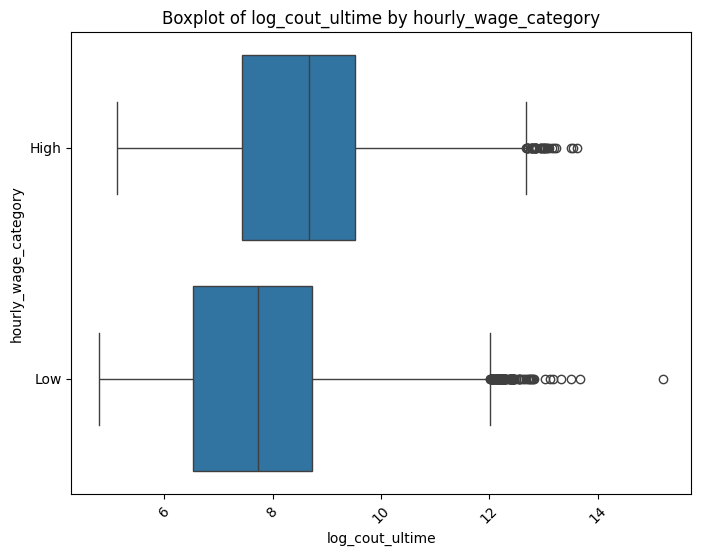

In [ ]:
# Plot pie chart of accident_during_working_hours
df["hourly_wage_category"] = df["hourly_wage_category"].astype("category")

category_counts = df['hourly_wage_category'].value_counts()

# Create a pie chart
fig, ax = plt.subplots(figsize=(6, 6))
colors = sns.color_palette('pastel')

ax.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90, colors=colors)
ax.set_title(f'Distribution of hourly_wage_category Categories', fontsize=10)

# Equal aspect ratio ensures the pie is circular
ax.axis('equal')

plt.tight_layout()
plt.show()

# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=df["cout_delta"], y=df["hourly_wage_category"])
plt.title(f"Boxplot of cout_delta by hourly_wage_category")
plt.xticks(rotation=45)
plt.show()

# scatter of
plt.figure(figsize=(10, 6))
plt.scatter(df['effective_hourly_wage'], df['cout_delta'], alpha=0.5)
plt.xlabel('Effective hourly wage')
plt.ylabel('Log Cout Delta')

# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=df["log_cout_init"], y=df["hourly_wage_category"])
plt.title(f"Boxplot of log_cout_init by hourly_wage_category")
plt.xticks(rotation=45)
plt.show()

# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=df["log_cout_ultime"], y=df["hourly_wage_category"])
plt.title(f"Boxplot of log_cout_ultime by hourly_wage_category")
plt.xticks(rotation=45)
plt.show()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Claim Salary Category Distribution:
claim_salary_category
0.5-1       8815
8-9         8087
0.25-0.5    8032
4-5         5202
1-2         5091
2-3         3382
<0.25       2885
5-6         1473
6-7         1245
7-8          907
Name: count, dtype: int64


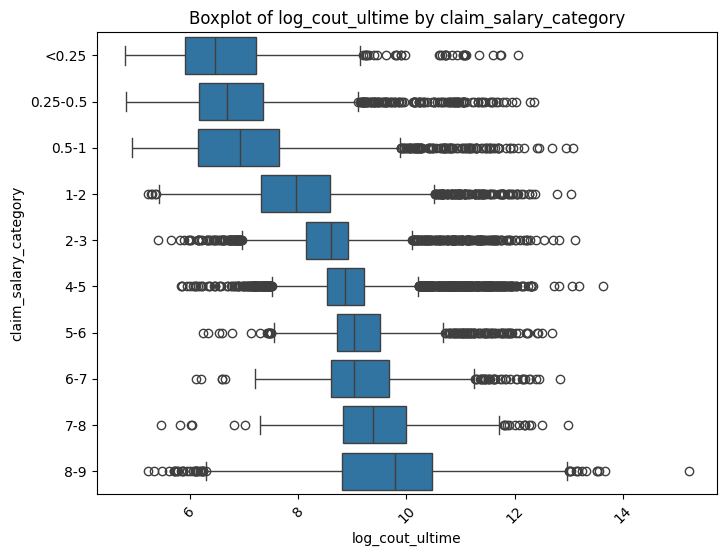

In [ ]:
# =====================================
# 4.1. Feature n°5: Claim/Salary
# =====================================

# Create variable cou_init/(salaire_semaine*4)
df['claim_salary'] = df['cout_init'] / (df['salaire_semaine'] * 4)

# Define bins and labels for categorization
bins = [-float('inf'),0.25, 0.5, 1, 2, 3, 5, 6, 7, 8, float('inf')]
labels = ['<0.25','0.25-0.5', '0.5-1', '1-2', '2-3', '4-5', '5-6', '6-7', '7-8', '8-9']

# Categorize 'claim_salary' into the defined bins
df['claim_salary_category'] = pd.cut(df['claim_salary'], bins=bins, labels=labels, right=True)

# Display the distribution of the new category
print("Claim Salary Category Distribution:")
print(df['claim_salary_category'].value_counts())

# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=df["log_cout_ultime"], y=df["claim_salary_category"])
plt.title(f"Boxplot of log_cout_ultime by claim_salary_category")
plt.xticks(rotation=45)
plt.show()


### Observation:
On commence a constater des rélation plus interessantes entre nos features et la variable d'interet.

In [ ]:
# =========================================================================
# 4.1. Feature n°6: Transforming The Variable Description into Topic Scores
# =========================================================================

# Ensure necessary NLTK data is downloaded
nltk.download('stopwords')

# Load the dataset
data = df
descriptions = data['description'].dropna().str.lower()

# Define a regex tokenizer
tokenizer = RegexpTokenizer(r'\w+')

# Step 1: Text Preprocessing
def preprocess_text(text):
    stop_words = set(stopwords.words("english"))
    words = tokenizer.tokenize(text)
    words = [word for word in words if word.isalpha() and word not in stop_words]
    return words  # Return tokenized words

preprocessed_descriptions = descriptions.apply(preprocess_text)

# Step 2: Create a Gensim Dictionary and Corpus
dictionary = Dictionary(preprocessed_descriptions)
corpus = [dictionary.doc2bow(text) for text in preprocessed_descriptions]

# Step 3: Train Latent Dirichlet Allocation (LDA) Model
num_topics = 5  # Set the number of topics
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes=10)

# Step 4: Assign Topic Distributions to Each Description
def get_topic_distribution(text):
    bow = dictionary.doc2bow(text)
    topic_dist = lda_model.get_document_topics(bow, minimum_probability=0.0)
    return [prob for _, prob in topic_dist]

data_topics = preprocessed_descriptions.apply(get_topic_distribution)
topic_columns = [f"topic_{i}" for i in range(num_topics)]
topic_df = pd.DataFrame(data_topics.tolist(), columns=topic_columns)

# Step 5: Add Topic Features to the Original DataFrame
data = pd.concat([data.reset_index(drop=True), topic_df], axis=1)

# Step 6: Save the Enriched Dataset
data.to_csv("enriched_dataset.csv", index=False)

print("Enriched dataset with topic features saved!")

with open("lda_dictionary.pkl", "wb") as f:
    pickle.dump(dictionary, f)

lda_model.save("lda_model")

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Enriched dataset with topic features saved!


In [ ]:
# Visualize topic distribution and PCA
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)

# Display the visualization
pyLDAvis.display(vis)

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


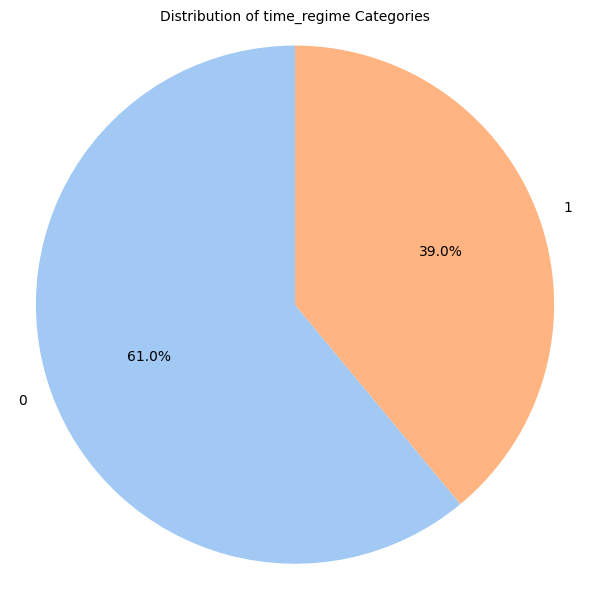

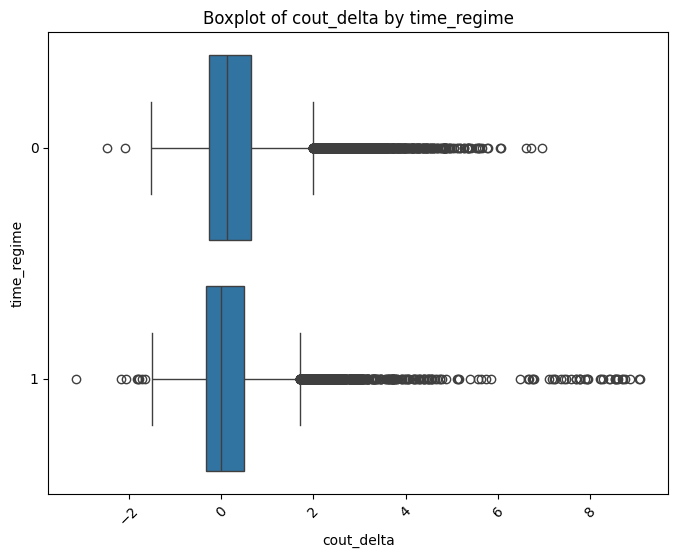

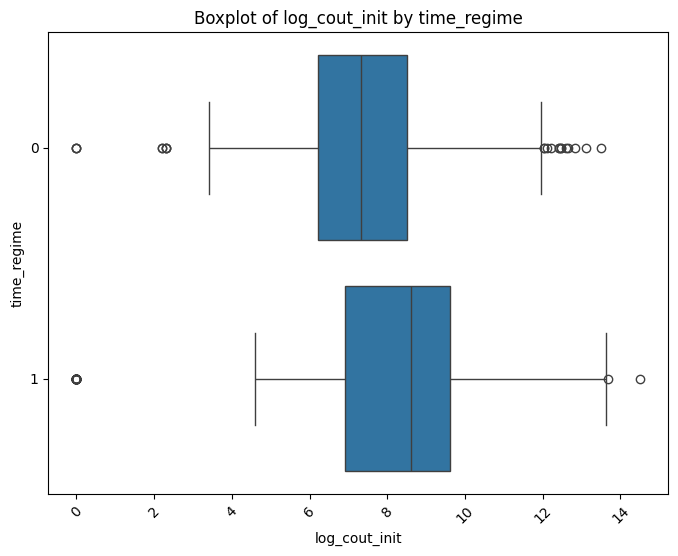

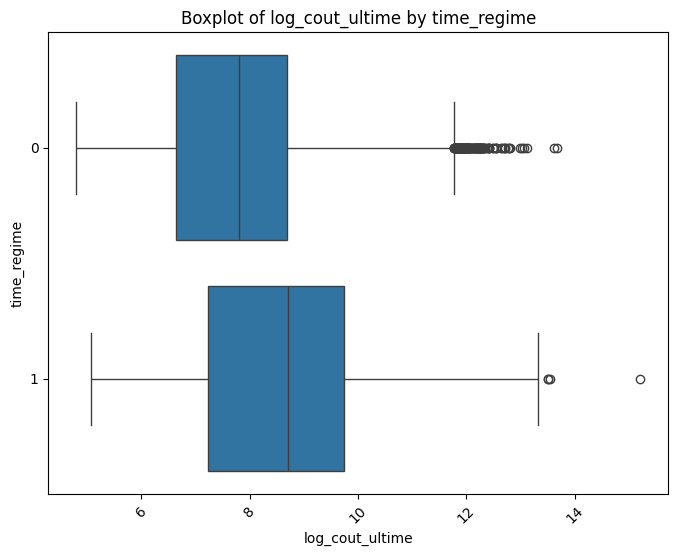

In [ ]:
# =========================================================================
# 4.1. Feature n°7: Binary Variable related to Time Regime
# =========================================================================

# Create a new variable in data that takes a value of 1 when date_accident is after than 1998 and 0 if before
data['time_regime'] = np.where(data['year_accident'] > 1998, 1, 0)

# Plot pie chart
data["time_regime"] = data["time_regime"].astype("category")

category_counts = data['time_regime'].value_counts()

# Create a pie chart
fig, ax = plt.subplots(figsize=(6, 6))
colors = sns.color_palette('pastel')

ax.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90, colors=colors)
ax.set_title(f'Distribution of time_regime Categories', fontsize=10)

# Equal aspect ratio ensures the pie is circular
ax.axis('equal')

plt.tight_layout()
plt.show()

# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=data["cout_delta"], y=data["time_regime"])
plt.title(f"Boxplot of cout_delta by time_regime")
plt.xticks(rotation=45)
plt.show()


# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=data["log_cout_init"], y=data["time_regime"])
plt.title(f"Boxplot of log_cout_init by time_regime")
plt.xticks(rotation=45)
plt.show()

# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=data["log_cout_ultime"], y=data["time_regime"])
plt.title(f"Boxplot of log_cout_ultime by time_regime")
plt.xticks(rotation=45)
plt.show()

In [ ]:
data

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Identifiant,date_accident,date_communication,age,sexe,status_marital,enfants,autre_dep,salaire_semaine,type_emploi,...,effective_hourly_wage,hourly_wage_category,claim_salary,claim_salary_category,topic_0,topic_1,topic_2,topic_3,topic_4,time_regime
0,W0002208,1988-01-01 09:00:00+00:00,1988-03-07 00:00:00+00:00,59,F,M,0,0,334.90,F,...,0.145346,Low,1.492983,1-2,0.020147,0.139923,0.799458,0.020453,0.020020,0
1,W0022453,1988-01-01 13:00:00+00:00,1988-02-15 00:00:00+00:00,50,F,M,0,0,300.00,F,...,0.178243,High,20.833333,8-9,0.028656,0.028665,0.280794,0.028621,0.633264,0
2,W0040630,1988-01-02 01:00:00+00:00,1988-03-11 00:00:00+00:00,65,M,S,0,0,413.06,F,...,0.158516,Low,6.052389,6-7,0.033582,0.216729,0.361115,0.033398,0.355177,0
3,W0025266,1988-01-02 08:00:00+00:00,1988-01-20 00:00:00+00:00,19,M,S,0,0,126.45,F,...,0.120996,Low,19.770660,8-9,0.033504,0.458231,0.033604,0.033900,0.440761,0
4,W0040264,1988-01-02 11:00:00+00:00,1988-01-27 00:00:00+00:00,22,M,M,2,1,372.80,F,...,0.148026,Low,1.341202,1-2,0.139000,0.369663,0.450929,0.020360,0.020049,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45114,W0034257,2005-12-30 00:00:00+00:00,2006-02-09 00:00:00+00:00,52,M,S,0,0,848.00,F,...,0.177444,High,3.537736,4-5,0.033334,0.033419,0.033334,0.033334,0.866580,1
45115,W0034489,2005-12-30 08:00:00+00:00,2006-01-16 00:00:00+00:00,26,F,S,0,0,200.00,F,...,0.132458,Low,87.500000,8-9,0.050000,0.358542,0.050000,0.050098,0.491359,1
45116,W0030644,2005-12-30 12:00:00+00:00,2006-01-04 00:00:00+00:00,34,M,U,0,0,581.40,F,...,0.167512,High,30.336257,8-9,0.025155,0.482949,0.025410,0.441453,0.025033,1
45117,W0002832,2005-12-30 17:00:00+00:00,2006-01-09 00:00:00+00:00,37,M,S,0,0,500.00,F,...,0.163542,High,1.000000,0.5-1,0.033363,0.033334,0.033880,0.292245,0.607179,1


In [ ]:
data.describe()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,age,salaire_semaine,heure_par_semaine,jour_par_semaine,cout_init,cout_ultime,log_salaire,log_cout_init,log_cout_ultime,year_accident,...,date_diff_days,cout_delta,time_to_com,effective_hourly_wage,claim_salary,topic_0,topic_1,topic_2,topic_3,topic_4
count,45119.000000,45119.000000,45095.000000,45119.000000,4.511900e+04,4.511900e+04,45119.000000,45119.000000,45119.000000,45119.000000,...,45119.000000,45119.000000,45119.000000,45095.000000,45119.000000,45119.000000,45119.000000,45119.000000,45119.000000,45119.000000
mean,33.849997,413.583534,37.431171,4.899976,7.837783e+03,1.104930e+04,5.863825,7.822417,8.065756,1996.510007,...,38.301536,0.243339,38.301536,0.168107,12.468245,0.255894,0.231020,0.099263,0.192892,0.220931
std,12.129308,228.761231,6.949041,0.556637,2.087321e+04,3.426564e+04,0.654593,1.514645,1.527279,5.191324,...,61.151217,0.817453,61.151217,0.115160,281.657835,0.319577,0.277219,0.170290,0.245490,0.291616
min,13.000000,1.000000,1.000000,1.000000,1.000000e+00,1.218868e+02,0.000000,0.000000,4.803093,1988.000000,...,-1.000000,-3.131972,-1.000000,0.000000,0.000246,0.014458,0.015424,0.015389,0.015405,0.014653
25%,23.000000,200.000000,38.000000,5.000000,7.000000e+02,9.284458e+02,5.298317,6.551080,6.833512,1992.000000,...,13.000000,-0.283663,13.000000,0.139429,0.523788,0.028572,0.028572,0.025073,0.025848,0.025078
50%,32.000000,392.200000,38.000000,5.000000,2.000000e+03,3.372344e+03,5.971772,7.600902,8.123363,1997.000000,...,21.000000,0.063590,21.000000,0.155365,1.462844,0.033685,0.035823,0.028735,0.033814,0.033336
75%,43.000000,500.000000,40.000000,5.000000,9.500000e+03,8.198903e+03,6.214608,9.159047,9.011756,2001.000000,...,40.000000,0.593295,40.000000,0.164646,5.278605,0.487806,0.398960,0.040205,0.310347,0.354971
max,81.000000,2000.000000,84.000000,7.000000,2.000000e+06,4.027136e+06,7.600902,14.508658,15.208566,2005.000000,...,1090.000000,9.078386,1090.000000,6.252289,37500.000000,0.933061,0.926806,0.926369,0.919720,0.926879


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45119 entries, 0 to 45118
Data columns (total 41 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   Identifiant                    45119 non-null  object             
 1   date_accident                  45119 non-null  datetime64[ns, UTC]
 2   date_communication             45119 non-null  datetime64[ns, UTC]
 3   age                            45119 non-null  int64              
 4   sexe                           45119 non-null  category           
 5   status_marital                 45119 non-null  category           
 6   enfants                        45119 non-null  category           
 7   autre_dep                      45119 non-null  category           
 8   salaire_semaine                45119 non-null  float64            
 9   type_emploi                    45119 non-null  category           
 10  heure_par_semaine     

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# variance inflation factor
from statsmodels.stats.outliers_influence import variance_inflation_factor

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# ===============================================================
# 4.2 Assessment of Feature Interaction
# ===============================================================

# 1. Create a DataFrame with only numerical features

numerical_df = data[[
'topic_0',
'topic_1',
'topic_2',
'topic_3',
'topic_4',
'age',
'salaire_semaine',
'effective_hourly_wage',
'log_cout_init',
'time_to_com',
'time_regime']]

# 2. Handle missing or infinite values
numerical_df = numerical_df.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
numerical_df = numerical_df.dropna()  # Drop rows with missing values

# 3. Calculate VIF for each numerical feature
vif_data = pd.DataFrame()
vif_data["feature"] = numerical_df.columns
vif_data["VIF"] = [variance_inflation_factor(numerical_df.values, i) for i in range(numerical_df.shape[1])]

# 4. Display VIF values
print(vif_data)

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


                  feature        VIF
0                 topic_0   5.981032
1                 topic_1   6.701747
2                 topic_2   2.644344
3                 topic_3   4.971525
4                 topic_4   8.144556
5                     age   9.331792
6         salaire_semaine   4.956220
7   effective_hourly_wage   3.148223
8           log_cout_init  40.588763
9             time_to_com   1.398536
10            time_regime   1.927444


In [ ]:
data

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Identifiant,date_accident,date_communication,age,sexe,status_marital,enfants,autre_dep,salaire_semaine,type_emploi,...,effective_hourly_wage,hourly_wage_category,claim_salary,claim_salary_category,topic_0,topic_1,topic_2,topic_3,topic_4,time_regime
0,W0002208,1988-01-01 09:00:00+00:00,1988-03-07 00:00:00+00:00,59,F,M,0,0,334.90,F,...,0.145346,Low,1.492983,1-2,0.919425,0.020391,0.020150,0.020026,0.020008,0
1,W0022453,1988-01-01 13:00:00+00:00,1988-02-15 00:00:00+00:00,50,F,M,0,0,300.00,F,...,0.178243,High,20.833333,8-9,0.028575,0.030317,0.028616,0.028575,0.883916,0
2,W0040630,1988-01-02 01:00:00+00:00,1988-03-11 00:00:00+00:00,65,M,S,0,0,413.06,F,...,0.158516,Low,6.052389,6-7,0.033341,0.174558,0.033341,0.521881,0.236879,0
3,W0025266,1988-01-02 08:00:00+00:00,1988-01-20 00:00:00+00:00,19,M,S,0,0,126.45,F,...,0.120996,Low,19.770660,8-9,0.033654,0.033558,0.324517,0.267373,0.340899,0
4,W0040264,1988-01-02 11:00:00+00:00,1988-01-27 00:00:00+00:00,22,M,M,2,1,372.80,F,...,0.148026,Low,1.341202,1-2,0.541249,0.397669,0.020660,0.020422,0.020000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45114,W0034257,2005-12-30 00:00:00+00:00,2006-02-09 00:00:00+00:00,52,M,S,0,0,848.00,F,...,0.177444,High,3.537736,4-5,0.033334,0.033359,0.033390,0.033334,0.866583,1
45115,W0034489,2005-12-30 08:00:00+00:00,2006-01-16 00:00:00+00:00,26,F,S,0,0,200.00,F,...,0.132458,Low,87.500000,8-9,0.050000,0.050870,0.336200,0.050660,0.512271,1
45116,W0030644,2005-12-30 12:00:00+00:00,2006-01-04 00:00:00+00:00,34,M,U,0,0,581.40,F,...,0.167512,High,30.336257,8-9,0.756984,0.025383,0.025163,0.167440,0.025029,1
45117,W0002832,2005-12-30 17:00:00+00:00,2006-01-09 00:00:00+00:00,37,M,S,0,0,500.00,F,...,0.163542,High,1.000000,0.5-1,0.866534,0.033333,0.033333,0.033465,0.033333,1


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Tableau du rapport de corrélation (eta²) entre variables quantitatives et qualitatives:
                log_salaire  log_cout_init   topic_0       topic_1   topic_2  \
sexe               0.009118       0.005328  0.007119  2.727512e-03  0.000410   
status_marital     0.003855       0.015766  0.010921  7.382244e-04  0.000358   
type_emploi        0.035295       0.002487  0.000174  1.023744e-04  0.000215   
time_regime        0.041265       0.086380  0.000923  9.221451e-09  0.000215   

                 topic_3   topic_4  time_to_com  
sexe            0.000014  0.000835     0.002091  
status_marital  0.000484  0.004297     0.000881  
type_emploi     0.000049  0.000005     0.000937  
time_regime     0.000778  0.000002     0.000389  


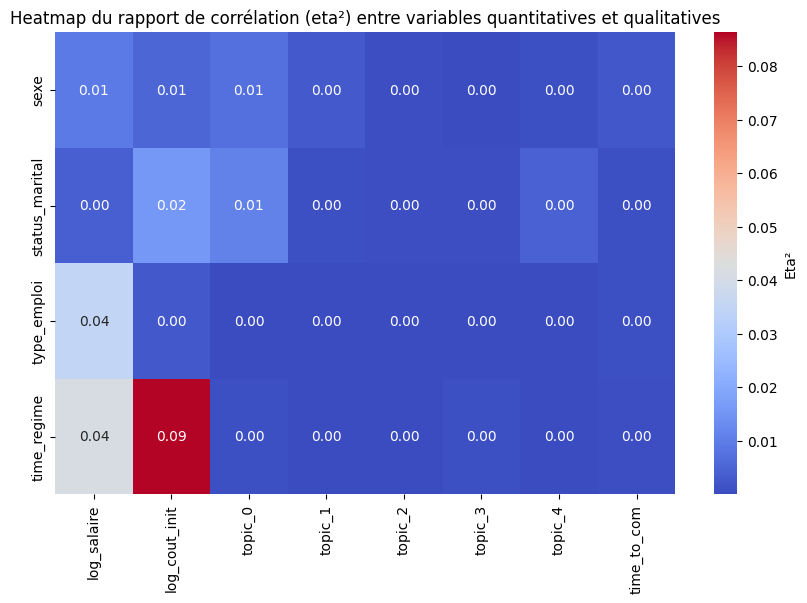

In [ ]:
# Assurez-vous que le DataFrame df1 existe et contient les bonnes colonnes
df2 = data

# Sélection des colonnes quantitatives et qualitatives
quantitative_cols = df2[['log_salaire', 'log_cout_init', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'time_to_com']]
qualitative_cols = df2[['sexe', 'status_marital', 'type_emploi','time_regime']]

# Initialiser un dictionnaire pour stocker les résultats de eta²
eta2_results = {}

# Calcul de eta² pour chaque paire de variables quantitatives et qualitatives
for quantitative_col in quantitative_cols.columns:
    eta2_results[quantitative_col] = {}
    for qualitative_col in qualitative_cols.columns:
        eta2_results[quantitative_col][qualitative_col] = eta2(df2[quantitative_col], df2[qualitative_col])

# Convertir le dictionnaire en DataFrame pour obtenir un tableau lisible
eta2_df = pd.DataFrame(eta2_results)

# Afficher le tableau des résultats
print("Tableau du rapport de corrélation (eta²) entre variables quantitatives et qualitatives:")
print(eta2_df)

# Générer la heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(eta2_df, annot=True, cmap='coolwarm', cbar_kws={'label': 'Eta²'}, fmt=".2f")
plt.title("Heatmap du rapport de corrélation (eta²) entre variables quantitatives et qualitatives")
plt.show()

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45119 entries, 0 to 45118
Data columns (total 41 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   Identifiant                    45119 non-null  object             
 1   date_accident                  45119 non-null  datetime64[ns, UTC]
 2   date_communication             45119 non-null  datetime64[ns, UTC]
 3   age                            45119 non-null  int64              
 4   sexe                           45119 non-null  category           
 5   status_marital                 45119 non-null  category           
 6   enfants                        45119 non-null  category           
 7   autre_dep                      45119 non-null  category           
 8   salaire_semaine                45119 non-null  float64            
 9   type_emploi                    45119 non-null  category           
 10  heure_par_semaine     

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# 5. Modelling

### 5.1. Model Selection: Regression, Decision Trees, and Gradient Boosting

In [ ]:
data.sort_values(by=['Identifiant'], inplace=True)

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# ===============================================================
# 5.1 Model Testing: Selecting Model based on Evaluation Metrics
# ===============================================================

# Prepare data
df1 = data
y = df1["log_cout_ultime"]
X = df1[
    [
        "log_cout_init",
        "topic_0",
        "topic_1",
        "topic_2",
        "topic_3",
        "time_to_com",
        "accident_during_working_hours",
        "sexe",
        "type_emploi",
        "enfants",
        "effective_hourly_wage",
        "claim_salary_category",
        'time_regime',
        'autre_dep'
    ]
]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define numeric and categorical features
numeric_features = [
    "log_cout_init",
    "topic_0",
    "topic_1",
    "topic_2",
    "topic_3",
    "time_to_com",
    "effective_hourly_wage"
]

categorical_features = [
    "sexe",
    "type_emploi",
    "enfants",
    "claim_salary_category",
    'time_regime',
    "accident_during_working_hours",
    'autre_dep'
]

# Create preprocessing pipeline
numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(drop="first"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features)
    ]
)

# Define models to compare (excluding XGBoost for now)
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42, n_estimators=10),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42, n_estimators=10),
    "ElasticNet": ElasticNet(alpha=0.5, l1_ratio=0.5, random_state=100)
}

# Train, predict, measure inference time, and compute metrics
results = {}
inference_times = {}

for model_name, model_obj in models.items():
    # Build pipeline with preprocessing + current model
    pipe = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("regressor", model_obj)
    ])

    # Fit on training data
    pipe.fit(X_train, y_train)

    # Measure inference time
    start_time = time.time()
    y_pred = pipe.predict(X_test)
    end_time = time.time()
    inference_time = end_time - start_time

    # Compute metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Store results
    results[model_name] = {
        "Pipeline": pipe,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2,
        "Inference Time": inference_time
    }

# Print results
print("\nModel Performance (excluding XGBoost):")
for model_name, metrics in results.items():
    print(f"{model_name}: \n    RMSE = {metrics['RMSE']:.2f} \n    MAE = {metrics['MAE']:.2f} \n    R2 = {metrics['R2']:.2f} \n    Inference Time = {metrics['Inference Time']:.4f} seconds\n")



/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Model Performance (excluding XGBoost):
Linear Regression: 
    RMSE = 0.71 
    MAE = 0.47 
    R2 = 0.79 
    Inference Time = 0.1023 seconds

Decision Tree: 
    RMSE = 0.90 
    MAE = 0.59 
    R2 = 0.66 
    Inference Time = 0.0586 seconds

Random Forest: 
    RMSE = 0.67 
    MAE = 0.45 
    R2 = 0.81 
    Inference Time = 0.0853 seconds

Gradient Boosting: 
    RMSE = 0.85 
    MAE = 0.63 
    R2 = 0.69 
    Inference Time = 0.0338 seconds

ElasticNet: 
    RMSE = 0.87 
    MAE = 0.64 
    R2 = 0.68 
    Inference Time = 0.0514 seconds



In [ ]:
# =======================================================================
# 4.1 Model Testing: Selecting Model based on Evaluation Metrics: XGBOOST
# =======================================================================

# Preprocess the data manually for XGBoost
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

xgb_model = XGBRegressor(random_state=42, n_estimators=10, use_label_encoder=False, verbosity=0)
xgb_model.fit(X_train_preprocessed, y_train)

# Measure inference time for XGBoost
start_time = time.time()
y_pred_xgb = xgb_model.predict(X_test_preprocessed)
end_time = time.time()
xgb_inference_time = end_time - start_time

# Compute metrics for XGBoost
xgb_rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
xgb_mae = mean_absolute_error(y_test, y_pred_xgb)
xgb_r2 = r2_score(y_test, y_pred_xgb)

print(f"XGBoost:\n    RMSE = {xgb_rmse:.2f} \n    MAE = {xgb_mae:.2f} \n    R2 = {xgb_r2:.2f} \n    Inference Time = {xgb_inference_time:.4f} seconds\n")

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


XGBoost:
    RMSE = 0.64 
    MAE = 0.41 
    R2 = 0.83 
    Inference Time = 0.0048 seconds



In [ ]:
# ========================================================================
# 4.1 Model Testing: Selecting Model based on Evaluation Metrics: CatBoost
# ========================================================================

# Preprocess the data manually for CatBoost
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Initialize and train the CatBoost Regressor
catboost_model = CatBoostRegressor(random_seed=42, verbose=0)
catboost_model.fit(X_train_preprocessed, y_train)

# Measure inference time for CatBoost
start_time = time.time()
y_pred_catboost = catboost_model.predict(X_test_preprocessed)
end_time = time.time()
catboost_inference_time = end_time - start_time

# Compute metrics for CatBoost
catboost_rmse = np.sqrt(mean_squared_error(y_test, y_pred_catboost))
catboost_mae = mean_absolute_error(y_test, y_pred_catboost)
catboost_r2 = r2_score(y_test, y_pred_catboost)

print(f"CatBoost:\n    RMSE = {catboost_rmse:.2f} \n    MAE = {catboost_mae:.2f} \n    R2 = {catboost_r2:.2f} \n    Inference Time = {catboost_inference_time:.4f} seconds\n")


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CatBoost:
    RMSE = 0.62 
    MAE = 0.40 
    R2 = 0.84 
    Inference Time = 0.1162 seconds



/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


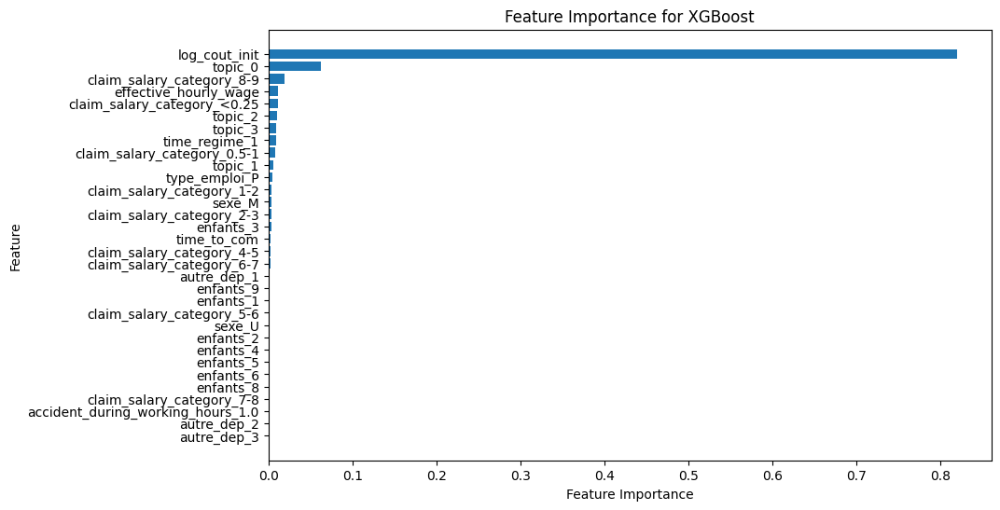

In [ ]:
# ===============================================================
# 4.2 Model Testing: Feature Importance on XGBOOST
# ===============================================================

# Retrieve feature importance from the trained XGBoost model
xgb_importances = xgb_model.feature_importances_

# Get feature names from the preprocessed data
preprocessor_features = (
    numeric_features + list(preprocessor.named_transformers_['cat']['encoder'].get_feature_names_out(categorical_features))
)

# Combine feature names with their importance values
feature_importance = list(zip(preprocessor_features, xgb_importances))

# Sort features by importance
sorted_features = sorted(feature_importance, key=lambda x: x[1], reverse=True)

# Extract sorted names and values for plotting
sorted_names, sorted_values = zip(*sorted_features)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(sorted_names, sorted_values)
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Feature Importance for XGBoost")
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


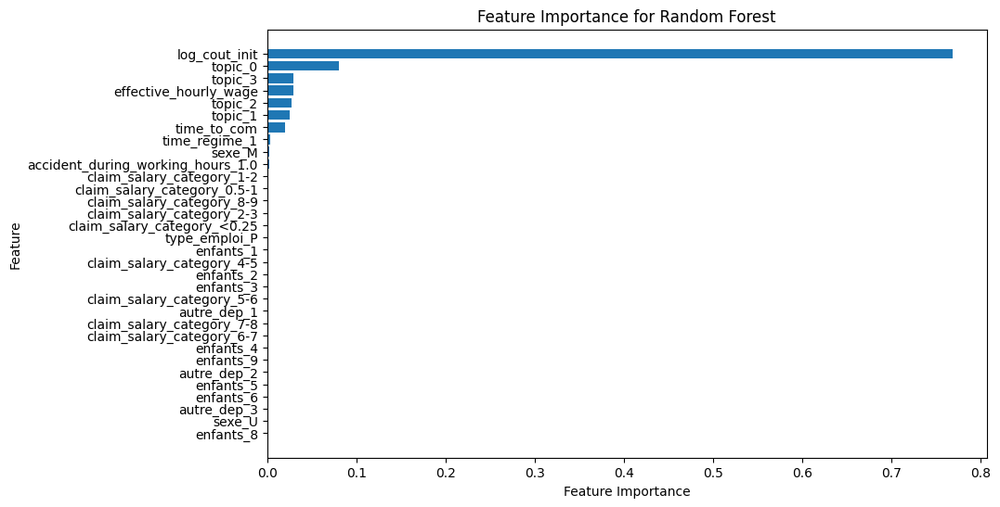

In [ ]:
# ===============================================================
# 4.2 Model Testing: Feature Importance on RANDOM FOREST
# ===============================================================

# Feature importance for Random Forest
rf_importances = results["Random Forest"]["Pipeline"].named_steps["regressor"].feature_importances_


# Get feature names from the preprocessed data
preprocessor_features = (
    numeric_features + list(preprocessor.named_transformers_['cat']['encoder'].get_feature_names_out(categorical_features))
)

# Combine feature names with their importance values for Random Forest
rf_feature_importance = list(zip(preprocessor_features, rf_importances))
rf_sorted_features = sorted(rf_feature_importance, key=lambda x: x[1], reverse=True)
rf_sorted_names, rf_sorted_values = zip(*rf_sorted_features)

# Plot feature importance for Random Forest
plt.figure(figsize=(10, 6))
plt.barh(rf_sorted_names, rf_sorted_values)
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Feature Importance for Random Forest")
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


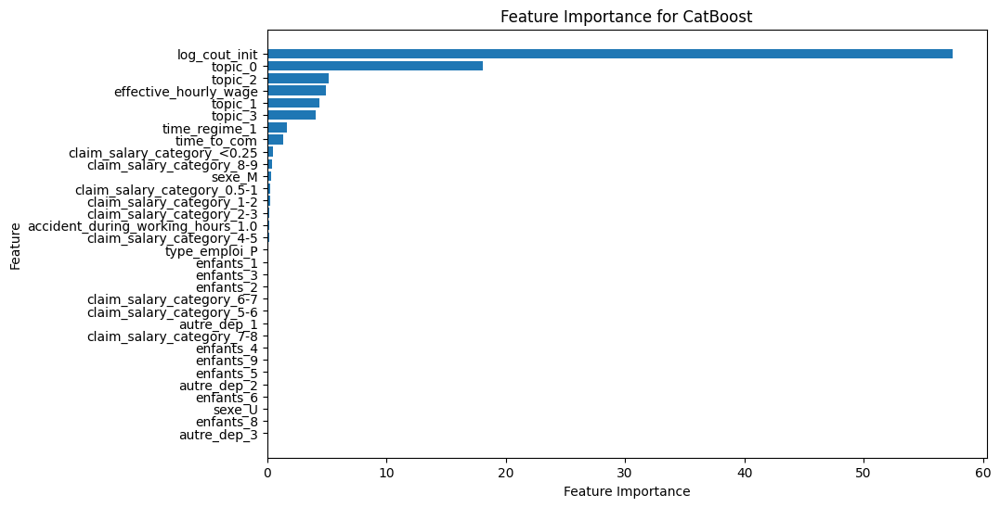

In [ ]:
# ===============================================================
# Train CatBoost Regressor
# ===============================================================
catboost_model = CatBoostRegressor(random_seed=42, verbose=0)
catboost_model.fit(preprocessor.fit_transform(X_train), y_train)

# Retrieve Feature Importance for CatBoost
catboost_importances = catboost_model.get_feature_importance()

# Get feature names from the preprocessed data
preprocessor_features = (
    numeric_features + list(preprocessor.named_transformers_['cat']['encoder'].get_feature_names_out(categorical_features))
)

# Combine feature names with their importance values
catboost_feature_importance = list(zip(preprocessor_features, catboost_importances))

# Sort features by importance
sorted_catboost_features = sorted(catboost_feature_importance, key=lambda x: x[1], reverse=True)

# Extract sorted names and values for plotting
sorted_catboost_names, sorted_catboost_values = zip(*sorted_catboost_features)

# Plot Feature Importance for CatBoost
plt.figure(figsize=(10, 6))
plt.barh(sorted_catboost_names, sorted_catboost_values)
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Feature Importance for CatBoost")
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()


### 5.2. Model Fine-Tuning: Feature Selecion & Hyperparameter Optimization

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Claim Salary Category Distribution:
claim_salary_cat2
>1    25387
<1    19732
Name: count, dtype: int64


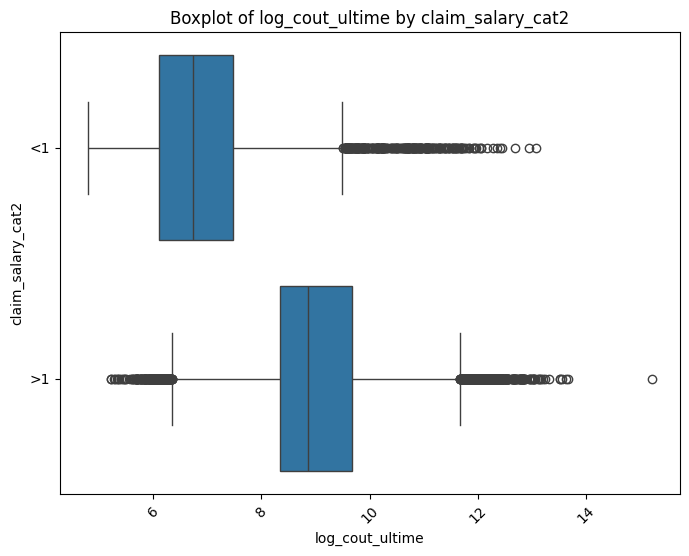

In [ ]:
# ===============================================================
# 5.2.1 Feature Selection and Pre-training
# ===============================================================

# Create a new df
df1 = data

# Re-engineer variable claim_salary_category
# Create variable cou_init/(salaire_semaine*4)
df1['claim_salary'] = df1['cout_init'] / (df1['salaire_semaine'] * 4)

# Define bins and labels for categorization
bins = [-float('inf'),1 , float('inf')]
labels = ['<1','>1']

# Categorize 'claim_salary' into the defined bins
df1['claim_salary_cat2'] = pd.cut(df1['claim_salary'], bins=bins, labels=labels, right=True)

# Display the distribution of the new category
print("Claim Salary Category Distribution:")
print(df1['claim_salary_cat2'].value_counts())

# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=df1["log_cout_ultime"], y=df1["claim_salary_cat2"])
plt.title(f"Boxplot of log_cout_ultime by claim_salary_cat2")
plt.xticks(rotation=45)
plt.show()

In [ ]:

# Prepare data
# Create a new df
y = df1["log_cout_ultime"]
X = df1[
    [
        "log_cout_init",
        "topic_0",
        "topic_1",
        "topic_2",
        "topic_3",
        "time_to_com",
        "sexe",
        "effective_hourly_wage",
        "claim_salary_cat2",
        'time_regime'
    ]
]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define numeric and categorical features
numeric_features = [
    "log_cout_init",
    "topic_0",
    "topic_1",
    "topic_2",
    "topic_3",
    "time_to_com",
    "effective_hourly_wage"
]

categorical_features = [
    "sexe",
    "claim_salary_cat2",
    'time_regime'
]

# Create preprocessing pipeline
numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(drop="first"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features)
    ]
)

# Preprocess the data manually for CatBoost
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Initialize and train the CatBoost Regressor
catboost_model = CatBoostRegressor(random_seed=42, verbose=0)
catboost_model.fit(X_train_preprocessed, y_train)

# Measure inference time for CatBoost
start_time = time.time()
y_pred_catboost = catboost_model.predict(X_test_preprocessed)
end_time = time.time()
catboost_inference_time = end_time - start_time

# Compute metrics for CatBoost
catboost_rmse = np.sqrt(mean_squared_error(y_test, y_pred_catboost))
catboost_mae = mean_absolute_error(y_test, y_pred_catboost)
catboost_r2 = r2_score(y_test, y_pred_catboost)

print(f"CatBoost:\n    RMSE = {catboost_rmse:.2f} \n    MAE = {catboost_mae:.2f} \n    R2 = {catboost_r2:.2f} \n    Inference Time = {catboost_inference_time:.4f} seconds\n")


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CatBoost:
    RMSE = 0.62 
    MAE = 0.40 
    R2 = 0.84 
    Inference Time = 0.0404 seconds



/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


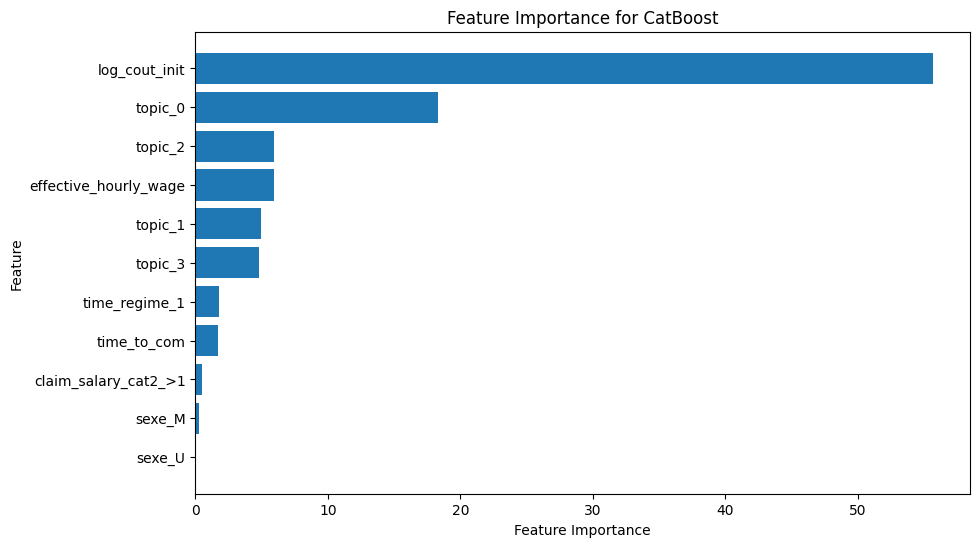

In [ ]:
# Feature Importance on Iteration n°2 of CatBoost
catboost_model = CatBoostRegressor(random_seed=42, verbose=0)
catboost_model.fit(preprocessor.fit_transform(X_train), y_train)

# Retrieve Feature Importance for CatBoost
catboost_importances = catboost_model.get_feature_importance()

# Get feature names from the preprocessed data
preprocessor_features = (
    numeric_features + list(preprocessor.named_transformers_['cat']['encoder'].get_feature_names_out(categorical_features))
)

# Combine feature names with their importance values
catboost_feature_importance = list(zip(preprocessor_features, catboost_importances))

# Sort features by importance
sorted_catboost_features = sorted(catboost_feature_importance, key=lambda x: x[1], reverse=True)

# Extract sorted names and values for plotting
sorted_catboost_names, sorted_catboost_values = zip(*sorted_catboost_features)

# Plot Feature Importance for CatBoost
plt.figure(figsize=(10, 6))
plt.barh(sorted_catboost_names, sorted_catboost_values)
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Feature Importance for CatBoost")
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()


In [ ]:
print(data.describe())

                age  salaire_semaine  heure_par_semaine  jour_par_semaine  \
count  45119.000000     45119.000000       45095.000000      45119.000000   
mean      33.849997       413.583534          37.431171          4.899976   
std       12.129308       228.761231           6.949041          0.556637   
min       13.000000         1.000000           1.000000          1.000000   
25%       23.000000       200.000000          38.000000          5.000000   
50%       32.000000       392.200000          38.000000          5.000000   
75%       43.000000       500.000000          40.000000          5.000000   
max       81.000000      2000.000000          84.000000          7.000000   

          cout_init   cout_ultime   log_salaire  log_cout_init  \
count  4.511900e+04  4.511900e+04  45119.000000   45119.000000   
mean   7.837783e+03  1.104930e+04      5.863825       7.822417   
std    2.087321e+04  3.426564e+04      0.654593       1.514645   
min    1.000000e+00  1.218868e+02      0.0

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# ===============================================================
# 1. Prepare Data
# ===============================================================
# Target and features
y = df1["log_cout_ultime"]
X = df1[
    [
        "log_cout_init",
        "topic_0",
        "topic_2",
        "topic_3",
        "topic_4",
        "time_to_com",
        "sexe",
        "effective_hourly_wage",
        "claim_salary_cat2"
    ]
]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define numeric and categorical features
numeric_features = [
    "log_cout_init",
    "topic_0",
    "topic_2",
    "topic_3",
    "topic_4",
    "time_to_com",
    "effective_hourly_wage"
]

categorical_features = [
    "sexe",
    "claim_salary_cat2"
]

# Preprocess Data with OneHotEncoder for categorical features
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(drop="first"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features)
    ]
)

X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# ===============================================================
# 2. Define Objective Function for Optuna
# ===============================================================
def objective(trial):
    # Define hyperparameter search space
    params = {
        "iterations": trial.suggest_int("iterations", 100, 1000),
        "depth": trial.suggest_int("depth", 4, 10),
        "learning_rate": trial.suggest_loguniform("learning_rate", 1e-4, 0.1),
        "l2_leaf_reg": trial.suggest_loguniform("l2_leaf_reg", 1e-4, 10),
        "bagging_temperature": trial.suggest_uniform("bagging_temperature", 0.0, 1.0),
        "random_strength": trial.suggest_uniform("random_strength", 0.0, 1.0),
        "border_count": trial.suggest_int("border_count", 32, 255),
        "verbose": 0,
        "random_seed": 42,
    }

    # Train CatBoost model
    model = CatBoostRegressor(**params)
    model.fit(X_train_preprocessed, y_train, eval_set=(X_test_preprocessed, y_test), early_stopping_rounds=50, verbose=0)

    # Evaluate performance using RMSE
    y_pred = model.predict(X_test_preprocessed)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    return rmse

# ===============================================================
# 3. Run Optimization with Optuna
# ===============================================================
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50, n_jobs=-1)  # Use -1 to utilize all cores

# Best hyperparameters and performance
print("Best Hyperparameters:", study.best_params)
print("Best RMSE:", study.best_value)

# ===============================================================
# 4. Train Final Model with Best Hyperparameters
# ===============================================================
best_params = study.best_params
best_model = CatBoostRegressor(**best_params)
best_model.fit(X_train_preprocessed, y_train, eval_set=(X_test_preprocessed, y_test), early_stopping_rounds=50, verbose=0)

# Measure performance on test set
y_pred = best_model.predict(X_test_preprocessed)
final_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"Final Model RMSE: {final_rmse:.2f}")

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[I 2025-02-06 11:53:03,615] A new study created in memory with name: no-name-0e252fd1-606a-4909-b579-49911409bb15
[I 2025-02-06 11:53:07,632] Trial 0 finished with value: 0.6575934794387377 and parameters: {'iterations': 228, 'depth': 4, 'learning_rate': 0.019868365390340717, 'l2_leaf_reg': 1.2378861498894922, 'bagging_temperature': 0.9369228031453642, 'random_strength': 0.8062503582503044, 'border_count': 36}. Best is trial 0 with value: 0.6575934794387377.
[I 2025-02-06 11:53:14,249] Trial 1 finished with value: 0.9967728836845712 and parameters: {'iterations': 246, 'depth': 10, 'learning_rate': 0.00261636605741292, 'l2_leaf_reg': 1.80

Best Hyperparameters: {'iterations': 863, 'depth': 8, 'learning_rate': 0.034322800357886464, 'l2_leaf_reg': 0.0013156562482491859, 'bagging_temperature': 0.30695267985772406, 'random_strength': 0.015851810338474034, 'border_count': 170}
Best RMSE: 0.6261339138873944
Final Model RMSE: 0.63


In [ ]:
final_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
final_r2 = r2_score(y_test, y_pred)

print(f"Final Model Performance:")
print(f"    RMSE = {final_rmse:.2f}")
print(f"    R² = {final_r2:.4f}")

Final Model Performance:
    RMSE = 0.63
    R² = 0.8342


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
best_params

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'iterations': 863,
 'depth': 8,
 'learning_rate': 0.034322800357886464,
 'l2_leaf_reg': 0.0013156562482491859,
 'bagging_temperature': 0.30695267985772406,
 'random_strength': 0.015851810338474034,
 'border_count': 170}

# 6. Model Application in Out-of-Sample Data

In [ ]:
# ============================================
# 6.1 Test Data Input & Pre-processing
# ============================================

# Data Importing: read a csv file with pandas

try:
    df2 = pd.read_csv("test_etu.csv", encoding="latin1")  # Adjust encoding if needed
except UnicodeDecodeError:
    print("Failed to decode. Trying with a different encoding...")
    import chardet
    with open("test_etu.csv", "rb") as f:
        result = chardet.detect(f.read())
    detected_encoding = result['encoding']
    print(f"Detected encoding: {detected_encoding}")
    df2 = pd.read_csv("test_etu.csv", encoding=detected_encoding)

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# =====================================
# 6.1.1  Dimesions & Type
# =====================================
print(df2.info())
print("The dimensions of the dataframe are:", df2.shape)

# =====================================
# 6.1.2  Missing Values
# =====================================
missing_summary = review_missing_values(df2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8326 entries, 0 to 8325
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Identifiant         8326 non-null   object 
 1   date_accident       8326 non-null   object 
 2   date_communication  8326 non-null   object 
 3   age                 8326 non-null   int64  
 4   sexe                8326 non-null   object 
 5   status_marital      8321 non-null   object 
 6   enfants             8326 non-null   int64  
 7   autre_dep           8326 non-null   int64  
 8   salaire_semaine     8326 non-null   float64
 9   patrimoine          8326 non-null   int64  
 10  type_emploi         8326 non-null   object 
 11  heure_par_semaine   8326 non-null   float64
 12  jour_par_semaine    8326 non-null   int64  
 13  description         8326 non-null   object 
 14  cout_init           8326 non-null   int64  
 15  Y                   0 non-null      float64
dtypes: flo

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print(df2.info())
print("The dimensions of the dataframe are:", df2.shape)
missing_summary = review_missing_values(df2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8326 entries, 0 to 8325
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Identifiant         8326 non-null   object 
 1   date_accident       8326 non-null   object 
 2   date_communication  8326 non-null   object 
 3   age                 8326 non-null   int64  
 4   sexe                8326 non-null   object 
 5   status_marital      8321 non-null   object 
 6   enfants             8326 non-null   int64  
 7   autre_dep           8326 non-null   int64  
 8   salaire_semaine     8326 non-null   float64
 9   patrimoine          8326 non-null   int64  
 10  type_emploi         8326 non-null   object 
 11  heure_par_semaine   8326 non-null   float64
 12  jour_par_semaine    8326 non-null   int64  
 13  description         8326 non-null   object 
 14  cout_init           8326 non-null   int64  
 15  Y                   0 non-null      float64
dtypes: flo

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    8322.000000
mean       11.163720
std         7.172093
min         0.025000
25%         5.500500
50%        10.519211
75%        13.469771
max       226.800000
Name: effective_hourly_wage, dtype: float64


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text(0, 0.5, 'Frequency')

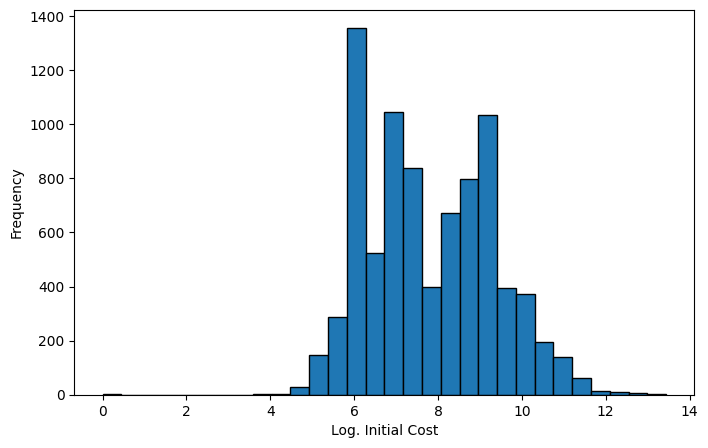

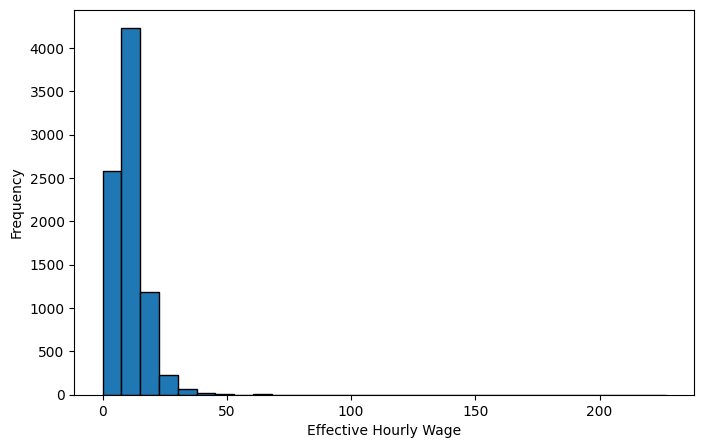

In [ ]:
# ======================
# 6.2 Feature Inclusion
# ======================

# Feature n°1: Logarithmic Initial Cost
df2['log_cout_init'] = np.log(df2['cout_init'])

# Histogram
plt.figure(figsize=(8, 5))
plt.hist(df2['log_cout_init'], bins=30, edgecolor='k')
plt.xlabel('Log. Initial Cost')
plt.ylabel('Frequency')

# Feature n°4: Effective Hourly Wage
# Check for any zero or missing values in 'heure_par_semaine' to avoid division errors
if (df2['heure_par_semaine'] == 0).any():
    print("Warning: Found zero values in 'heure_par_semaine'. Replacing them with NaN.")
    df2.loc[df2['heure_par_semaine'] == 0, 'heure_par_semaine'] = np.nan

# Create the 'effective_hourly_wage' feature
df2['effective_hourly_wage'] = df2['salaire_semaine'] / df2['heure_par_semaine']

# Optional: Handle missing or infinite values in the new feature
df2['effective_hourly_wage'] = df2['effective_hourly_wage'].replace([np.inf, -np.inf], np.nan)

# Display basic statistics of the new feature
print(df2['effective_hourly_wage'].describe())

# Histogram
plt.figure(figsize=(8, 5))
plt.hist(df2['effective_hourly_wage'], bins=30, edgecolor='k')
plt.xlabel('Effective Hourly Wage')
plt.ylabel('Frequency')

In [ ]:
# Feature n°3: claim_salary_category
# Create variable cou_init/(salaire_semaine*4)
df2['claim_salary'] = df2['cout_init'] / (df2['salaire_semaine'] * 4)

# Define bins and labels for categorization
bins = [-float('inf'),1 , float('inf')]
labels = ['<1','>1']

# Categorize 'claim_salary' into the defined bins
df2['claim_salary_cat2'] = pd.cut(df2['claim_salary'], bins=bins, labels=labels, right=True)

# Display the distribution of the new category
print("Claim Salary Category Distribution:")
print(df2['claim_salary_cat2'].value_counts())


Claim Salary Category Distribution:
claim_salary_cat2
>1    4657
<1    3669
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text(0, 0.5, 'Frequency')

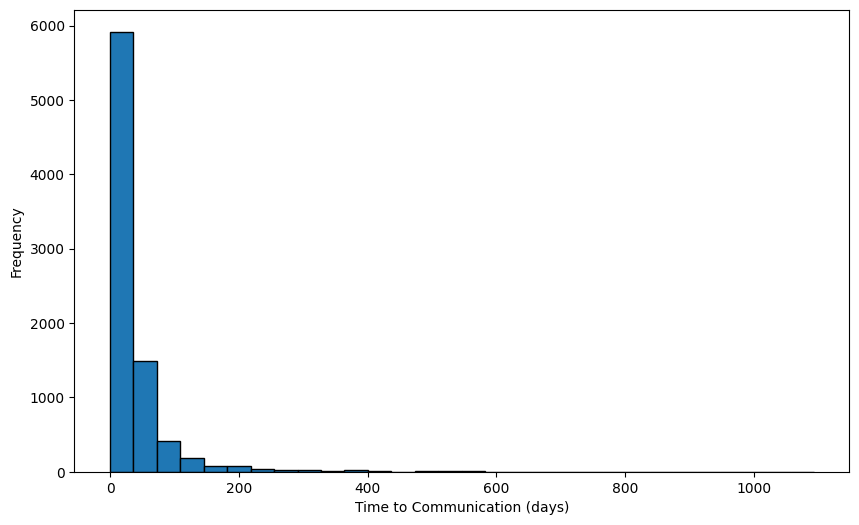

In [ ]:
# Feature n°4: Time-to-Communication
df2["date_accident"] = pd.to_datetime(df2["date_accident"])
df2["date_communication"] = pd.to_datetime(df2["date_communication"])
df2['time_to_com'] = (df2['date_communication'] - df2['date_accident']).dt.days

# Histogram of time_to_com
plt.figure(figsize=(10, 6))
plt.hist(df2['time_to_com'], bins=30, edgecolor='k')
plt.xlabel('Time to Communication (days)')
plt.ylabel('Frequency')

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


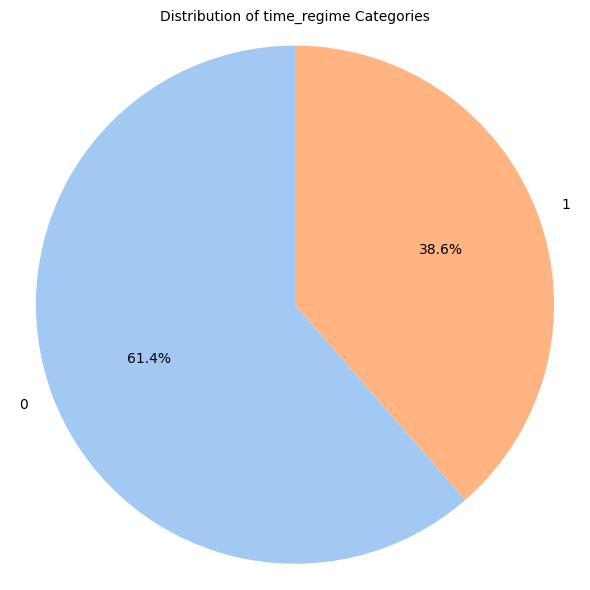

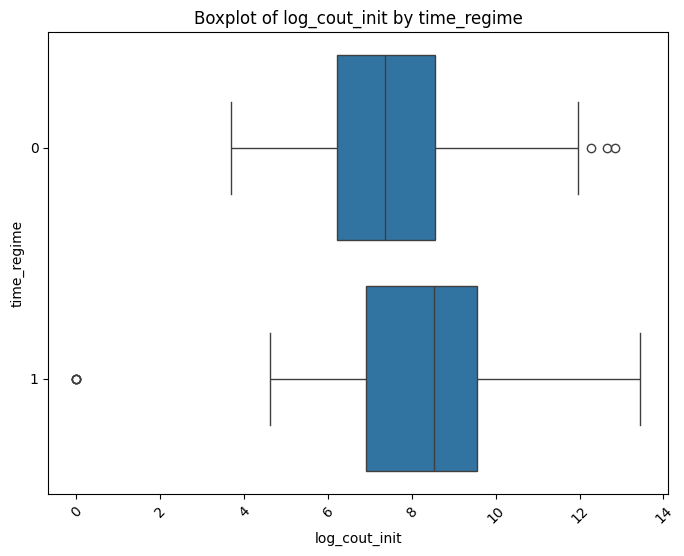

In [ ]:
# =========================================================================
# 4.1. Feature n°7: Binary Variable related to Time Regime
# =========================================================================

# Create a new variable in data that takes a value of 1 when date_accident is after than 1998 and 0 if before
df2['year_accident'] = df2['date_accident'].dt.year
df2['time_regime'] = np.where(df2['year_accident'] > 1998, 1, 0)

# Plot pie chart
df2["time_regime"] = df2["time_regime"].astype("category")

category_counts = df2['time_regime'].value_counts()

# Create a pie chart
fig, ax = plt.subplots(figsize=(6, 6))
colors = sns.color_palette('pastel')

ax.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90, colors=colors)
ax.set_title(f'Distribution of time_regime Categories', fontsize=10)

# Equal aspect ratio ensures the pie is circular
ax.axis('equal')

plt.tight_layout()
plt.show()


# Plot box plot per modality
plt.figure(figsize=(8, 6))
sns.boxplot(x=df2["log_cout_init"], y=df2["time_regime"])
plt.title(f"Boxplot of log_cout_init by time_regime")
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Feature n°5: Topic Dsitributions
data3 = df2

# Load trained dictionary and LDA model from CODE 1
with open("lda_dictionary.pkl", "rb") as f:
    dictionary = pickle.load(f)

lda_model = LdaModel.load("lda_model")

# Apply the same preprocessing function
descriptions = data3['description'].dropna().str.lower()
preprocessed_descriptions = descriptions.apply(preprocess_text)

# Convert text to BoW representation using the **same dictionary**
corpus = [dictionary.doc2bow(text) for text in preprocessed_descriptions]

# Get topic distributions using the trained LDA model
def get_topic_distribution(text):
    bow = dictionary.doc2bow(text)
    topic_dist = lda_model.get_document_topics(bow, minimum_probability=0.0)
    return [prob for _, prob in topic_dist]

data_topics = preprocessed_descriptions.apply(get_topic_distribution)

# Convert to DataFrame and add to original dataset
topic_columns = [f"topic_{i}" for i in range(num_topics)]
topic_df = pd.DataFrame(data_topics.tolist(), columns=topic_columns)
data3 = pd.concat([data3.reset_index(drop=True), topic_df], axis=1)

# Save the updated dataset
data3.to_csv("out_of_sample_enriched.csv", index=False)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# ===============================================================
# 1. Prepare the Live Data
# ===============================================================
# Ensure the column names match the original training dataset
live_data = data3[
    [
        "log_cout_init",
        "topic_0",
        "topic_1",
        "topic_2",
        "topic_3",
        "time_to_com",
        "sexe",
        "effective_hourly_wage",
        "claim_salary_cat2",
        'time_regime'
    ]
]

# ===============================================================
# 2. Apply Preprocessing to the Live Data
# ===============================================================
# Ensure the same transformations as the training data
live_data_preprocessed = preprocessor.transform(data3)

# ===============================================================
# 3. Make Predictions (Log Space)
# ===============================================================
# Predict `log_cout_final` using the trained CatBoost model
log_cout_final_predictions = best_model.predict(live_data_preprocessed)

# Back-transform predictions to original `cout_final`
df2["predicted_cout_final"] = np.exp(log_cout_final_predictions)

# ===============================================================
# 4. Add Predictions to the Live Data
# ===============================================================
# Combine the predictions with the live data
print("Live Data with Predicted cout_final:")
df2

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Live Data with Predicted cout_final:


,Identifiant,date_accident,date_communication,age,sexe,status_marital,enfants,autre_dep,salaire_semaine,patrimoine,...,cout_init,Y,log_cout_init,effective_hourly_wage,claim_salary,claim_salary_cat2,time_to_com,year_accident,time_regime,predicted_cout_final
0,W1000000,2002-04-29 19:00:00+00:00,2002-06-12 00:00:00+00:00,26,M,S,0,0,528.40,279101,...,9000,NaN,9.104980,13.210000,4.258138,>1,43,2002,1,9046.177475
1,W1000001,2003-12-08 15:00:00+00:00,2004-01-04 00:00:00+00:00,20,M,S,0,0,500.00,82053,...,1000,NaN,6.907755,13.157895,0.500000,<1,26,2003,1,740.348522
2,W1000002,2002-12-19 15:00:00+00:00,2003-01-28 00:00:00+00:00,46,M,S,0,0,709.55,35549,...,2000,NaN,7.600902,20.272857,0.704672,<1,39,2002,1,2087.289315
3,W1000003,2003-05-20 11:00:00+00:00,2003-06-17 00:00:00+00:00,43,M,S,0,0,500.00,705850,...,5000,NaN,8.517193,13.157895,2.500000,>1,27,2003,1,5782.804889
4,W1000004,1996-02-09 15:00:00+00:00,1996-08-12 00:00:00+00:00,18,F,S,0,0,200.00,961486,...,1300,NaN,7.170120,10.000000,1.625000,>1,184,1996,0,1015.435560
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8321,W1008321,2000-01-11 15:00:00+00:00,2000-02-09 00:00:00+00:00,28,M,S,0,0,200.00,642720,...,25000,NaN,10.126631,5.263158,31.250000,>1,28,2000,1,28615.627963
8322,W1008322,2002-11-29 09:00:00+00:00,2002-12-16 00:00:00+00:00,18,M,S,0,0,500.00,183221,...,1000,NaN,6.907755,12.500000,0.500000,<1,16,2002,1,740.543764
8323,W1008323,1989-01-11 16:00:00+00:00,1989-02-23 00:00:00+00:00,34,F,S,0,0,300.00,623288,...,210,NaN,5.347108,7.894737,0.175000,<1,42,1989,0,2229.229617
8324,W1008324,1995-12-08 16:00:00+00:00,1995-12-25 00:00:00+00:00,35,F,S,0,0,257.25,857221,...,500,NaN,6.214608,10.946809,0.485909,<1,16,1995,0,934.904472


In [ ]:
df2.sort_values(by='date_accident')

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text(0, 0.5, 'Frequency')

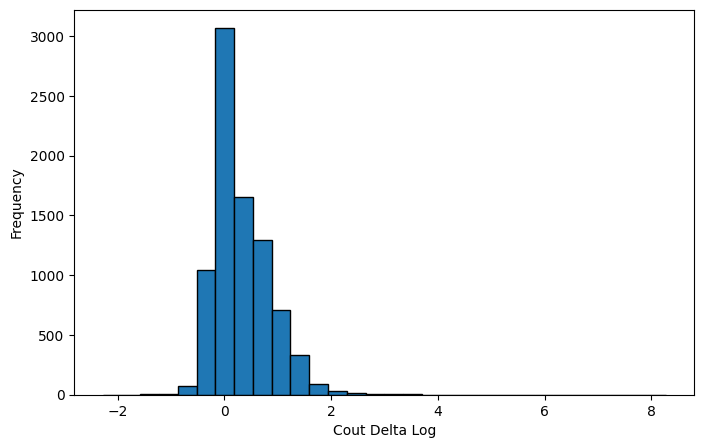

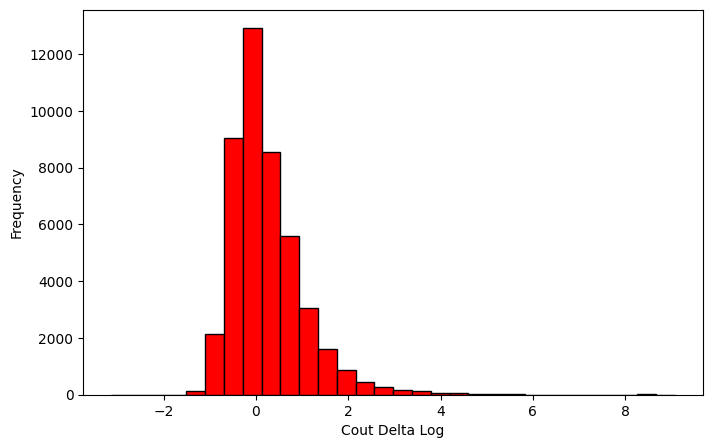

In [ ]:
# Visualizing de distribution of the cout_delta_predicted variable
# Create variable to compute difference between cout_init and cout_ultime
df2['cout_delta_2'] = np.log(df2['predicted_cout_final']/df2['cout_init'])

# Histogram of cout_delta
plt.figure(figsize=(8, 5))
plt.hist (df2['cout_delta_2'], bins=30, edgecolor='k')
plt.xlabel('Cout Delta Log')
plt.ylabel('Frequency')

# Create variable to compute difference between cout_init and cout_ultime
df['cout_delta'] = np.log(df['cout_ultime']/df['cout_init'])

# Histogram of cout_delta
plt.figure(figsize=(8, 5))
plt.hist (df['cout_delta'], bins=30, edgecolor='k', color='red')
plt.xlabel('Cout Delta Log')
plt.ylabel('Frequency')

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


K-S Test statistic: 0.2015, p-value: 1.2503e-250
T-Test statistic: -10.2831, p-value: 9.9965e-25


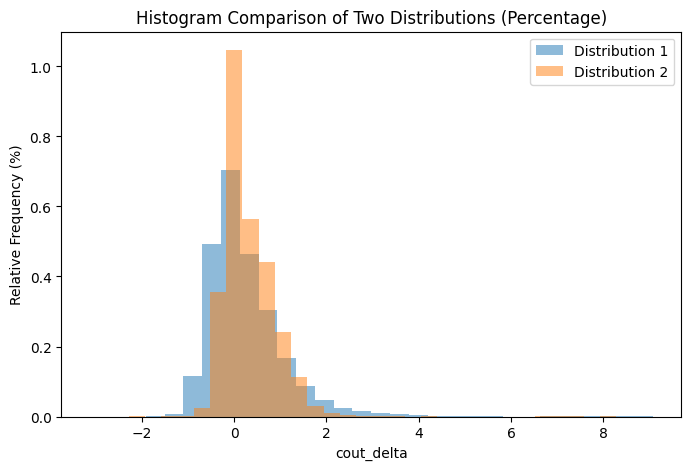

In [ ]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

# Example: Creating a DataFrame with two separate distributions in different columns

# Extract each distribution (array) from the respective columns
dist1 = df['cout_delta']
dist2 = df2['cout_delta_2']

# 1. Kolmogorov-Smirnov test (non-parametric)
ks_stat, ks_pval = stats.ks_2samp(dist1, dist2)
print(f"K-S Test statistic: {ks_stat:.4f}, p-value: {ks_pval:.4e}")

# 2. T-test (parametric)
t_stat, t_pval = stats.ttest_ind(dist1, dist2, equal_var=False)  # Welch's t-test
print(f"T-Test statistic: {t_stat:.4f}, p-value: {t_pval:.4e}")

plt.figure(figsize=(8, 5))
plt.hist(dist1, bins=30, alpha=0.5, label='Distribution 1', density=True)
plt.hist(dist2, bins=30, alpha=0.5, label='Distribution 2', density=True)
plt.legend()
plt.title("Histogram Comparison of Two Distributions (Percentage)")
plt.xlabel("cout_delta")
plt.ylabel("Relative Frequency (%)")
plt.show()

In [ ]:
from scipy.stats import mannwhitneyu

# Perform the Mann-Whitney U test
u_stat, u_pval = mannwhitneyu(dist1, dist2, alternative='two-sided')
print(f"Mann-Whitney U Test statistic: {u_stat:.4f}, p-value: {u_pval:.4e}")


Mann-Whitney U Test statistic: 158941013.0000, p-value: 1.7140e-110


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Cohen's d
mean_diff = dist1.mean() - dist2.mean()
pooled_std = np.sqrt((dist1.var(ddof=1) + dist2.var(ddof=1)) / 2)
cohens_d = mean_diff / pooled_std
print(f"Cohen's d: {cohens_d:.4f}")


Cohen's d: -0.1049


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


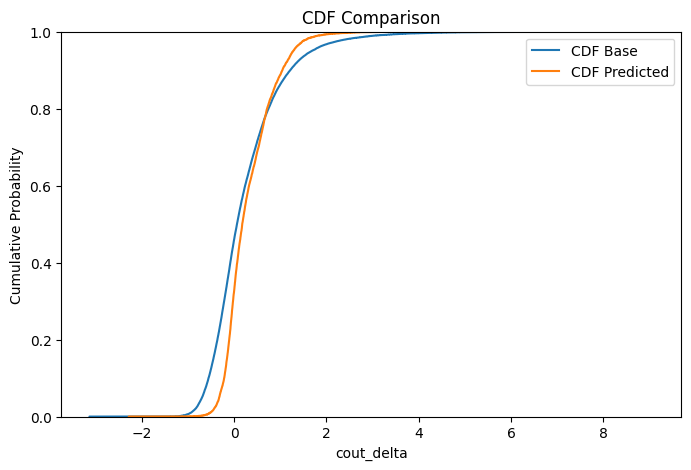

In [ ]:
# Plot CDFs
plt.figure(figsize=(8, 5))
sns.ecdfplot(dist1, label='CDF Base')
sns.ecdfplot(dist2, label='CDF Predicted')
plt.title("CDF Comparison")
plt.xlabel("cout_delta")
plt.ylabel("Cumulative Probability")
plt.legend()
plt.show()


In [ ]:
df['cout_delta'].to_csv('cout_delta.csv', index=False)

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# For QQ plot data calculation
from scipy.stats import probplot
import plotly.express as px
import plotly.graph_objects as go

# 7b: QQ plots using plotly
def qqplot_plotly(residuals, model_name):
    # Calculate theoretical quantiles and sample quantiles
    qq = probplot(residuals, dist="norm")
    theoretical_q = qq[0][0]
    sample_q = qq[0][1]
    slope, intercept = qq[1][0], qq[1][1]

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=theoretical_q, y=sample_q, mode='markers', name='Data'))
    # line of best fit
    line_y = slope*theoretical_q + intercept
    fig.add_trace(go.Scatter(x=theoretical_q, y=line_y, mode='lines', name='Best Fit Line'))
    fig.update_layout(title=f"QQ Plot of Residuals - {model_name}",
                      xaxis_title='Theoretical Quantiles',
                      yaxis_title='Sample Quantiles')
    fig.show()


residuals = y_test - y_pred
model_name = "CatBoost"
qqplot_plotly(residuals, model_name)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# 5. Modelling Bis: Using the Huber Loss Function for better Tail Prediction

In [ ]:
import time
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from catboost import CatBoostRegressor

# ========================
# 1. Prepare Your Data
# ========================
# Target and features
y = df1["log_cout_ultime"]
X = df1[
    [
        "log_cout_init",
        "topic_0",
        "topic_1",
        "topic_2",
        "topic_3",
        "time_to_com",
        "sexe",
        "effective_hourly_wage",
        "claim_salary_cat2",
        "time_regime"
    ]
]


# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define numeric and categorical features
numeric_features = [
    "log_cout_init",
    "topic_0",
    "topic_1",
    "topic_2",
    "topic_3",
    "time_to_com",
    "effective_hourly_wage"
]

categorical_features = [
    "sexe",
    "claim_salary_cat2",
    "time_regime"
]

# Create preprocessing pipelines
numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(drop="first"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features)
    ]
)

# Fit/Transform
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# ===========================
# 2. CatBoost with Huber Loss
# ===========================
best_params = {
    "iterations": 563,
    "depth": 4,
    "learning_rate": 0.09051248293919999,
    "l2_leaf_reg": 9.939922445265612,
    "bagging_temperature": 0.6764681716034767,
    "random_strength": 0.048519695985717926,
    "border_count": 90,
    "loss_function": "Huber:delta=0.1",  # Huber loss with delta = 0.1
    "random_seed": 42,
    "verbose": 0
}

catboost_model = CatBoostRegressor(**best_params)
catboost_model.fit(X_train_preprocessed, y_train)

# =============================
# 3. Prediction & Evaluation
# =============================
start_time = time.time()
y_pred_catboost = catboost_model.predict(X_test_preprocessed)
end_time = time.time()
catboost_inference_time = end_time - start_time

catboost_rmse = np.sqrt(mean_squared_error(y_test, y_pred_catboost))
catboost_mae = mean_absolute_error(y_test, y_pred_catboost)
catboost_r2 = r2_score(y_test, y_pred_catboost)

print(f"CatBoost with Huber Loss:\n"
      f"  RMSE = {catboost_rmse:.2f}\n"
      f"  MAE = {catboost_mae:.2f}\n"
      f"  R2  = {catboost_r2:.2f}\n"
      f"  Inference Time = {catboost_inference_time:.4f} seconds\n")


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



CatBoost with Huber Loss:
  RMSE = 0.70
  MAE = 0.43
  R2  = 0.79
  Inference Time = 0.0804 seconds



In [ ]:
# ===============================================================
# 3. Make Predictions (Log Space)
# ===============================================================

# Ensure the column names match the original training dataset
live_data = data3[
    [
        "log_cout_init",
        "topic_0",
        "topic_1",
        "topic_2",
        "topic_3",
        "time_to_com",
        "sexe",
        "effective_hourly_wage",
        "claim_salary_cat2",
        'time_regime'
    ]
]

# ===============================================================
# 2. Apply Preprocessing to the Live Data
# ===============================================================
# Ensure the same transformations as the training data
live_data_preprocessed = preprocessor.transform(data3)

# Predict `log_cout_final` using the trained CatBoost model
log_cout_final_predictions = catboost_model.predict(live_data_preprocessed)

# Back-transform predictions to original `cout_final`
df2["predicted_cout_final"] = np.exp(log_cout_final_predictions)

# ===============================================================
# 4. Add Predictions to the Live Data
# ===============================================================
# Combine the predictions with the live data
print("Live Data with Predicted cout_final:")
df2

Live Data with Predicted cout_final:


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Identifiant,date_accident,date_communication,age,sexe,status_marital,enfants,autre_dep,salaire_semaine,patrimoine,...,Y,log_cout_init,effective_hourly_wage,claim_salary,claim_salary_cat2,time_to_com,year_accident,time_regime,predicted_cout_final,cout_delta_2
0,W1000000,2002-04-29 19:00:00+00:00,2002-06-12 00:00:00+00:00,26,M,S,0,0,528.40,279101,...,NaN,9.104980,13.210000,4.258138,>1,43,2002,1,7199.127981,-0.223265
1,W1000001,2003-12-08 15:00:00+00:00,2004-01-04 00:00:00+00:00,20,M,S,0,0,500.00,82053,...,NaN,6.907755,13.157895,0.500000,<1,26,2003,1,764.258220,-0.268850
2,W1000002,2002-12-19 15:00:00+00:00,2003-01-28 00:00:00+00:00,46,M,S,0,0,709.55,35549,...,NaN,7.600902,20.272857,0.704672,<1,39,2002,1,1728.221787,-0.146054
3,W1000003,2003-05-20 11:00:00+00:00,2003-06-17 00:00:00+00:00,43,M,S,0,0,500.00,705850,...,NaN,8.517193,13.157895,2.500000,>1,27,2003,1,4324.713630,-0.145092
4,W1000004,1996-02-09 15:00:00+00:00,1996-08-12 00:00:00+00:00,18,F,S,0,0,200.00,961486,...,NaN,7.170120,10.000000,1.625000,>1,184,1996,0,1203.067631,-0.077490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8321,W1008321,2000-01-11 15:00:00+00:00,2000-02-09 00:00:00+00:00,28,M,S,0,0,200.00,642720,...,NaN,10.126631,5.263158,31.250000,>1,28,2000,1,19051.261289,-0.271743
8322,W1008322,2002-11-29 09:00:00+00:00,2002-12-16 00:00:00+00:00,18,M,S,0,0,500.00,183221,...,NaN,6.907755,12.500000,0.500000,<1,16,2002,1,1258.916985,0.230252
8323,W1008323,1989-01-11 16:00:00+00:00,1989-02-23 00:00:00+00:00,34,F,S,0,0,300.00,623288,...,NaN,5.347108,7.894737,0.175000,<1,42,1989,0,1640.671262,2.055753
8324,W1008324,1995-12-08 16:00:00+00:00,1995-12-25 00:00:00+00:00,35,F,S,0,0,257.25,857221,...,NaN,6.214608,10.946809,0.485909,<1,16,1995,0,790.309439,0.457816


In [ ]:
# Export df2 to an excel file by converting it previously to a df_final with only the coloumns of the original df2 and e¿replace coloumn y with coloumn predicted_cout_final
df_final = df2.copy()

# Replace the values in the 'y' column with those from 'predicted_cout_final'
df_final['Y'] = df_final['predicted_cout_final']

cols_to_drop = [
    'log_cout_init',
    'effective_hourly_wage',
    'claim_salary',
    'claim_salary_cat2',
    'time_to_com',
    'year_accident',
    'time_regime',
    'predicted_cout_final',
    'cout_delta_2'
]

# Drop the specified columns
df_final.drop(columns=cols_to_drop, inplace=True)

# Export df_final to an Excel file (the file will be created in the current working directory)
for col in df_final.columns:
    if pd.api.types.is_datetime64tz_dtype(df_final[col]):
        df_final[col] = df_final[col].dt.tz_localize(None)

# Now export df_final to an Excel file
df_final.to_excel('df_final.xlsx', index=False)

print("Data exported to 'df_final.xlsx' successfully.")

In [ ]:
df_final

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Identifiant,date_accident,date_communication,age,sexe,status_marital,enfants,autre_dep,salaire_semaine,patrimoine,type_emploi,heure_par_semaine,jour_par_semaine,description,cout_init,Y
0,W1000000,2002-04-29 19:00:00,2002-06-12,26,M,S,0,0,528.40,279101,F,40.0,5,MOTOR VEHICLE ACCIDENT ACCIDENT LIGHT POLE AND...,9000,7199.127981
1,W1000001,2003-12-08 15:00:00,2004-01-04,20,M,S,0,0,500.00,82053,F,38.0,5,STRUCK METAL FOREIGN BODY RIGHT EYE,1000,764.258220
2,W1000002,2002-12-19 15:00:00,2003-01-28,46,M,S,0,0,709.55,35549,F,35.0,5,PARTICLE METAL FOREIGN BODY RIGHT CORNEA,2000,1728.221787
3,W1000003,2003-05-20 11:00:00,2003-06-17,43,M,S,0,0,500.00,705850,F,38.0,5,PLAYING VOLLEY BALL BROKEN BIG TOE,5000,4324.713630
4,W1000004,1996-02-09 15:00:00,1996-08-12,18,F,S,0,0,200.00,961486,P,20.0,3,STRUCK WITH KNIFE LACERATION LEFT RING FINGER,1300,1203.067631
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8321,W1008321,2000-01-11 15:00:00,2000-02-09,28,M,S,0,0,200.00,642720,F,38.0,5,STRUCK BOX LEFT ELBOW FRACTURED LEFT THUMB,25000,19051.261289
8322,W1008322,2002-11-29 09:00:00,2002-12-16,18,M,S,0,0,500.00,183221,F,40.0,5,CHEMICAL SPLASH CHEMICAL BURNING RIGHT EYE,1000,1258.916985
8323,W1008323,1989-01-11 16:00:00,1989-02-23,34,F,S,0,0,300.00,623288,F,38.0,5,FELL OVER ONTO ARM BRUISED LOWER BACK PAIN,210,1640.671262
8324,W1008324,1995-12-08 16:00:00,1995-12-25,35,F,S,0,0,257.25,857221,F,23.5,5,DRILL JAMMED FRACTURED RIGHT FINGER,500,790.309439


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Text(0, 0.5, 'Frequency')

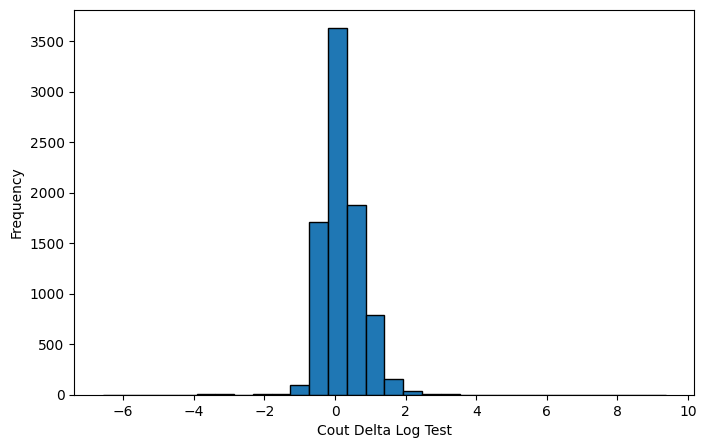

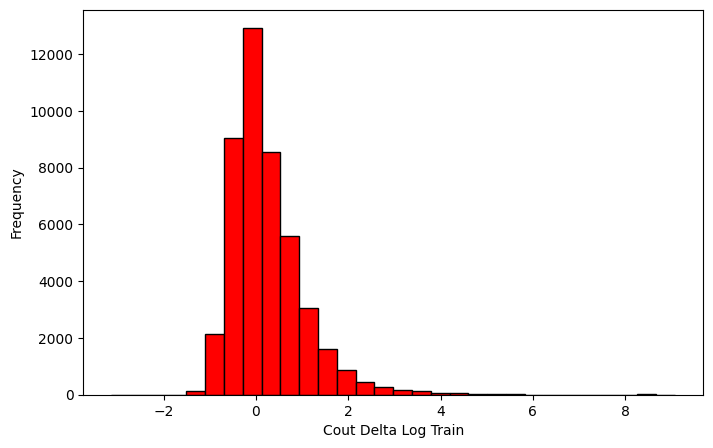

In [ ]:
# Visualizing de distribution of the cout_delta_predicted variable
# Create variable to compute difference between cout_init and cout_ultime
df2['cout_delta_2'] = np.log(df2['predicted_cout_final']/df2['cout_init'])

# Histogram of cout_delta
plt.figure(figsize=(8, 5))
plt.hist (df2['cout_delta_2'], bins=30, edgecolor='k')
plt.xlabel('Cout Delta Log Test')
plt.ylabel('Frequency')

# Create variable to compute difference between cout_init and cout_ultime
df['cout_delta'] = np.log(df['cout_ultime']/df['cout_init'])

# Histogram of cout_delta
plt.figure(figsize=(8, 5))
plt.hist (df['cout_delta'], bins=30, edgecolor='k', color='red')
plt.xlabel('Cout Delta Log Train')
plt.ylabel('Frequency')

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



K-S Test statistic: 0.1010, p-value: 7.8032e-63
T-Test statistic: 7.0844, p-value: 1.4581e-12


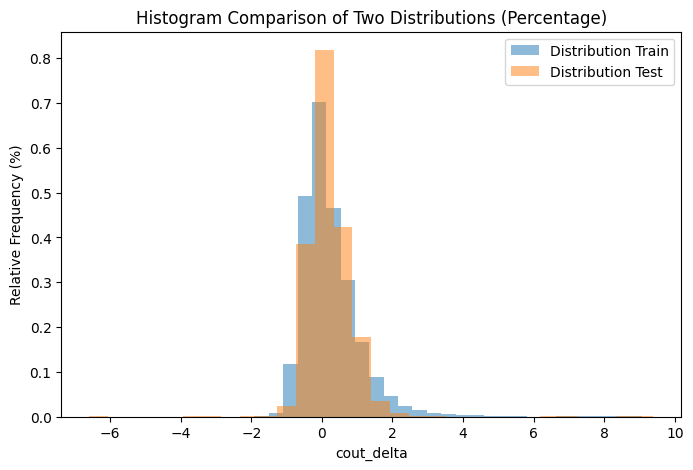

In [ ]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

# Example: Creating a DataFrame with two separate distributions in different columns

# Extract each distribution (array) from the respective columns
dist1 = df['cout_delta']
dist2 = df2['cout_delta_2']

# 1. Kolmogorov-Smirnov test (non-parametric)
ks_stat, ks_pval = stats.ks_2samp(dist1, dist2)
print(f"K-S Test statistic: {ks_stat:.4f}, p-value: {ks_pval:.4e}")

# 2. T-test (parametric)
t_stat, t_pval = stats.ttest_ind(dist1, dist2, equal_var=False)  # Welch's t-test
print(f"T-Test statistic: {t_stat:.4f}, p-value: {t_pval:.4e}")

plt.figure(figsize=(8, 5))
plt.hist(dist1, bins=30, alpha=0.5, label='Distribution Train', density=True)
plt.hist(dist2, bins=30, alpha=0.5, label='Distribution Test', density=True)
plt.legend()
plt.title("Histogram Comparison of Two Distributions (Percentage)")
plt.xlabel("cout_delta")
plt.ylabel("Relative Frequency (%)")
plt.show()

In [ ]:
# Cohen's d
mean_diff = dist1.mean() - dist2.mean()
pooled_std = np.sqrt((dist1.var(ddof=1) + dist2.var(ddof=1)) / 2)
cohens_d = mean_diff / pooled_std
print(f"Cohen's d: {cohens_d:.4f}")


Cohen's d: 0.0746


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



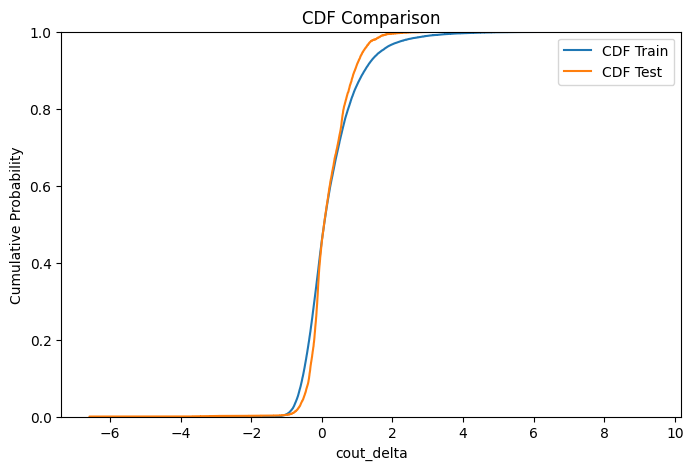

In [ ]:
# Plot CDFs
plt.figure(figsize=(8, 5))
sns.ecdfplot(dist1, label='CDF Train')
sns.ecdfplot(dist2, label='CDF Test')
plt.title("CDF Comparison")
plt.xlabel("cout_delta")
plt.ylabel("Cumulative Probability")
plt.legend()
plt.show()


In [ ]:
# For QQ plot data calculation
from scipy.stats import probplot
import plotly.express as px
import plotly.graph_objects as go

# 7b: QQ plots using plotly
def qqplot_plotly(residuals, model_name):
    # Calculate theoretical quantiles and sample quantiles
    qq = probplot(residuals, dist="norm")
    theoretical_q = qq[0][0]
    sample_q = qq[0][1]
    slope, intercept = qq[1][0], qq[1][1]

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=theoretical_q, y=sample_q, mode='markers', name='Data'))
    # line of best fit
    line_y = slope*theoretical_q + intercept
    fig.add_trace(go.Scatter(x=theoretical_q, y=line_y, mode='lines', name='Best Fit Line'))
    fig.update_layout(title=f"QQ Plot of Residuals - {model_name}",
                      xaxis_title='Theoretical Quantiles',
                      yaxis_title='Sample Quantiles')
    fig.show()


residuals = y_test - y_pred
model_name = "CatBoost"
qqplot_plotly(residuals, model_name)


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## ANNEXE. ASSESING THE IMPORTANCE OF THE PATRIMOINE VARIABLE

In our initial model, we chose to avoid unnecessary complexity by not estimating or predicting the Patrimoine variable, which had 80% missing values. However, it is important to justify this decision by assessing the significance of Patrimoine in our selected regression model, using the 20% of the dataset where this variable is available. The following analysis shows that Patrimoine contributes only 3.5% to feature importance in the CatBoost regression model, supporting our decision to exclude it and avoid introducing potential errors through imputation.

For the entire code, please visit https://colab.research.google.com/drive/1Ph6fi6S8SdXfkfqaLIho0K92-6AM4rJk?usp=sharing.

| Feature                 | Importance  |
|-------------------------|------------|
| log_cout_init          | 51.9925     |
| topic_1                | 8.5319      |
| topic_2                | 7.7355      |
| topic_3                | 7.0667      |
| effective_hourly_wage  | 6.1133      |
| topic_0                | 5.4167      |
| topic_4                | 3.7866      |
| log_patrimoine         | 3.6130      |
| time_to_com            | 3.3738      |
| time_regime_1          | 1.5129      |
| claim_salary_cat2_>1   | 0.4803      |
| sexe_M                 | 0.3768      |

*Table 1. Feature Importance Scores (%) for the CatBoost Regression using available observations of Patrimoine*

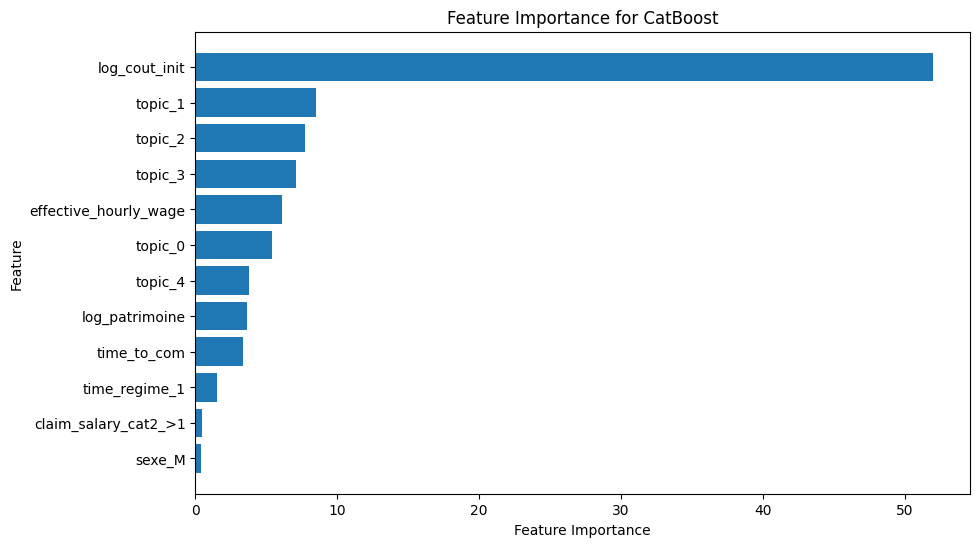

*Figure 1. Feature Importance Scores for the CatBoost Regression using available observations of Patrimoine*